## Naming Rules
rmse_value:
feature_method+model

plot_of_each_method:
feature_method+model

In [1]:
#Basic Computation
import numpy as np
from numpy import arange
import pandas as pd
from scipy import stats
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#Feature Selection Metrics
from statsmodels.tsa import stattools
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from pandas.plotting import autocorrelation_plot
from pandas.plotting import lag_plot
from sklearn.feature_selection import mutual_info_regression
from sklearn.metrics import mutual_info_score
from minepy import MINE
from minepy import cstats

#Preprocessing and performance evaluation
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import r2_score
from math import log,pi,hypot,fabs,sqrt

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

# grid search hyperparameters for ridge regression
from sklearn.model_selection import GridSearchCV
from tensorflow import keras

# Predition Model
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import SelectKBest
import xgboost
from xgboost.sklearn import XGBRegressor
from xgboost import plot_importance
import lightgbm as lgb

import warnings
warnings.filterwarnings('ignore')
OUTDATED_IGNORE=1
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"
from sklearn.feature_selection import SelectFromModel
from sklearn.pipeline import Pipeline
import copy

In [23]:
%%time
power = pd.read_csv(".\dataset\household_power_consumption.txt\household_power_consumption.txt",
                    header = 0,
                    sep = ";",
                    parse_dates={'date_time' : ['Date', 'Time']}, infer_datetime_format=True, 
                    low_memory=False, na_values=['nan','?'], index_col='date_time'
                   )

# Make the missing value the average of a column
for j in range(0,7):
    power.iloc[:,j]=power.iloc[:,j].fillna(power.iloc[:,j].mean())
    
#Resample data to daily frequency
data = power.resample('D').sum()

Wall time: 13.3 s


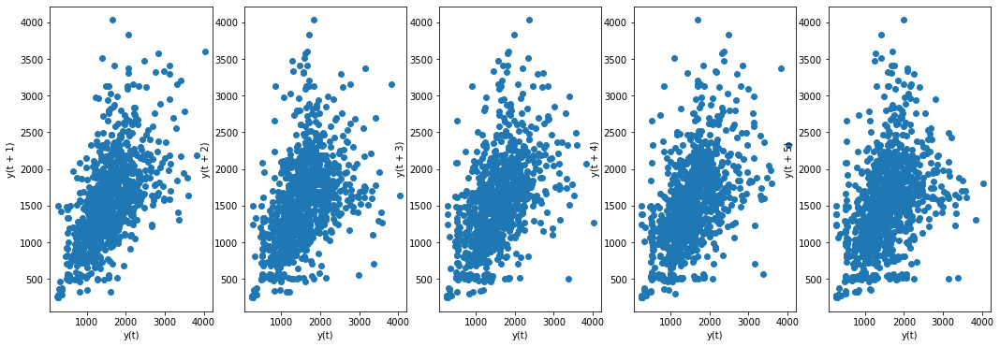

In [48]:
fig,ax = plt.subplots(1,5,figsize=(18,6))
for i in range(1,6):
    lag_plot(X_train_no.iloc[:,0],lag=i,ax=ax[i-1])

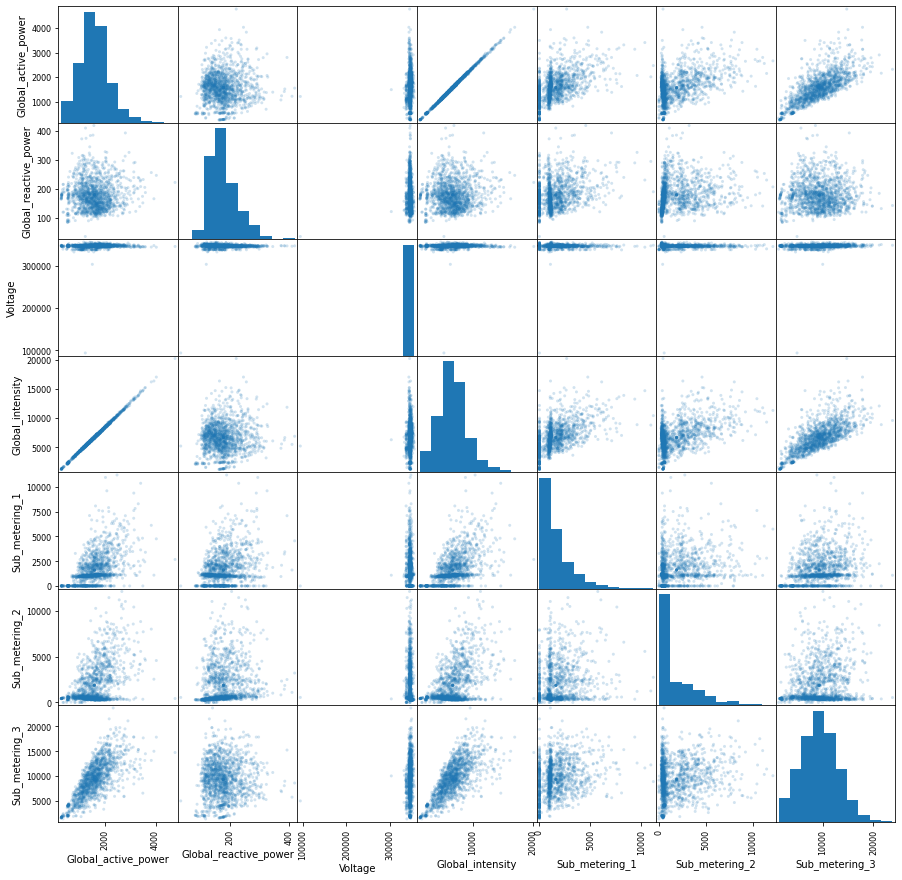

In [53]:
pd.plotting.scatter_matrix(data, alpha=0.2,figsize=(15,15))
plt.show()

#### Compute Mutual Information Scores between X and Y

In [58]:
mi_xy = {}
for i in X_train_lag.columns:
    mi_xy[i]=mutual_info_regression(X_train_lag[i].values.reshape(-1,1),Y_train_lag)[0]
mi_xy = pd.Series(mi_xy)

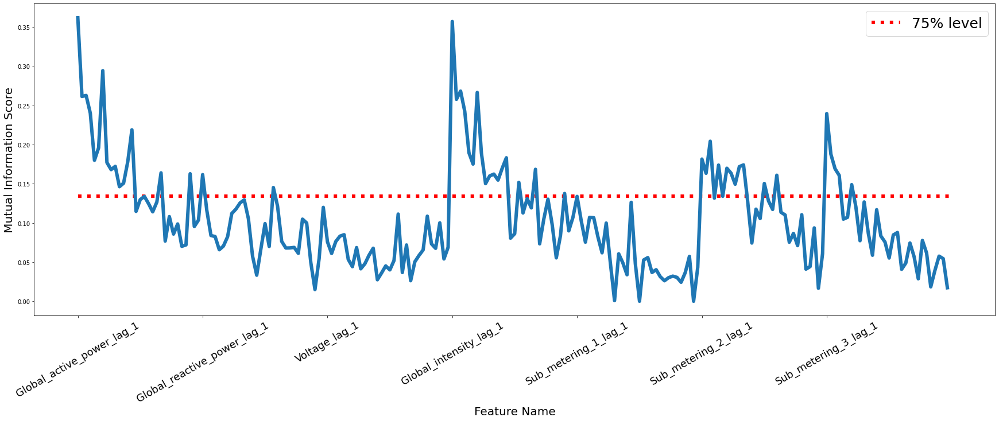

In [93]:
plt.figure(figsize=(30,10))
plt.plot(mi_xy,linewidth=6)
plt.hlines(mi_xy.quantile(q=0.75),0,len(mi_xy),color='r',linestyle='dotted',label='75% level',linewidth=6)
plt.xticks(range(0,len(mi_xy.index),30),fontsize=18,rotation=30)
plt.legend(fontsize=25)
plt.xlabel("Feature Name",fontsize=20)
plt.ylabel("Mutual Information Score",fontsize=20)
plt.savefig('./pic/Correlation Pic/Electricity/MI_eElectricity.png')
plt.show()

### Plot ACF of each time series

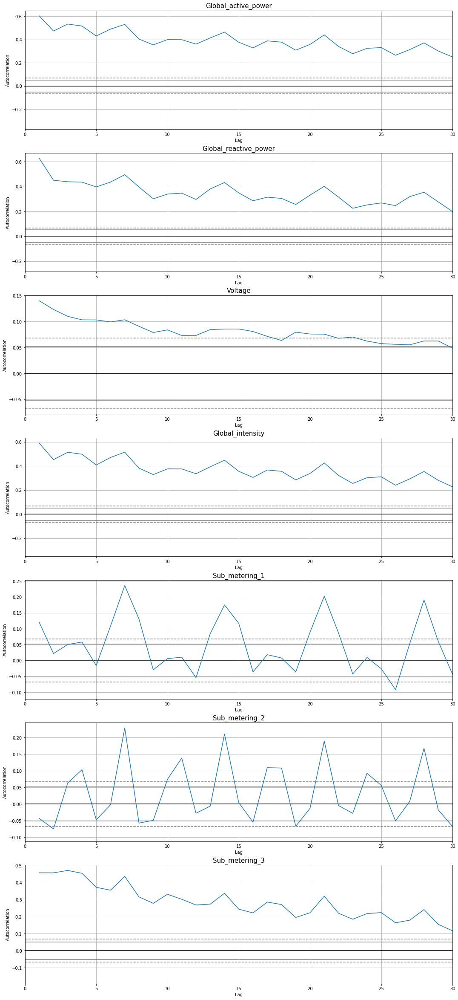

In [115]:
fig,ax = plt.subplots(7,1,figsize=(18,42))
for i in range(data.shape[1]):
    ax[i].set_title(data.columns[i],fontsize=15)
    autocorrelation_plot(data.iloc[:,i],ax = ax[i]).set_xlim([0, 30])
plt.savefig('./pic/Correlation Pic/Electricity/lag_electricity.png')

In [3]:
data = pd.read_csv("electricity_resample.csv",index_col=0)

In [5]:
data.shape

(1442, 7)

### Plot Correlation Matrix

Get an overview of the relationship between time series

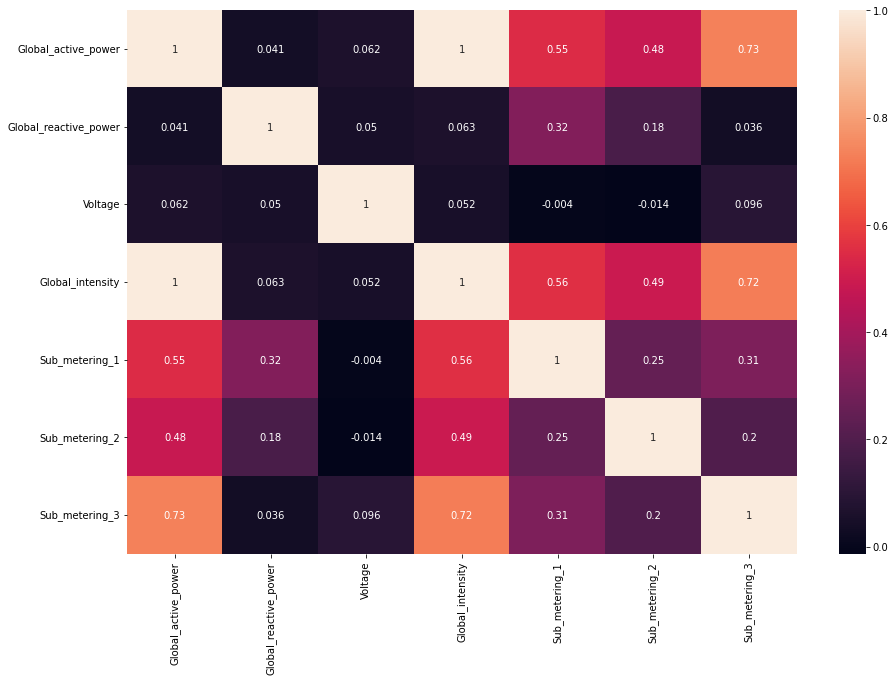

In [4]:
plt.figure(figsize=(15,10))
sns.heatmap(data.corr(), annot=True)
plt.savefig('./pic/Correlation Pic/Electricity/Corr_Map.png')

### Split Features and Target

In [24]:
def segment(data,col_name):
    Y = (data[col_name])
    X = data.drop(col_name,axis=1)
    return X,Y

In [25]:
# Split data into train,valid and test set
def Train_Valid_Test(data,train_percent,valid_percent,test_percent):
    train_len = int(data.shape[0]*train_percent)
    valid_len = int(data.shape[0]*(train_percent + valid_percent)) 
    train_df = data.iloc[:train_len,:]
    valid_df = data.iloc[train_len:valid_len,:]
    test_df = data.iloc[valid_len:,:]
    return train_df,valid_df,test_df
# Split dataset into train and test set
def Split_Part(data,percent):
    train_len = int(data.shape[0]*percent)
    train_df = data.iloc[:train_len,:]
    test_df = data.iloc[train_len:,:]
    return train_df,test_df

In [26]:
# Generate lags for each feature
# 1.We shift once for the target columns,then Y(t)->Y(t+1)
# 2.The orginal features are become X(t-1)
# 3.we shift features from 1 to max_lag-1
# 4.Then features become lags from 1 to max_lag
def lag_data(data,max_lag,target):
    X = data.copy()
    X_col = list(X.columns)
    X_col.remove(target)
    for col in X_col:
        for i in range(2,max_lag+1):
            X[col+'_lag_'+str(i)] = X[col].shift(i-1)
    for i in X_col:
        X.rename(columns ={i:i+'_lag_1'},inplace = True)
    X.dropna(inplace = True) 
    return X

# Belowing is another way to generate lags: shift the features directy from 1 to max_lag
# Which is not resonable enough
# def lag_feature_df(max_lag,data,target):
#     # Store each feature's dataframe:
#     X = pd.DataFrame()
#     X_col = list(data.columns)
#     X_col.remove(target)
#     feature_range = range(len(X_col))
#     for idx,col in enumerate(X_col):
#         for j in range(max_lag):
#             X[col+'_lag_'+str(j+1)] = data[col].shift(j)
#     X[target] = data[target].copy()
#     X.dropna(inplace=True)
#     return X

In [27]:
df = data.copy()
df['Global_active_power_1'] = df['Global_active_power'].shift(-1)
df.dropna(inplace=True)

df_no = data.copy()
df_no['Global_active_power_1'] = data['Global_active_power'].shift(-1)
df_no.dropna(inplace=True)

df_lag = lag_feature_df(30,df,'Global_active_power_1')

train_lag,valid_lag,test_lag = Train_Valid_Test(df_lag,0.7,0.1,0.2)

## Lagging
X_train_lag,Y_train_lag = segment(train_lag,'Global_active_power_1')
X_valid_lag,Y_valid_lag = segment(valid_lag,'Global_active_power_1')
X_test_lag,Y_test_lag = segment(test_lag,'Global_active_power_1')

train_no,valid_no,test_no = Train_Valid_Test(df_no.loc[df_lag.index],0.7,0.1,0.2)

## Original Data
X_train_no,Y_train_no = segment(train_no,'Global_active_power_1')
X_valid_no,Y_valid_no = segment(test_no,'Global_active_power_1')
X_test_no,Y_test_no = segment(test_no,'Global_active_power_1')

In [28]:
X_arr = X_train_lag.values

In [29]:
X_train_lag

,Global_active_power_lag_1,Global_active_power_lag_2,Global_active_power_lag_3,Global_active_power_lag_4,Global_active_power_lag_5,Global_active_power_lag_6,Global_active_power_lag_7,Global_active_power_lag_8,Global_active_power_lag_9,Global_active_power_lag_10,...,Sub_metering_3_lag_21,Sub_metering_3_lag_22,Sub_metering_3_lag_23,Sub_metering_3_lag_24,Sub_metering_3_lag_25,Sub_metering_3_lag_26,Sub_metering_3_lag_27,Sub_metering_3_lag_28,Sub_metering_3_lag_29,Sub_metering_3_lag_30
date_time,,,,,,,,,,,,,,,,,,,,,
2007-01-14,3008.907615,3186.814000,1461.296000,2255.194000,2154.800000,1869.054,2241.360,2447.620,1508.378,2713.364,...,5795.0,6891.0,14726.0,11131.0,10433.916895,14063.000000,6197.000000,14018.000000,13341.000000,4926.0
2007-01-15,2148.678000,3008.907615,3186.814000,1461.296000,2255.194000,2154.800,1869.054,2241.360,2447.620,1508.378,...,14979.0,5795.0,6891.0,14726.0,11131.000000,10433.916895,14063.000000,6197.000000,14018.000000,13341.0
2007-01-16,1686.404000,2148.678000,3008.907615,3186.814000,1461.296000,2255.194,2154.800,1869.054,2241.360,2447.620,...,6976.0,14979.0,5795.0,6891.0,14726.000000,11131.000000,10433.916895,14063.000000,6197.000000,14018.0
2007-01-17,2847.688000,1686.404000,2148.678000,3008.907615,3186.814000,1461.296,2255.194,2154.800,1869.054,2241.360,...,9176.0,6976.0,14979.0,5795.0,6891.000000,14726.000000,11131.000000,10433.916895,14063.000000,6197.0
2007-01-18,1821.462000,2847.688000,1686.404000,2148.678000,3008.907615,3186.814,1461.296,2255.194,2154.800,1869.054,...,11329.0,9176.0,6976.0,14979.0,5795.000000,6891.000000,14726.000000,11131.000000,10433.916895,14063.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2009-09-23,1636.610000,1246.536000,1417.868000,2035.328000,2135.710000,1374.032,1223.426,1743.162,1456.806,1574.858,...,5011.0,9921.0,6073.0,9974.0,10648.000000,11707.000000,7485.000000,4283.000000,7860.000000,6291.0
2009-09-24,1426.258000,1636.610000,1246.536000,1417.868000,2035.328000,2135.710,1374.032,1223.426,1743.162,1456.806,...,8095.0,5011.0,9921.0,6073.0,9974.000000,10648.000000,11707.000000,7485.000000,4283.000000,7860.0
2009-09-25,1161.016000,1426.258000,1636.610000,1246.536000,1417.868000,2035.328,2135.710,1374.032,1223.426,1743.162,...,10433.0,8095.0,5011.0,9921.0,6073.000000,9974.000000,10648.000000,11707.000000,7485.000000,4283.0


## Prediction Models

6 Models:

Linear Regression, Artifitial Neural Network,Random Forest,XGB,LGB,Support Vector Regression

In [15]:
def LR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    reg_Linear =  LinearRegression()
    reg_Linear.fit(x_train,y_train.reshape(-1,))
    y_Linear_a = reg_Linear.predict(x_test)
    y_Linear_a_inverse =minmax_y_test.inverse_transform(y_Linear_a.reshape((-1,1)))
    
    print(
        "Linear:rmse: ",sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
         "Linear:mae:",mean_absolute_error(y_Linear_a_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_Linear_a_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_Linear_a_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_Linear_a_inverse,y_test_inverse)
    }
    return error_metrics

In [16]:
def ANN_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    ann_model = keras.Sequential([
        keras.layers.Dense(500,activation='relu',input_shape=[x_train.shape[1]]),
        keras.layers.Dense(500,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(250,activation='relu'),
        keras.layers.Dense(1)])#最后输出为一个结果，也就是预测的值
        #定义损失函数loss，采用的优化器optimizer为Adam
    ann_model.compile(loss='mean_absolute_error',optimizer='Adam')
    
    ann_model.fit(x_train,y_train.reshape(-1,))
    y_ann_model = ann_model.predict(x_test)
    y_ann_model_inverse =minmax_y_test.inverse_transform(y_ann_model.reshape((-1,1)))
    
    print(
          "ANN_mae:%f"%(mean_absolute_error(y_ann_model_inverse, Y_test  ))+"\n",
          "ANN_rmse:%f"%(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  )))+"\n"
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_ann_model_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_ann_model_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_ann_model_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_ann_model_inverse, Y_test)
    }
    return error_metrics

In [17]:
def RF_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    rfr = RandomForestRegressor(max_depth=9)
#     param_grid = {"n_estimators":[10,100,300],"max_depth":range(1,31)}
#     grid_search = GridSearchCV(rfr,param_grid,cv = 3)

    rfr.fit(x_train,y_train.reshape(-1,))
    y_rfr = rfr.predict(x_test)
    y_rfr_inverse =minmax_y_test.inverse_transform(y_rfr.reshape((-1,1)))
    
    print(
          "RandomForest_mae:%f"%(mean_absolute_error(y_rfr_inverse, Y_test  ))+"\n",
          "RandomForest_rmse:%f"%(sqrt(mean_squared_error(y_rfr_inverse, Y_test  )))+"\n"
#           "elastic_mse:%f"%(mean_squared_error( y_elastic_inverse, Y_test  )),     
     )
    
#     y_df = {
#         "Original": Y_test.values,
#         'RandomForest_':y_rfr_inverse
#     }
    
    error_metrics = {
        "mae":(mean_absolute_error(y_rfr_inverse, Y_test  )),
        "rmse":(sqrt(mean_squared_error(y_rfr_inverse, Y_test  ))),
        'mape':mean_absolute_percentage_error(y_rfr_inverse, Y_test)
    }
    return error_metrics

In [18]:
def XGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))

    xgb = XGBRegressor(max_depth=3,
    learning_rate=0.1,
    n_estimators=100,
    objective='reg:squarederror', # 此默认参数与 XGBClassifier 不同
    booster='gbtree',
    gamma=0,
    min_child_weight=1,
    subsample=1,
    colsample_bytree=1,
    reg_alpha=0,
    reg_lambda=1,
    random_state=0)
    
    
    xgb.fit(x_train,y_train.reshape(-1,),eval_metric='rmse', verbose=50)
    y_xgb = xgb.predict(x_test)
    y_xgb_inverse =minmax_y_test.inverse_transform(y_xgb.reshape((-1,1)))
    
    print(
        "XGB rmse: ",sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
         "XGB mae:",mean_absolute_error(y_xgb_inverse,Y_test)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_xgb_inverse,Y_test)),
        "mae":mean_absolute_error(y_xgb_inverse,Y_test),
        'mape':mean_absolute_percentage_error(y_xgb_inverse,Y_test)
    }
    
    return error_metrics

In [19]:
def LGB_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    print(
        "LGB rmse: ",sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
         "LGB mae:",mean_absolute_error(y_gbm_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_gbm_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_gbm_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_gbm_inverse,y_test_inverse)
    }
    
    
    return error_metrics

In [20]:
def SVR_Model(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
#     parameters = {, 'gamma':np.logspace(-5, 0, num=6, base=2.0),'C':np.logspace(-5, 5, num=11, base=2.0)}
#     grid_search = GridSearchCV(, cv=10, n_jobs=4, scoring='neg_mean_squared_error')
    svr = SVR(kernel='rbf', C=1e3, gamma=0.01)
    svr.fit(x_train,y_train.reshape(-1,))
#     print(grid_search.best_params_)
    y_svr = svr.predict(x_test)
    
    y_svr_inverse = minmax_y_test.inverse_transform(y_svr.reshape((-1,1)))
    
    print(
        "SVR rmse: ",sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
         "SVR mae:",mean_absolute_error(y_svr_inverse,y_test_inverse)
    )
    
    
    error_metrics = {
        "rmse":sqrt(mean_squared_error(y_svr_inverse,y_test_inverse)),
        "mae":mean_absolute_error(y_svr_inverse,y_test_inverse),
        'mape':mean_absolute_percentage_error(y_svr_inverse,y_test_inverse)
    }
    
    return error_metrics

## BenchMark

In [21]:
def stacking_models(X_train,Y_train,X_test,Y_test):
    model_df =pd.DataFrame({
                 LR_Model.__name__:LR_Model(X_train,Y_train,X_test,Y_test),
                 RF_Model.__name__:RF_Model(X_train,Y_train,X_test,Y_test),
                 ANN_Model.__name__:ANN_Model(X_train,Y_train,X_test,Y_test),
                 XGB_Model.__name__:XGB_Model(X_train,Y_train,X_test,Y_test),
                 LGB_Model.__name__:LGB_Model(X_train,Y_train,X_test,Y_test),
                 SVR_Model.__name__:SVR_Model(X_train,Y_train,X_test,Y_test),
                }
                )
    return model_df

### Raw Data

In [32]:
raw_df = stacking_models(X_train_no,Y_train_no,X_test_no,Y_test_no)

Linear:rmse:  341.52337580135855 Linear:mae: 253.44331396310523
RandomForest_mae:255.757753
 RandomForest_rmse:342.439456

31/31 [==============================] - 1s 4ms/step - loss: 0.1178
ANN_mae:287.809981
 ANN_rmse:380.324280

XGB rmse:  366.5460263081146 XGB mae: 281.4810163955749
LGB rmse:  359.757879110715 LGB mae: 273.23691381465807
SVR rmse:  332.31552711869983 SVR mae: 244.85848553062348


In [33]:
raw_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,341.523376,342.439456,380.324280,366.546026,359.757879,332.315527
mae,253.443314,255.757753,287.809981,281.481016,273.236914,244.858486
mape,0.195063,0.190661,0.236265,0.218198,0.207670,0.186541


### All Lag

In [34]:
all_df = stacking_models(X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

Linear:rmse:  368.67765143985736 Linear:mae: 275.11206896026994
RandomForest_mae:248.334146
 RandomForest_rmse:332.363844

31/31 [==============================] - 0s 4ms/step - loss: 0.1453
ANN_mae:320.870190
 ANN_rmse:409.122098

XGB rmse:  337.89568716968176 XGB mae: 254.2283157944823
LGB rmse:  336.30236869339717 LGB mae: 251.3542706205077
SVR rmse:  370.98361187801964 SVR mae: 274.75619853468


In [35]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,368.677651,332.363844,409.122098,337.895687,336.302369,370.983612
mae,275.112069,248.334146,320.870190,254.228316,251.354271,274.756199
mape,0.205333,0.184211,0.267692,0.187989,0.183981,0.200541


## PACF

In [225]:
def lag_based_PACF(data,max_lag,width):
    lags_pacf,interval = stattools.pacf(data,max_lag,"yw",width)
    lags = []
    boundary = (interval[:,1] - lags_pacf)[1]
    lags_pacf = np.abs(lags_pacf)
    for idx,lag in enumerate(lags_pacf):
        if lag > boundary:
            lags.append(idx)
    return lags

In [229]:
lags_pacf = {}
for col in X_train_no.columns:
    lags_pacf[col] = lag_based_PACF(X_train_no[col],29,0.05)
cols = []
for k,v in lags_pacf.items():
    for j in v:
        cols.append(k+'_lag_'+str(j+1))        

In [231]:
len(cols)

81

In [528]:
pacf_df = stacking_models(X_train_lag[cols],Y_train_lag,X_test_lag[cols],Y_test_lag)

Linear:rmse:  351.10443696830623 Linear:mae: 253.39119718839908
RandomForest_mae:253.953098
 RandomForest_rmse:339.152567

31/31 [==============================] - 0s 6ms/step - loss: 0.1154
ANN_mae:396.383272
 ANN_rmse:488.080610

XGB rmse:  343.67274890862785 XGB mae: 257.2456661540687
LGB rmse:  334.52881987110646 LGB mae: 248.33077891349438
SVR rmse:  364.08140172059313 SVR mae: 277.0173304228064


In [529]:
pacf_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,351.104437,339.152567,488.080610,343.672749,334.528820,364.081402
mae,253.391197,253.953098,396.383272,257.245666,248.330779,277.017330
mape,0.189170,0.187616,0.361819,0.187472,0.182119,0.201786


In [238]:
X_train_no.shape[1]

7

## Feature Selection

### Construct Corr Matrix 

In [240]:
x_mat = np.zeros([X_train_lag.shape[1],X_train_lag.shape[1]])
feature_num = X_train_no.shape[1]
max_lag = 30

for i in range(0,feature_num):
    ## For each feature,we computew its corr with its self and other features
    ## Self Correlation
    row_start = max_lag*i
    col_end = max_lag*(i+1)
    print(row_start,col_end)
    x_mat[row_start,row_start+1:col_end] = [stats.pearsonr(X_arr[:,row_start],X_arr[:,p])[0] for p in range(max_lag*i+1,max_lag*(i+1))]
    ## Diagnal
    for k in range(row_start+1,col_end-1):
        for j in range(row_start,max_lag*(i+1)-(k-max_lag*i)):
            x_mat[j,j+(k-max_lag*i)] = x_mat[row_start,k]
            
    ## Between Features
    for row in range(col_end,X_arr.shape[1]):
        for col in range(row_start,col_end):
            x_mat[col][row] = stats.pearsonr(X_arr[:,row],X_arr[:,col])[0]

0 30
30 60
60 90
90 120
120 150
150 180
180 210


In [243]:
corr_copy = np.abs(copy.deepcopy(x_mat))

In [245]:
pd.DataFrame(corr_copy)

,0,1,2,3,4,5,6,7,8,9,...,200,201,202,203,204,205,206,207,208,209
0,0.0,0.6267,0.485424,0.533301,0.532671,0.418755,0.473503,0.555719,0.413022,0.334416,...,0.186783,0.272797,0.222608,0.150565,0.188529,0.235449,0.150753,0.139390,0.204551,0.202327
1,0.0,0.0000,0.626700,0.485424,0.533301,0.532671,0.418755,0.473503,0.555719,0.413022,...,0.178276,0.184663,0.276088,0.223762,0.151306,0.191647,0.232683,0.154014,0.142414,0.200917
2,0.0,0.0000,0.000000,0.626700,0.485424,0.533301,0.532671,0.418755,0.473503,0.555719,...,0.275359,0.178321,0.184161,0.275950,0.223677,0.151043,0.191690,0.232304,0.153708,0.142475
3,0.0,0.0000,0.000000,0.000000,0.626700,0.485424,0.533301,0.532671,0.418755,0.473503,...,0.231296,0.274511,0.180047,0.185171,0.276256,0.224565,0.150311,0.192735,0.233769,0.152640
4,0.0,0.0000,0.000000,0.000000,0.000000,0.626700,0.485424,0.533301,0.532671,0.418755,...,0.197470,0.230612,0.275719,0.180730,0.185526,0.277292,0.223754,0.151488,0.193879,0.232570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.425313,0.424469,0.457811,0.442610
206,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.425313,0.424469,0.457811
207,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.425313,0.424469
208,0.0,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.425313


In [105]:
# Change the multi dimensional array to list
def flat(nums):
    res = []
    for i in nums:
        if isinstance(i, list):
            res.extend(flat(i))
        else:
            res.append(i)
    return res

In [255]:
def generate_feature_subsets(corr_matrix,threshold,X_train,Y_train):
    # Get the highly correlated feature pairs
    correlation_pairs = np.argwhere(corr_matrix>=threshold)
    
    
    correlated_pairs_dict = {}
    
    # The key is one feature,value is the redundant features of the feature
    for i in set(correlation_pairs[:,0]):
        correlated_pairs_dict[i] = []
        for j in correlation_pairs:
            if j[0]==i:
                correlated_pairs_dict[i].append(j[1])
                
    high_correlated_features = list(set(correlation_pairs.flatten()))
    print("High_correlated_features",len(high_correlated_features))
    # The valuea in the dictionary are indexes of the columns
    # So we change the indexes to column names
    corr_cols = X_train.columns[high_correlated_features]
    
    # Get the redundant feature group,because the value of one item might be the key of another item
    check_corr_pairs = {}
    kk = list(correlated_pairs_dict.keys())
    kk_copy = kk.copy()
    for j in kk_copy:
        check_corr_pairs[j] = correlated_pairs_dict[j].copy()
        for i in correlated_pairs_dict[j]:
            if i in kk:
                check_corr_pairs[j].append(correlated_pairs_dict[i])
                for q in correlated_pairs_dict[i]:
                    if q in kk_copy:
                        kk_copy.remove(q)
            if i in kk_copy:
                    kk_copy.remove(i)
        check_corr_pairs[j] = list(set(flat(check_corr_pairs[j])))
        
    # Make redundant features into groups    
    redundant_group = []

    for k,v in check_corr_pairs.items():
        redundant_group.append([k]+v)
    
    # Rank features according to MI(Mutual Informaion Score)
    max_feats = len(corr_cols)
    sel_function = mutual_info_regression
    fs = SelectKBest(score_func=sel_function, k=max_feats)
    fs.fit(X_train[corr_cols],Y_train)
    mutual_info = dict(zip(high_correlated_features,fs.scores_))
    sorted_by_mutual_info =[key for (key,val) in sorted(mutual_info.items(), key=lambda kv: kv[1],reverse=True)]
#     print("sorted_by_mutual_info",sorted_by_mutual_info)
    
    ## Highly-Correlated Features
    mrmr_features = []
    for i in redundant_group:
        indexes = [sorted_by_mutual_info.index(j) for j in i]
        mrmr_features.append(sorted_by_mutual_info[min(indexes)])
    print("MRMR Features",len(mrmr_features))

    ## Uncorrelated features
    lst = []
    for i in range(X_train.shape[1]):
        if i not in high_correlated_features:
            lst.append(i)
            
    ## Joint filtered features with uncorrelated pairs
    final_list = list(set(mrmr_features+lst))
    
    print("Final Features:",len(final_list))
    return final_list,len(mrmr_features),len(high_correlated_features)

In [256]:
feature_collections = {}
mrmr_len = {}
correlated_features_len = {}
# Change the thresholds and generate features under each threhsold
for i in np.round(arange(0.5,0.95,0.05),3):
    print(i)
    results = generate_feature_subsets(corr_copy,i,X_train_lag,Y_train_lag)
    feature_collections[i] = list(X_train_lag.columns[results[0]])
    mrmr_len[i] = results[1]
    correlated_features_len[i] = results[2]

0.5
High_correlated_features 202
MRMR Features 15
Final Features: 20
0.55
High_correlated_features 180
MRMR Features 21
Final Features: 47
0.6
High_correlated_features 150
MRMR Features 22
Final Features: 81
0.65
High_correlated_features 150
MRMR Features 42
Final Features: 102
0.7
High_correlated_features 120
MRMR Features 34
Final Features: 124
0.75
High_correlated_features 110
MRMR Features 36
Final Features: 136
0.8
High_correlated_features 90
MRMR Features 36
Final Features: 156
0.85
High_correlated_features 90
MRMR Features 40
Final Features: 160
0.9
High_correlated_features 60
MRMR Features 30
Final Features: 180


In [257]:
for k,v in feature_collections.items():
    print(k,len(v))

0.5 20
0.55 47
0.6 81
0.65 102
0.7 124
0.75 136
0.8 156
0.85 160
0.9 180


In [258]:
feature_nums = {}
for k,v in feature_collections.items():
    feature_nums[k] = len(v)

In [279]:
features_compare = pd.DataFrame({
                "High correlated Features":correlated_features_len,
                "MRMR":mrmr_len,
                'Final Features':feature_nums
})

In [280]:
features_compare

,High correlated Features,MRMR,Final Features
0.50,202,15,20
0.55,180,21,47
0.60,150,22,81
0.65,150,42,102
0.70,120,34,124
0.75,110,36,136
0.80,90,36,156
0.85,90,40,160
0.90,60,30,180


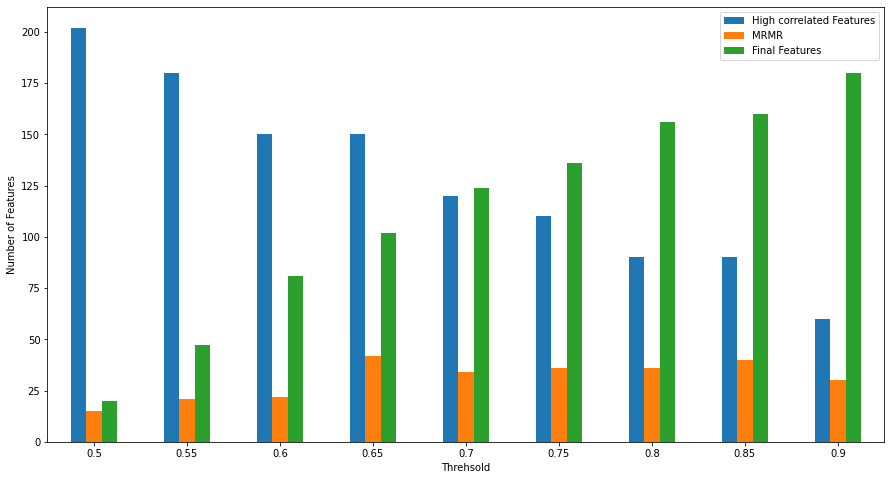

In [287]:
# plt.figure()
ax = features_compare.plot.bar(rot=0,figsize=(15,8))
plt.legend(loc='upper right')
plt.xlabel("Threhsold")
plt.ylabel("Number of Features")
plt.savefig("./pic/Correlation Pic/Electricity/feature_reduction_Electricity.png")

## Recursive Feature Elimination

## LightBGM,Random Forest,XGBoost

In [292]:
def lgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    gbm = lgb.LGBMRegressor()
    gbm.fit(x_train, y_train,eval_set = [(x_test,y_test)],early_stopping_rounds = 10)

    features = X_train.columns
    importances = gbm.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = features
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with LightBGM model')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

In [661]:
def rfr_pipeline(X_train,Y_train,top_feature_num,i):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))

    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))

    rfr = RandomForestRegressor()
    rfr.fit(x_train,y_train.reshape(-1,))
    
    feature_names = X_train.columns
    importances = rfr.feature_importances_
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
    
#     fig = sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
#     plt.title('Top 10 features with Random Forest model')
#     plt.savefig('./pic/RMSE/Electricity/feature_round_'+str(i)+'.png')
#     plt.show()
    
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    
    return top_features

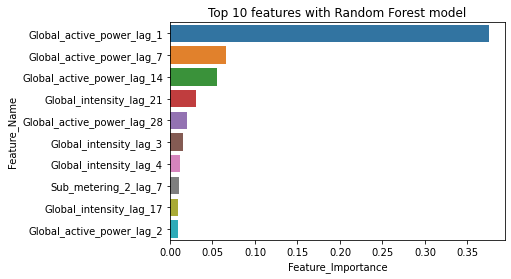

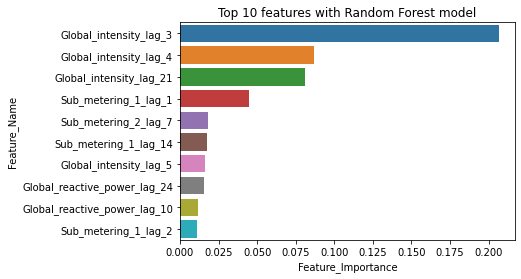

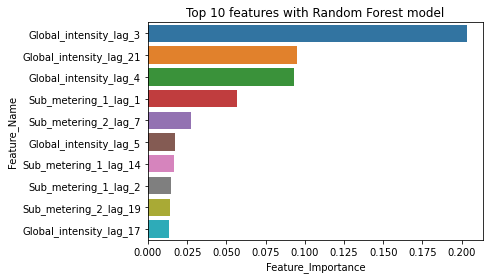

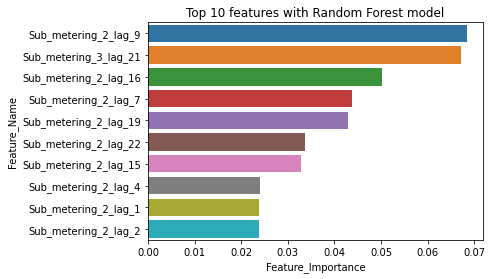

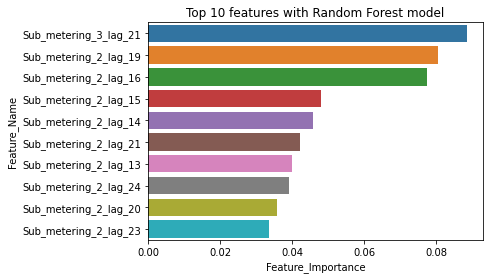

{14: ['Sub_metering_1_lag_1',
  'Global_active_power_lag_7',
  'Global_intensity_lag_3',
  'Global_intensity_lag_4',
  'Global_intensity_lag_5',
  'Sub_metering_2_lag_2',
  'Sub_metering_2_lag_7',
  'Sub_metering_2_lag_18',
  'Sub_metering_2_lag_21',
  'Sub_metering_1_lag_14',
  'Sub_metering_2_lag_11',
  'Sub_metering_1_lag_7',
  'Global_intensity_lag_8',
  'Sub_metering_2_lag_14',
  'Global_active_power_lag_13',
  'Sub_metering_2_lag_16',
  'Global_intensity_lag_21',
  'Sub_metering_2_lag_15',
  'Global_active_power_lag_14',
  'Sub_metering_2_lag_22',
  'Global_active_power_lag_2',
  'Sub_metering_1_lag_2',
  'Global_reactive_power_lag_24',
  'Sub_metering_2_lag_17',
  'Global_reactive_power_lag_10',
  'Sub_metering_2_lag_13',
  'Sub_metering_2_lag_9',
  'Sub_metering_2_lag_10',
  'Sub_metering_2_lag_24',
  'Global_intensity_lag_11',
  'Global_reactive_power_lag_11',
  'Sub_metering_2_lag_8',
  'Sub_metering_2_lag_1',
  'Sub_metering_2_lag_19',
  'Sub_metering_3_lag_21',
  'Sub_meter

In [660]:
rfr_recursive(feature_collections[0.75],14,14,X_train_lag,Y_train_lag)

In [668]:
optimal_subset

{14: ['Global_reactive_power_lag_1',
  'Sub_metering_1_lag_1',
  'Global_active_power_lag_7',
  'Global_intensity_lag_3',
  'Global_intensity_lag_4',
  'Global_intensity_lag_5',
  'Sub_metering_2_lag_2',
  'Sub_metering_2_lag_7',
  'Sub_metering_2_lag_18',
  'Sub_metering_2_lag_21',
  'Sub_metering_1_lag_14',
  'Sub_metering_1_lag_7',
  'Global_reactive_power_lag_9',
  'Sub_metering_2_lag_14',
  'Sub_metering_3_lag_29',
  'Sub_metering_2_lag_16',
  'Global_intensity_lag_21',
  'Sub_metering_2_lag_15',
  'Global_active_power_lag_14',
  'Sub_metering_2_lag_22',
  'Global_active_power_lag_2',
  'Sub_metering_1_lag_2',
  'Global_reactive_power_lag_24',
  'Sub_metering_2_lag_17',
  'Global_reactive_power_lag_10',
  'Sub_metering_2_lag_13',
  'Global_reactive_power_lag_16',
  'Sub_metering_2_lag_9',
  'Sub_metering_2_lag_10',
  'Sub_metering_2_lag_24',
  'Sub_metering_2_lag_8',
  'Global_reactive_power_lag_11',
  'Sub_metering_2_lag_1',
  'Sub_metering_2_lag_19',
  'Sub_metering_3_lag_21',
 

In [294]:
def xgb_pipeline(X_train,Y_train,X_test,Y_test,top_feature_num):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))
    
    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test = minmax_y_test.fit_transform(Y_test.values.reshape(-1,1))
    
    xgb = XGBRegressor()
    xgb.fit(x_train,y_train.reshape(-1,),eval_set=[(x_test, y_test)],early_stopping_rounds=10)

    feature_names = X_train.columns
    importances = xgb.feature_importances_
#     plot_importance(xgb,max_num_features=10,importance_type='gain',show_values=False)
    
    
    importances_df = pd.DataFrame()
    importances_df['Feature_Name'] = feature_names
    importances_df['Feature_Importance'] = importances
    importances_df.sort_values('Feature_Importance', ascending=False,inplace=True)
#     sns.barplot(x=importances_df['Feature_Importance'][:10], y=importances_df['Feature_Name'][:10])
# #     plt.barh(importances_df['Feature_Name'][:10], importances_df['Feature_Importance'][:10]) 
#     plt.title('Top 10 features with XGB model')
#     plt.show()
    top_features = importances_df['Feature_Name'][:top_feature_num].values
    return top_features

### Recursive function means selecting the features recursively

repeat 5 times

In [659]:
def rfr_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,):
    
    max_end = int(0.2*len(cols))
    
    range_end = 0
    
    if len(cols)<25:
        
        # If the number of featurs is less than 5,then we get the features directly
        if len(cols)<=5:
            return cols
        
        # Judge whether the starting point is less than 1/5 of all features
        # If starting_Point<1/5 of the features, we can recursively select features
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                rfr_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))
                rfr_features = list(set(np.array(rfr_features).flatten()))
                features_dict[j] = rfr_features
                print(j,end='\r',flush=True)
                
            return features_dict
    # If the required ending point is greater than 1/5 of the features,we end the rescursive selection at
    # the 1/5 of the features
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
        features_dict = {}
        for j in range(feature_num_1,range_end+1):
            rfr_features = []
            for i in range(5):
                col_len = int(len(cols)*i*0.2)
                now_cols = cols[col_len:]
                rfr_features.append( rfr_pipeline(X_train[now_cols],Y_train,j,i))

            rfr_features = list(set(np.array(rfr_features).flatten()))
            features_dict[j] = rfr_features
        
            print(j,end='\r',flush=True)
        return features_dict

In [296]:
def lgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0

    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                lgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    lgb_features.append( lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))

                lgb_features = list(set(np.array(lgb_features).flatten()))
                features_dict[j] = lgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    features_dict = {}
    
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
    
    for j in range(feature_num_1,range_end+1):
        lgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            lgb_features.append(lgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        lgb_features = list(set(np.array(lgb_features).flatten()))
        features_dict[j] = lgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [297]:
def xgb_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                xgb_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                xgb_features = list(set(np.array(xgb_features).flatten()))
                features_dict[j] = xgb_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        xgb_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            xgb_features.append( xgb_pipeline(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        xgb_features = list(set(np.array(xgb_features).flatten()))
        features_dict[j] = xgb_features
        print(j,end='\r',flush=True)
    return features_dict

In [298]:
real_lgb = {}
for k,v in feature_collections.items():
    real_lgb[k] = lgb_recursive(v,1,15,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

[1]	valid_0's l2: 0.0596572
[2]	valid_0's l2: 0.0575901
[3]	valid_0's l2: 0.0559402
[4]	valid_0's l2: 0.0544368
[5]	valid_0's l2: 0.0532334
[6]	valid_0's l2: 0.0520154
[7]	valid_0's l2: 0.0515907
[8]	valid_0's l2: 0.0508493
[9]	valid_0's l2: 0.0502731
[10]	valid_0's l2: 0.0502251
[11]	valid_0's l2: 0.0501323
[12]	valid_0's l2: 0.0496316
[13]	valid_0's l2: 0.0495991
[14]	valid_0's l2: 0.0494503
[15]	valid_0's l2: 0.0490699
[16]	valid_0's l2: 0.0488079
[17]	valid_0's l2: 0.0488687
[18]	valid_0's l2: 0.0487664
[19]	valid_0's l2: 0.0487046
[20]	valid_0's l2: 0.0489477
[21]	valid_0's l2: 0.04866
[22]	valid_0's l2: 0.0485494
[23]	valid_0's l2: 0.048092
[24]	valid_0's l2: 0.0481185
[25]	valid_0's l2: 0.0480439
[26]	valid_0's l2: 0.0482937
[27]	valid_0's l2: 0.0481905
[28]	valid_0's l2: 0.0481555
[29]	valid_0's l2: 0.0479291
[30]	valid_0's l2: 0.0478376
[31]	valid_0's l2: 0.047856
[32]	valid_0's l2: 0.0477283
[33]	valid_0's l2: 0.047724
[34]	valid_0's l2: 0.0479296
[35]	valid_0's l2: 0.0479191

[1]	valid_0's l2: 0.0596572
[2]	valid_0's l2: 0.0575901
[3]	valid_0's l2: 0.0559402
[4]	valid_0's l2: 0.0544368
[5]	valid_0's l2: 0.0532334
[6]	valid_0's l2: 0.0520154
[7]	valid_0's l2: 0.0515907
[8]	valid_0's l2: 0.0508493
[9]	valid_0's l2: 0.0502731
[10]	valid_0's l2: 0.0502251
[11]	valid_0's l2: 0.0501323
[12]	valid_0's l2: 0.0496316
[13]	valid_0's l2: 0.0495991
[14]	valid_0's l2: 0.0494503
[15]	valid_0's l2: 0.0490699
[16]	valid_0's l2: 0.0488079
[17]	valid_0's l2: 0.0488687
[18]	valid_0's l2: 0.0487664
[19]	valid_0's l2: 0.0487046
[20]	valid_0's l2: 0.0489477
[21]	valid_0's l2: 0.04866
[22]	valid_0's l2: 0.0485494
[23]	valid_0's l2: 0.048092
[24]	valid_0's l2: 0.0481185
[25]	valid_0's l2: 0.0480439
[26]	valid_0's l2: 0.0482937
[27]	valid_0's l2: 0.0481905
[28]	valid_0's l2: 0.0481555
[29]	valid_0's l2: 0.0479291
[30]	valid_0's l2: 0.0478376
[31]	valid_0's l2: 0.047856
[32]	valid_0's l2: 0.0477283
[33]	valid_0's l2: 0.047724
[34]	valid_0's l2: 0.0479296
[35]	valid_0's l2: 0.0479191

[1]	valid_0's l2: 0.0591396
[2]	valid_0's l2: 0.0566402
[3]	valid_0's l2: 0.0546677
[4]	valid_0's l2: 0.0523298
[5]	valid_0's l2: 0.0509813
[6]	valid_0's l2: 0.0492137
[7]	valid_0's l2: 0.0487352
[8]	valid_0's l2: 0.0477764
[9]	valid_0's l2: 0.0470488
[10]	valid_0's l2: 0.0469336
[11]	valid_0's l2: 0.0466611
[12]	valid_0's l2: 0.0461704
[13]	valid_0's l2: 0.0457836
[14]	valid_0's l2: 0.0455799
[15]	valid_0's l2: 0.045423
[16]	valid_0's l2: 0.0449064
[17]	valid_0's l2: 0.0450525
[18]	valid_0's l2: 0.0449838
[19]	valid_0's l2: 0.0451081
[20]	valid_0's l2: 0.0449595
[21]	valid_0's l2: 0.0446609
[22]	valid_0's l2: 0.0446503
[23]	valid_0's l2: 0.0445913
[24]	valid_0's l2: 0.0444153
[25]	valid_0's l2: 0.0441766
[26]	valid_0's l2: 0.0440662
[27]	valid_0's l2: 0.0440205
[28]	valid_0's l2: 0.0438751
[29]	valid_0's l2: 0.0439086
[30]	valid_0's l2: 0.0438512
[31]	valid_0's l2: 0.0437445
[32]	valid_0's l2: 0.0437573
[33]	valid_0's l2: 0.0438055
[34]	valid_0's l2: 0.0437502
[35]	valid_0's l2: 0.043

[19]	valid_0's l2: 0.0451081
[20]	valid_0's l2: 0.0449595
[21]	valid_0's l2: 0.0446609
[22]	valid_0's l2: 0.0446503
[23]	valid_0's l2: 0.0445913
[24]	valid_0's l2: 0.0444153
[25]	valid_0's l2: 0.0441766
[26]	valid_0's l2: 0.0440662
[27]	valid_0's l2: 0.0440205
[28]	valid_0's l2: 0.0438751
[29]	valid_0's l2: 0.0439086
[30]	valid_0's l2: 0.0438512
[31]	valid_0's l2: 0.0437445
[32]	valid_0's l2: 0.0437573
[33]	valid_0's l2: 0.0438055
[34]	valid_0's l2: 0.0437502
[35]	valid_0's l2: 0.0436002
[36]	valid_0's l2: 0.0435581
[37]	valid_0's l2: 0.0435291
[38]	valid_0's l2: 0.0435134
[39]	valid_0's l2: 0.0434816
[40]	valid_0's l2: 0.0433352
[41]	valid_0's l2: 0.0432616
[42]	valid_0's l2: 0.0432018
[43]	valid_0's l2: 0.043081
[44]	valid_0's l2: 0.0431625
[45]	valid_0's l2: 0.0430881
[46]	valid_0's l2: 0.0430305
[47]	valid_0's l2: 0.0429278
[48]	valid_0's l2: 0.0430231
[49]	valid_0's l2: 0.043057
[50]	valid_0's l2: 0.0431162
[51]	valid_0's l2: 0.0430758
[52]	valid_0's l2: 0.0430912
[53]	valid_0's l

[2]	valid_0's l2: 0.0589687
[3]	valid_0's l2: 0.0580838
[4]	valid_0's l2: 0.0573098
[5]	valid_0's l2: 0.0562728
[6]	valid_0's l2: 0.0554977
[7]	valid_0's l2: 0.0544491
[8]	valid_0's l2: 0.0533228
[9]	valid_0's l2: 0.0519372
[10]	valid_0's l2: 0.051191
[11]	valid_0's l2: 0.0503838
[12]	valid_0's l2: 0.0496739
[13]	valid_0's l2: 0.0491271
[14]	valid_0's l2: 0.0484607
[15]	valid_0's l2: 0.0478194
[16]	valid_0's l2: 0.0473546
[17]	valid_0's l2: 0.0471024
[18]	valid_0's l2: 0.0470643
[19]	valid_0's l2: 0.0471484
[20]	valid_0's l2: 0.0470394
[21]	valid_0's l2: 0.0468012
[22]	valid_0's l2: 0.0467102
[23]	valid_0's l2: 0.0466213
[24]	valid_0's l2: 0.0465545
[25]	valid_0's l2: 0.0465961
[26]	valid_0's l2: 0.0464135
[27]	valid_0's l2: 0.0462303
[28]	valid_0's l2: 0.0460499
[29]	valid_0's l2: 0.0458399
[30]	valid_0's l2: 0.0459437
[31]	valid_0's l2: 0.04594
[32]	valid_0's l2: 0.0457698
[33]	valid_0's l2: 0.0456522
[34]	valid_0's l2: 0.0456617
[35]	valid_0's l2: 0.0455511
[36]	valid_0's l2: 0.0454

[28]	valid_0's l2: 0.0460499
[29]	valid_0's l2: 0.0458399
[30]	valid_0's l2: 0.0459437
[31]	valid_0's l2: 0.04594
[32]	valid_0's l2: 0.0457698
[33]	valid_0's l2: 0.0456522
[34]	valid_0's l2: 0.0456617
[35]	valid_0's l2: 0.0455511
[36]	valid_0's l2: 0.045475
[37]	valid_0's l2: 0.0455239
[38]	valid_0's l2: 0.0454249
[39]	valid_0's l2: 0.0454377
[40]	valid_0's l2: 0.0453516
[41]	valid_0's l2: 0.0454619
[42]	valid_0's l2: 0.0455442
[43]	valid_0's l2: 0.0454875
[44]	valid_0's l2: 0.0454772
[45]	valid_0's l2: 0.0453625
[46]	valid_0's l2: 0.0453984
[47]	valid_0's l2: 0.0454209
[48]	valid_0's l2: 0.0454735
[49]	valid_0's l2: 0.045582
[50]	valid_0's l2: 0.0454994
[1]	valid_0's l2: 0.0601548
[2]	valid_0's l2: 0.0586085
[3]	valid_0's l2: 0.0574678
[4]	valid_0's l2: 0.0557635
[5]	valid_0's l2: 0.0548039
[6]	valid_0's l2: 0.05398
[7]	valid_0's l2: 0.0535499
[8]	valid_0's l2: 0.0524447
[9]	valid_0's l2: 0.0518221
[10]	valid_0's l2: 0.0514309
[11]	valid_0's l2: 0.0502097
[12]	valid_0's l2: 0.0496404


[20]	valid_0's l2: 0.0479848
[21]	valid_0's l2: 0.0479378
[22]	valid_0's l2: 0.0477762
[23]	valid_0's l2: 0.0476799
[24]	valid_0's l2: 0.0478821
[25]	valid_0's l2: 0.0479218
[26]	valid_0's l2: 0.0479498
[27]	valid_0's l2: 0.0475762
[28]	valid_0's l2: 0.0477227
[29]	valid_0's l2: 0.0474847
[30]	valid_0's l2: 0.0474332
[31]	valid_0's l2: 0.0473543
[32]	valid_0's l2: 0.0473135
[33]	valid_0's l2: 0.0473642
[34]	valid_0's l2: 0.0472789
[35]	valid_0's l2: 0.0473574
[36]	valid_0's l2: 0.0474943
[37]	valid_0's l2: 0.0472697
[38]	valid_0's l2: 0.0471157
[39]	valid_0's l2: 0.0472704
[40]	valid_0's l2: 0.0472374
[41]	valid_0's l2: 0.0472781
[42]	valid_0's l2: 0.047212
[43]	valid_0's l2: 0.047221
[44]	valid_0's l2: 0.0472225
[45]	valid_0's l2: 0.0470885
[46]	valid_0's l2: 0.0470375
[47]	valid_0's l2: 0.0469879
[48]	valid_0's l2: 0.0469872
[49]	valid_0's l2: 0.047046
[50]	valid_0's l2: 0.0470023
[51]	valid_0's l2: 0.04707
[52]	valid_0's l2: 0.0472045
[53]	valid_0's l2: 0.047146
[54]	valid_0's l2: 0

[88]	valid_0's l2: 0.0469319
[89]	valid_0's l2: 0.0470074
[90]	valid_0's l2: 0.0469666
[1]	valid_0's l2: 0.0601573
[2]	valid_0's l2: 0.058768
[3]	valid_0's l2: 0.0574056
[4]	valid_0's l2: 0.0555514
[5]	valid_0's l2: 0.0545196
[6]	valid_0's l2: 0.0535992
[7]	valid_0's l2: 0.0526246
[8]	valid_0's l2: 0.0519524
[9]	valid_0's l2: 0.0513303
[10]	valid_0's l2: 0.0508629
[11]	valid_0's l2: 0.0505161
[12]	valid_0's l2: 0.0501852
[13]	valid_0's l2: 0.0499986
[14]	valid_0's l2: 0.0497757
[15]	valid_0's l2: 0.0496521
[16]	valid_0's l2: 0.0493839
[17]	valid_0's l2: 0.0491452
[18]	valid_0's l2: 0.04905
[19]	valid_0's l2: 0.0489633
[20]	valid_0's l2: 0.0486594
[21]	valid_0's l2: 0.0483796
[22]	valid_0's l2: 0.0482456
[23]	valid_0's l2: 0.0480239
[24]	valid_0's l2: 0.0480236
[25]	valid_0's l2: 0.0478202
[26]	valid_0's l2: 0.0476003
[27]	valid_0's l2: 0.0475098
[28]	valid_0's l2: 0.0479155
[29]	valid_0's l2: 0.0479427
[30]	valid_0's l2: 0.047911
[31]	valid_0's l2: 0.0480142
[32]	valid_0's l2: 0.048284

[12]	valid_0's l2: 0.0501852
[13]	valid_0's l2: 0.0499986
[14]	valid_0's l2: 0.0497757
[15]	valid_0's l2: 0.0496521
[16]	valid_0's l2: 0.0493839
[17]	valid_0's l2: 0.0491452
[18]	valid_0's l2: 0.04905
[19]	valid_0's l2: 0.0489633
[20]	valid_0's l2: 0.0486594
[21]	valid_0's l2: 0.0483796
[22]	valid_0's l2: 0.0482456
[23]	valid_0's l2: 0.0480239
[24]	valid_0's l2: 0.0480236
[25]	valid_0's l2: 0.0478202
[26]	valid_0's l2: 0.0476003
[27]	valid_0's l2: 0.0475098
[28]	valid_0's l2: 0.0479155
[29]	valid_0's l2: 0.0479427
[30]	valid_0's l2: 0.047911
[31]	valid_0's l2: 0.0480142
[32]	valid_0's l2: 0.0482848
[33]	valid_0's l2: 0.0484132
[34]	valid_0's l2: 0.0483345
[35]	valid_0's l2: 0.0484857
[36]	valid_0's l2: 0.0484302
[37]	valid_0's l2: 0.048421
[1]	valid_0's l2: 0.0594529
[2]	valid_0's l2: 0.0575856
[3]	valid_0's l2: 0.056648
[4]	valid_0's l2: 0.0551801
[5]	valid_0's l2: 0.0540559
[6]	valid_0's l2: 0.0530353
[7]	valid_0's l2: 0.0523008
[8]	valid_0's l2: 0.0519065
[9]	valid_0's l2: 0.0511627

[1]	valid_0's l2: 0.0591396
[2]	valid_0's l2: 0.0566402
[3]	valid_0's l2: 0.0546677
[4]	valid_0's l2: 0.0523298
[5]	valid_0's l2: 0.0509813
[6]	valid_0's l2: 0.0492137
[7]	valid_0's l2: 0.0487352
[8]	valid_0's l2: 0.0477764
[9]	valid_0's l2: 0.0470488
[10]	valid_0's l2: 0.0469336
[11]	valid_0's l2: 0.0466611
[12]	valid_0's l2: 0.0461704
[13]	valid_0's l2: 0.0457836
[14]	valid_0's l2: 0.0455799
[15]	valid_0's l2: 0.045423
[16]	valid_0's l2: 0.0449064
[17]	valid_0's l2: 0.0450525
[18]	valid_0's l2: 0.0449838
[19]	valid_0's l2: 0.0451081
[20]	valid_0's l2: 0.0449595
[21]	valid_0's l2: 0.0446609
[22]	valid_0's l2: 0.0446503
[23]	valid_0's l2: 0.0445913
[24]	valid_0's l2: 0.0444153
[25]	valid_0's l2: 0.0441766
[26]	valid_0's l2: 0.0440662
[27]	valid_0's l2: 0.0440205
[28]	valid_0's l2: 0.0438751
[29]	valid_0's l2: 0.0439086
[30]	valid_0's l2: 0.0438512
[31]	valid_0's l2: 0.0437445
[32]	valid_0's l2: 0.0437573
[33]	valid_0's l2: 0.0438055
[34]	valid_0's l2: 0.0437502
[35]	valid_0's l2: 0.043

[21]	valid_0's l2: 0.0446609
[22]	valid_0's l2: 0.0446503
[23]	valid_0's l2: 0.0445913
[24]	valid_0's l2: 0.0444153
[25]	valid_0's l2: 0.0441766
[26]	valid_0's l2: 0.0440662
[27]	valid_0's l2: 0.0440205
[28]	valid_0's l2: 0.0438751
[29]	valid_0's l2: 0.0439086
[30]	valid_0's l2: 0.0438512
[31]	valid_0's l2: 0.0437445
[32]	valid_0's l2: 0.0437573
[33]	valid_0's l2: 0.0438055
[34]	valid_0's l2: 0.0437502
[35]	valid_0's l2: 0.0436002
[36]	valid_0's l2: 0.0435581
[37]	valid_0's l2: 0.0435291
[38]	valid_0's l2: 0.0435134
[39]	valid_0's l2: 0.0434816
[40]	valid_0's l2: 0.0433352
[41]	valid_0's l2: 0.0432616
[42]	valid_0's l2: 0.0432018
[43]	valid_0's l2: 0.043081
[44]	valid_0's l2: 0.0431625
[45]	valid_0's l2: 0.0430881
[46]	valid_0's l2: 0.0430305
[47]	valid_0's l2: 0.0429278
[48]	valid_0's l2: 0.0430231
[49]	valid_0's l2: 0.043057
[50]	valid_0's l2: 0.0431162
[51]	valid_0's l2: 0.0430758
[52]	valid_0's l2: 0.0430912
[53]	valid_0's l2: 0.0430065
[54]	valid_0's l2: 0.0429497
[55]	valid_0's l

[34]	valid_0's l2: 0.0437502
[35]	valid_0's l2: 0.0436002
[36]	valid_0's l2: 0.0435581
[37]	valid_0's l2: 0.0435291
[38]	valid_0's l2: 0.0435134
[39]	valid_0's l2: 0.0434816
[40]	valid_0's l2: 0.0433352
[41]	valid_0's l2: 0.0432616
[42]	valid_0's l2: 0.0432018
[43]	valid_0's l2: 0.043081
[44]	valid_0's l2: 0.0431625
[45]	valid_0's l2: 0.0430881
[46]	valid_0's l2: 0.0430305
[47]	valid_0's l2: 0.0429278
[48]	valid_0's l2: 0.0430231
[49]	valid_0's l2: 0.043057
[50]	valid_0's l2: 0.0431162
[51]	valid_0's l2: 0.0430758
[52]	valid_0's l2: 0.0430912
[53]	valid_0's l2: 0.0430065
[54]	valid_0's l2: 0.0429497
[55]	valid_0's l2: 0.0429933
[56]	valid_0's l2: 0.0430793
[57]	valid_0's l2: 0.0429401
[1]	valid_0's l2: 0.0605108
[2]	valid_0's l2: 0.0589687
[3]	valid_0's l2: 0.0580838
[4]	valid_0's l2: 0.0573098
[5]	valid_0's l2: 0.0562728
[6]	valid_0's l2: 0.0554977
[7]	valid_0's l2: 0.0544491
[8]	valid_0's l2: 0.0533228
[9]	valid_0's l2: 0.0519372
[10]	valid_0's l2: 0.051191
[11]	valid_0's l2: 0.05038

[2]	valid_0's l2: 0.0589687
[3]	valid_0's l2: 0.0580838
[4]	valid_0's l2: 0.0573098
[5]	valid_0's l2: 0.0562728
[6]	valid_0's l2: 0.0554977
[7]	valid_0's l2: 0.0544491
[8]	valid_0's l2: 0.0533228
[9]	valid_0's l2: 0.0519372
[10]	valid_0's l2: 0.051191
[11]	valid_0's l2: 0.0503838
[12]	valid_0's l2: 0.0496739
[13]	valid_0's l2: 0.0491271
[14]	valid_0's l2: 0.0484607
[15]	valid_0's l2: 0.0478194
[16]	valid_0's l2: 0.0473546
[17]	valid_0's l2: 0.0471024
[18]	valid_0's l2: 0.0470643
[19]	valid_0's l2: 0.0471484
[20]	valid_0's l2: 0.0470394
[21]	valid_0's l2: 0.0468012
[22]	valid_0's l2: 0.0467102
[23]	valid_0's l2: 0.0466213
[24]	valid_0's l2: 0.0465545
[25]	valid_0's l2: 0.0465961
[26]	valid_0's l2: 0.0464135
[27]	valid_0's l2: 0.0462303
[28]	valid_0's l2: 0.0460499
[29]	valid_0's l2: 0.0458399
[30]	valid_0's l2: 0.0459437
[31]	valid_0's l2: 0.04594
[32]	valid_0's l2: 0.0457698
[33]	valid_0's l2: 0.0456522
[34]	valid_0's l2: 0.0456617
[35]	valid_0's l2: 0.0455511
[36]	valid_0's l2: 0.0454

[1]	valid_0's l2: 0.0601548
[2]	valid_0's l2: 0.0586085
[3]	valid_0's l2: 0.0574678
[4]	valid_0's l2: 0.0557635
[5]	valid_0's l2: 0.0548039
[6]	valid_0's l2: 0.05398
[7]	valid_0's l2: 0.0535499
[8]	valid_0's l2: 0.0524447
[9]	valid_0's l2: 0.0518221
[10]	valid_0's l2: 0.0514309
[11]	valid_0's l2: 0.0502097
[12]	valid_0's l2: 0.0496404
[13]	valid_0's l2: 0.0494328
[14]	valid_0's l2: 0.0490441
[15]	valid_0's l2: 0.0488692
[16]	valid_0's l2: 0.0485809
[17]	valid_0's l2: 0.0483904
[18]	valid_0's l2: 0.0481827
[19]	valid_0's l2: 0.0477438
[20]	valid_0's l2: 0.0479848
[21]	valid_0's l2: 0.0479378
[22]	valid_0's l2: 0.0477762
[23]	valid_0's l2: 0.0476799
[24]	valid_0's l2: 0.0478821
[25]	valid_0's l2: 0.0479218
[26]	valid_0's l2: 0.0479498
[27]	valid_0's l2: 0.0475762
[28]	valid_0's l2: 0.0477227
[29]	valid_0's l2: 0.0474847
[30]	valid_0's l2: 0.0474332
[31]	valid_0's l2: 0.0473543
[32]	valid_0's l2: 0.0473135
[33]	valid_0's l2: 0.0473642
[34]	valid_0's l2: 0.0472789
[35]	valid_0's l2: 0.0473

[30]	valid_0's l2: 0.0474332
[31]	valid_0's l2: 0.0473543
[32]	valid_0's l2: 0.0473135
[33]	valid_0's l2: 0.0473642
[34]	valid_0's l2: 0.0472789
[35]	valid_0's l2: 0.0473574
[36]	valid_0's l2: 0.0474943
[37]	valid_0's l2: 0.0472697
[38]	valid_0's l2: 0.0471157
[39]	valid_0's l2: 0.0472704
[40]	valid_0's l2: 0.0472374
[41]	valid_0's l2: 0.0472781
[42]	valid_0's l2: 0.047212
[43]	valid_0's l2: 0.047221
[44]	valid_0's l2: 0.0472225
[45]	valid_0's l2: 0.0470885
[46]	valid_0's l2: 0.0470375
[47]	valid_0's l2: 0.0469879
[48]	valid_0's l2: 0.0469872
[49]	valid_0's l2: 0.047046
[50]	valid_0's l2: 0.0470023
[51]	valid_0's l2: 0.04707
[52]	valid_0's l2: 0.0472045
[53]	valid_0's l2: 0.047146
[54]	valid_0's l2: 0.047014
[55]	valid_0's l2: 0.047047
[56]	valid_0's l2: 0.0470249
[57]	valid_0's l2: 0.0470227
[58]	valid_0's l2: 0.0469737
[59]	valid_0's l2: 0.0469687
[60]	valid_0's l2: 0.0469117
[61]	valid_0's l2: 0.0469824
[62]	valid_0's l2: 0.0469857
[63]	valid_0's l2: 0.0469188
[64]	valid_0's l2: 0.0

[2]	valid_0's l2: 0.058768
[3]	valid_0's l2: 0.0574056
[4]	valid_0's l2: 0.0555514
[5]	valid_0's l2: 0.0545196
[6]	valid_0's l2: 0.0535992
[7]	valid_0's l2: 0.0526246
[8]	valid_0's l2: 0.0519524
[9]	valid_0's l2: 0.0513303
[10]	valid_0's l2: 0.0508629
[11]	valid_0's l2: 0.0505161
[12]	valid_0's l2: 0.0501852
[13]	valid_0's l2: 0.0499986
[14]	valid_0's l2: 0.0497757
[15]	valid_0's l2: 0.0496521
[16]	valid_0's l2: 0.0493839
[17]	valid_0's l2: 0.0491452
[18]	valid_0's l2: 0.04905
[19]	valid_0's l2: 0.0489633
[20]	valid_0's l2: 0.0486594
[21]	valid_0's l2: 0.0483796
[22]	valid_0's l2: 0.0482456
[23]	valid_0's l2: 0.0480239
[24]	valid_0's l2: 0.0480236
[25]	valid_0's l2: 0.0478202
[26]	valid_0's l2: 0.0476003
[27]	valid_0's l2: 0.0475098
[28]	valid_0's l2: 0.0479155
[29]	valid_0's l2: 0.0479427
[30]	valid_0's l2: 0.047911
[31]	valid_0's l2: 0.0480142
[32]	valid_0's l2: 0.0482848
[33]	valid_0's l2: 0.0484132
[34]	valid_0's l2: 0.0483345
[35]	valid_0's l2: 0.0484857
[36]	valid_0's l2: 0.04843

[43]	valid_0's l2: 0.0438214
[44]	valid_0's l2: 0.0438477
[45]	valid_0's l2: 0.0437873
[46]	valid_0's l2: 0.0437382
[47]	valid_0's l2: 0.043734
[48]	valid_0's l2: 0.0438647
[49]	valid_0's l2: 0.0439157
[1]	valid_0's l2: 0.0600652
[2]	valid_0's l2: 0.0580564
[3]	valid_0's l2: 0.0563427
[4]	valid_0's l2: 0.0551113
[5]	valid_0's l2: 0.0539928
[6]	valid_0's l2: 0.0531965
[7]	valid_0's l2: 0.0521149
[8]	valid_0's l2: 0.0514574
[9]	valid_0's l2: 0.0509304
[10]	valid_0's l2: 0.0501198
[11]	valid_0's l2: 0.0498965
[12]	valid_0's l2: 0.0494076
[13]	valid_0's l2: 0.0486877
[14]	valid_0's l2: 0.0480539
[15]	valid_0's l2: 0.0478184
[16]	valid_0's l2: 0.0476543
[17]	valid_0's l2: 0.0473204
[18]	valid_0's l2: 0.0469108
[19]	valid_0's l2: 0.0464809
[20]	valid_0's l2: 0.0462756
[21]	valid_0's l2: 0.04608
[22]	valid_0's l2: 0.0460359
[23]	valid_0's l2: 0.0456868
[24]	valid_0's l2: 0.0456987
[25]	valid_0's l2: 0.0456839
[26]	valid_0's l2: 0.0456428
[27]	valid_0's l2: 0.0456569
[28]	valid_0's l2: 0.04550

[39]	valid_0's l2: 0.0484704
[40]	valid_0's l2: 0.0484551
[41]	valid_0's l2: 0.048513
[1]	valid_0's l2: 0.0614672
[2]	valid_0's l2: 0.0590455
[3]	valid_0's l2: 0.0586382
[4]	valid_0's l2: 0.0582357
[5]	valid_0's l2: 0.0570146
[6]	valid_0's l2: 0.0569237
[7]	valid_0's l2: 0.0557121
[8]	valid_0's l2: 0.0549715
[9]	valid_0's l2: 0.055022
[10]	valid_0's l2: 0.0554958
[11]	valid_0's l2: 0.0555301
[12]	valid_0's l2: 0.0560031
[13]	valid_0's l2: 0.0565978
[14]	valid_0's l2: 0.0561583
[15]	valid_0's l2: 0.0558306
[16]	valid_0's l2: 0.0557417
[17]	valid_0's l2: 0.0558103
[18]	valid_0's l2: 0.0555066
[1]	valid_0's l2: 0.0589276
[2]	valid_0's l2: 0.0560525
[3]	valid_0's l2: 0.0541001
[4]	valid_0's l2: 0.0522242
[5]	valid_0's l2: 0.050312
[6]	valid_0's l2: 0.0491381
[7]	valid_0's l2: 0.0483524
[8]	valid_0's l2: 0.0478065
[9]	valid_0's l2: 0.0470447
[10]	valid_0's l2: 0.04621
[11]	valid_0's l2: 0.0460569
[12]	valid_0's l2: 0.0457462
[13]	valid_0's l2: 0.0455927
[14]	valid_0's l2: 0.045372
[15]	vali

[1]	valid_0's l2: 0.0593418
[2]	valid_0's l2: 0.0573669
[3]	valid_0's l2: 0.0554427
[4]	valid_0's l2: 0.0536428
[5]	valid_0's l2: 0.0523618
[6]	valid_0's l2: 0.0506976
[7]	valid_0's l2: 0.0499138
[8]	valid_0's l2: 0.0487953
[9]	valid_0's l2: 0.0484135
[10]	valid_0's l2: 0.0477975
[11]	valid_0's l2: 0.0472504
[12]	valid_0's l2: 0.0468871
[13]	valid_0's l2: 0.0465731
[14]	valid_0's l2: 0.0462858
[15]	valid_0's l2: 0.0461819
[16]	valid_0's l2: 0.0460621
[17]	valid_0's l2: 0.0457112
[18]	valid_0's l2: 0.045888
[19]	valid_0's l2: 0.0456324
[20]	valid_0's l2: 0.0453427
[21]	valid_0's l2: 0.0452566
[22]	valid_0's l2: 0.0453842
[23]	valid_0's l2: 0.0452662
[24]	valid_0's l2: 0.0453442
[25]	valid_0's l2: 0.045246
[26]	valid_0's l2: 0.0449756
[27]	valid_0's l2: 0.044959
[28]	valid_0's l2: 0.0450714
[29]	valid_0's l2: 0.0449567
[30]	valid_0's l2: 0.0449135
[31]	valid_0's l2: 0.0449492
[32]	valid_0's l2: 0.0450866
[33]	valid_0's l2: 0.045071
[34]	valid_0's l2: 0.0451284
[35]	valid_0's l2: 0.045090

[1]	valid_0's l2: 0.0589276
[2]	valid_0's l2: 0.0560525
[3]	valid_0's l2: 0.0541001
[4]	valid_0's l2: 0.0522242
[5]	valid_0's l2: 0.050312
[6]	valid_0's l2: 0.0491381
[7]	valid_0's l2: 0.0483524
[8]	valid_0's l2: 0.0478065
[9]	valid_0's l2: 0.0470447
[10]	valid_0's l2: 0.04621
[11]	valid_0's l2: 0.0460569
[12]	valid_0's l2: 0.0457462
[13]	valid_0's l2: 0.0455927
[14]	valid_0's l2: 0.045372
[15]	valid_0's l2: 0.0453594
[16]	valid_0's l2: 0.04527
[17]	valid_0's l2: 0.0453929
[18]	valid_0's l2: 0.045235
[19]	valid_0's l2: 0.044935
[20]	valid_0's l2: 0.0448756
[21]	valid_0's l2: 0.0445766
[22]	valid_0's l2: 0.0444177
[23]	valid_0's l2: 0.044436
[24]	valid_0's l2: 0.0443155
[25]	valid_0's l2: 0.0443014
[26]	valid_0's l2: 0.0442629
[27]	valid_0's l2: 0.0442615
[28]	valid_0's l2: 0.0442983
[29]	valid_0's l2: 0.0442521
[30]	valid_0's l2: 0.044178
[31]	valid_0's l2: 0.0439128
[32]	valid_0's l2: 0.0437953
[33]	valid_0's l2: 0.0437585
[34]	valid_0's l2: 0.0437432
[35]	valid_0's l2: 0.0438455
[36]

[2]	valid_0's l2: 0.0573669
[3]	valid_0's l2: 0.0554427
[4]	valid_0's l2: 0.0536428
[5]	valid_0's l2: 0.0523618
[6]	valid_0's l2: 0.0506976
[7]	valid_0's l2: 0.0499138
[8]	valid_0's l2: 0.0487953
[9]	valid_0's l2: 0.0484135
[10]	valid_0's l2: 0.0477975
[11]	valid_0's l2: 0.0472504
[12]	valid_0's l2: 0.0468871
[13]	valid_0's l2: 0.0465731
[14]	valid_0's l2: 0.0462858
[15]	valid_0's l2: 0.0461819
[16]	valid_0's l2: 0.0460621
[17]	valid_0's l2: 0.0457112
[18]	valid_0's l2: 0.045888
[19]	valid_0's l2: 0.0456324
[20]	valid_0's l2: 0.0453427
[21]	valid_0's l2: 0.0452566
[22]	valid_0's l2: 0.0453842
[23]	valid_0's l2: 0.0452662
[24]	valid_0's l2: 0.0453442
[25]	valid_0's l2: 0.045246
[26]	valid_0's l2: 0.0449756
[27]	valid_0's l2: 0.044959
[28]	valid_0's l2: 0.0450714
[29]	valid_0's l2: 0.0449567
[30]	valid_0's l2: 0.0449135
[31]	valid_0's l2: 0.0449492
[32]	valid_0's l2: 0.0450866
[33]	valid_0's l2: 0.045071
[34]	valid_0's l2: 0.0451284
[35]	valid_0's l2: 0.0450904
[36]	valid_0's l2: 0.04516

[1]	valid_0's l2: 0.0589276
[2]	valid_0's l2: 0.0560525
[3]	valid_0's l2: 0.0541001
[4]	valid_0's l2: 0.0522242
[5]	valid_0's l2: 0.050312
[6]	valid_0's l2: 0.0491381
[7]	valid_0's l2: 0.0483524
[8]	valid_0's l2: 0.0478065
[9]	valid_0's l2: 0.0470447
[10]	valid_0's l2: 0.04621
[11]	valid_0's l2: 0.0460569
[12]	valid_0's l2: 0.0457462
[13]	valid_0's l2: 0.0455927
[14]	valid_0's l2: 0.045372
[15]	valid_0's l2: 0.0453594
[16]	valid_0's l2: 0.04527
[17]	valid_0's l2: 0.0453929
[18]	valid_0's l2: 0.045235
[19]	valid_0's l2: 0.044935
[20]	valid_0's l2: 0.0448756
[21]	valid_0's l2: 0.0445766
[22]	valid_0's l2: 0.0444177
[23]	valid_0's l2: 0.044436
[24]	valid_0's l2: 0.0443155
[25]	valid_0's l2: 0.0443014
[26]	valid_0's l2: 0.0442629
[27]	valid_0's l2: 0.0442615
[28]	valid_0's l2: 0.0442983
[29]	valid_0's l2: 0.0442521
[30]	valid_0's l2: 0.044178
[31]	valid_0's l2: 0.0439128
[32]	valid_0's l2: 0.0437953
[33]	valid_0's l2: 0.0437585
[34]	valid_0's l2: 0.0437432
[35]	valid_0's l2: 0.0438455
[36]

[2]	valid_0's l2: 0.0573669
[3]	valid_0's l2: 0.0554427
[4]	valid_0's l2: 0.0536428
[5]	valid_0's l2: 0.0523618
[6]	valid_0's l2: 0.0506976
[7]	valid_0's l2: 0.0499138
[8]	valid_0's l2: 0.0487953
[9]	valid_0's l2: 0.0484135
[10]	valid_0's l2: 0.0477975
[11]	valid_0's l2: 0.0472504
[12]	valid_0's l2: 0.0468871
[13]	valid_0's l2: 0.0465731
[14]	valid_0's l2: 0.0462858
[15]	valid_0's l2: 0.0461819
[16]	valid_0's l2: 0.0460621
[17]	valid_0's l2: 0.0457112
[18]	valid_0's l2: 0.045888
[19]	valid_0's l2: 0.0456324
[20]	valid_0's l2: 0.0453427
[21]	valid_0's l2: 0.0452566
[22]	valid_0's l2: 0.0453842
[23]	valid_0's l2: 0.0452662
[24]	valid_0's l2: 0.0453442
[25]	valid_0's l2: 0.045246
[26]	valid_0's l2: 0.0449756
[27]	valid_0's l2: 0.044959
[28]	valid_0's l2: 0.0450714
[29]	valid_0's l2: 0.0449567
[30]	valid_0's l2: 0.0449135
[31]	valid_0's l2: 0.0449492
[32]	valid_0's l2: 0.0450866
[33]	valid_0's l2: 0.045071
[34]	valid_0's l2: 0.0451284
[35]	valid_0's l2: 0.0450904
[36]	valid_0's l2: 0.04516

[1]	valid_0's l2: 0.0589276
[2]	valid_0's l2: 0.0560525
[3]	valid_0's l2: 0.0541001
[4]	valid_0's l2: 0.0522242
[5]	valid_0's l2: 0.050312
[6]	valid_0's l2: 0.0491381
[7]	valid_0's l2: 0.0483524
[8]	valid_0's l2: 0.0478065
[9]	valid_0's l2: 0.0470447
[10]	valid_0's l2: 0.04621
[11]	valid_0's l2: 0.0460569
[12]	valid_0's l2: 0.0457462
[13]	valid_0's l2: 0.0455927
[14]	valid_0's l2: 0.045372
[15]	valid_0's l2: 0.0453594
[16]	valid_0's l2: 0.04527
[17]	valid_0's l2: 0.0453929
[18]	valid_0's l2: 0.045235
[19]	valid_0's l2: 0.044935
[20]	valid_0's l2: 0.0448756
[21]	valid_0's l2: 0.0445766
[22]	valid_0's l2: 0.0444177
[23]	valid_0's l2: 0.044436
[24]	valid_0's l2: 0.0443155
[25]	valid_0's l2: 0.0443014
[26]	valid_0's l2: 0.0442629
[27]	valid_0's l2: 0.0442615
[28]	valid_0's l2: 0.0442983
[29]	valid_0's l2: 0.0442521
[30]	valid_0's l2: 0.044178
[31]	valid_0's l2: 0.0439128
[32]	valid_0's l2: 0.0437953
[33]	valid_0's l2: 0.0437585
[34]	valid_0's l2: 0.0437432
[35]	valid_0's l2: 0.0438455
[36]

[1]	valid_0's l2: 0.0593418
[2]	valid_0's l2: 0.0573669
[3]	valid_0's l2: 0.0554427
[4]	valid_0's l2: 0.0536428
[5]	valid_0's l2: 0.0523618
[6]	valid_0's l2: 0.0506976
[7]	valid_0's l2: 0.0499138
[8]	valid_0's l2: 0.0487953
[9]	valid_0's l2: 0.0484135
[10]	valid_0's l2: 0.0477975
[11]	valid_0's l2: 0.0472504
[12]	valid_0's l2: 0.0468871
[13]	valid_0's l2: 0.0465731
[14]	valid_0's l2: 0.0462858
[15]	valid_0's l2: 0.0461819
[16]	valid_0's l2: 0.0460621
[17]	valid_0's l2: 0.0457112
[18]	valid_0's l2: 0.045888
[19]	valid_0's l2: 0.0456324
[20]	valid_0's l2: 0.0453427
[21]	valid_0's l2: 0.0452566
[22]	valid_0's l2: 0.0453842
[23]	valid_0's l2: 0.0452662
[24]	valid_0's l2: 0.0453442
[25]	valid_0's l2: 0.045246
[26]	valid_0's l2: 0.0449756
[27]	valid_0's l2: 0.044959
[28]	valid_0's l2: 0.0450714
[29]	valid_0's l2: 0.0449567
[30]	valid_0's l2: 0.0449135
[31]	valid_0's l2: 0.0449492
[32]	valid_0's l2: 0.0450866
[33]	valid_0's l2: 0.045071
[34]	valid_0's l2: 0.0451284
[35]	valid_0's l2: 0.045090

[1]	valid_0's l2: 0.0589899
[2]	valid_0's l2: 0.0561742
[3]	valid_0's l2: 0.0544036
[4]	valid_0's l2: 0.0526591
[5]	valid_0's l2: 0.0507858
[6]	valid_0's l2: 0.0492096
[7]	valid_0's l2: 0.0486281
[8]	valid_0's l2: 0.0478108
[9]	valid_0's l2: 0.0471822
[10]	valid_0's l2: 0.0466414
[11]	valid_0's l2: 0.0465652
[12]	valid_0's l2: 0.0463669
[13]	valid_0's l2: 0.0461136
[14]	valid_0's l2: 0.0458651
[15]	valid_0's l2: 0.0459065
[16]	valid_0's l2: 0.0457453
[17]	valid_0's l2: 0.0454709
[18]	valid_0's l2: 0.045449
[19]	valid_0's l2: 0.0453023
[20]	valid_0's l2: 0.0453796
[21]	valid_0's l2: 0.0452964
[22]	valid_0's l2: 0.0451789
[23]	valid_0's l2: 0.0451105
[24]	valid_0's l2: 0.045071
[25]	valid_0's l2: 0.0449241
[26]	valid_0's l2: 0.0448208
[27]	valid_0's l2: 0.0447092
[28]	valid_0's l2: 0.0448409
[29]	valid_0's l2: 0.0449081
[30]	valid_0's l2: 0.0448416
[31]	valid_0's l2: 0.0447437
[32]	valid_0's l2: 0.0448139
[33]	valid_0's l2: 0.0448047
[34]	valid_0's l2: 0.0447692
[35]	valid_0's l2: 0.0446

[49]	valid_0's l2: 0.0444838
[50]	valid_0's l2: 0.0444429
[51]	valid_0's l2: 0.0445347
[52]	valid_0's l2: 0.0445312
[53]	valid_0's l2: 0.0445329
[54]	valid_0's l2: 0.0444957
[55]	valid_0's l2: 0.0444715
[56]	valid_0's l2: 0.0444319
[57]	valid_0's l2: 0.0444099
[1]	valid_0's l2: 0.0603231
[2]	valid_0's l2: 0.0588321
[3]	valid_0's l2: 0.0574739
[4]	valid_0's l2: 0.0563773
[5]	valid_0's l2: 0.0552123
[6]	valid_0's l2: 0.0537261
[7]	valid_0's l2: 0.0523595
[8]	valid_0's l2: 0.0519666
[9]	valid_0's l2: 0.0506089
[10]	valid_0's l2: 0.0502989
[11]	valid_0's l2: 0.0497223
[12]	valid_0's l2: 0.0493721
[13]	valid_0's l2: 0.048882
[14]	valid_0's l2: 0.0484816
[15]	valid_0's l2: 0.0480254
[16]	valid_0's l2: 0.0475657
[17]	valid_0's l2: 0.0472669
[18]	valid_0's l2: 0.0469273
[19]	valid_0's l2: 0.0464563
[20]	valid_0's l2: 0.0459689
[21]	valid_0's l2: 0.0457835
[22]	valid_0's l2: 0.0458197
[23]	valid_0's l2: 0.0454899
[24]	valid_0's l2: 0.0451753
[25]	valid_0's l2: 0.0453196
[26]	valid_0's l2: 0.045

[2]	valid_0's l2: 0.0573695
[3]	valid_0's l2: 0.0554277
[4]	valid_0's l2: 0.0537729
[5]	valid_0's l2: 0.0523952
[6]	valid_0's l2: 0.0512073
[7]	valid_0's l2: 0.0502083
[8]	valid_0's l2: 0.049192
[9]	valid_0's l2: 0.048118
[10]	valid_0's l2: 0.0472968
[11]	valid_0's l2: 0.0466474
[12]	valid_0's l2: 0.0457748
[13]	valid_0's l2: 0.0453016
[14]	valid_0's l2: 0.0446927
[15]	valid_0's l2: 0.0444492
[16]	valid_0's l2: 0.0440123
[17]	valid_0's l2: 0.0440865
[18]	valid_0's l2: 0.043697
[19]	valid_0's l2: 0.0433059
[20]	valid_0's l2: 0.0430668
[21]	valid_0's l2: 0.0426839
[22]	valid_0's l2: 0.0425533
[23]	valid_0's l2: 0.0424731
[24]	valid_0's l2: 0.0424799
[25]	valid_0's l2: 0.0423907
[26]	valid_0's l2: 0.0423817
[27]	valid_0's l2: 0.0422895
[28]	valid_0's l2: 0.042199
[29]	valid_0's l2: 0.0421832
[30]	valid_0's l2: 0.0421539
[31]	valid_0's l2: 0.0421818
[32]	valid_0's l2: 0.0422561
[33]	valid_0's l2: 0.0421677
[34]	valid_0's l2: 0.0422716
[35]	valid_0's l2: 0.0421375
[36]	valid_0's l2: 0.04213

[66]	valid_0's l2: 0.0415292
[67]	valid_0's l2: 0.0415431
[68]	valid_0's l2: 0.041589
[69]	valid_0's l2: 0.0415792
[70]	valid_0's l2: 0.0415695
[71]	valid_0's l2: 0.0415892
[1]	valid_0's l2: 0.059721
[2]	valid_0's l2: 0.0579565
[3]	valid_0's l2: 0.0564264
[4]	valid_0's l2: 0.0554389
[5]	valid_0's l2: 0.0544916
[6]	valid_0's l2: 0.0530989
[7]	valid_0's l2: 0.0527171
[8]	valid_0's l2: 0.0521016
[9]	valid_0's l2: 0.0518698
[10]	valid_0's l2: 0.051192
[11]	valid_0's l2: 0.0506991
[12]	valid_0's l2: 0.0503565
[13]	valid_0's l2: 0.0495921
[14]	valid_0's l2: 0.0487214
[15]	valid_0's l2: 0.0487132
[16]	valid_0's l2: 0.0481415
[17]	valid_0's l2: 0.047999
[18]	valid_0's l2: 0.0476467
[19]	valid_0's l2: 0.0474167
[20]	valid_0's l2: 0.0477822
[21]	valid_0's l2: 0.0474885
[22]	valid_0's l2: 0.0473325
[23]	valid_0's l2: 0.0468225
[24]	valid_0's l2: 0.046905
[25]	valid_0's l2: 0.0468324
[26]	valid_0's l2: 0.0466051
[27]	valid_0's l2: 0.0466872
[28]	valid_0's l2: 0.046561
[29]	valid_0's l2: 0.0463963


[35]	valid_0's l2: 0.0494791
[36]	valid_0's l2: 0.0497435
[37]	valid_0's l2: 0.0498474
[1]	valid_0's l2: 0.0589899
[2]	valid_0's l2: 0.0561742
[3]	valid_0's l2: 0.0544036
[4]	valid_0's l2: 0.0526591
[5]	valid_0's l2: 0.0507858
[6]	valid_0's l2: 0.0492096
[7]	valid_0's l2: 0.0486281
[8]	valid_0's l2: 0.0478108
[9]	valid_0's l2: 0.0471822
[10]	valid_0's l2: 0.0466414
[11]	valid_0's l2: 0.0465652
[12]	valid_0's l2: 0.0463669
[13]	valid_0's l2: 0.0461136
[14]	valid_0's l2: 0.0458651
[15]	valid_0's l2: 0.0459065
[16]	valid_0's l2: 0.0457453
[17]	valid_0's l2: 0.0454709
[18]	valid_0's l2: 0.045449
[19]	valid_0's l2: 0.0453023
[20]	valid_0's l2: 0.0453796
[21]	valid_0's l2: 0.0452964
[22]	valid_0's l2: 0.0451789
[23]	valid_0's l2: 0.0451105
[24]	valid_0's l2: 0.045071
[25]	valid_0's l2: 0.0449241
[26]	valid_0's l2: 0.0448208
[27]	valid_0's l2: 0.0447092
[28]	valid_0's l2: 0.0448409
[29]	valid_0's l2: 0.0449081
[30]	valid_0's l2: 0.0448416
[31]	valid_0's l2: 0.0447437
[32]	valid_0's l2: 0.0448

[45]	valid_0's l2: 0.0444531
[46]	valid_0's l2: 0.0443936
[47]	valid_0's l2: 0.0443151
[48]	valid_0's l2: 0.0443942
[49]	valid_0's l2: 0.0444838
[50]	valid_0's l2: 0.0444429
[51]	valid_0's l2: 0.0445347
[52]	valid_0's l2: 0.0445312
[53]	valid_0's l2: 0.0445329
[54]	valid_0's l2: 0.0444957
[55]	valid_0's l2: 0.0444715
[56]	valid_0's l2: 0.0444319
[57]	valid_0's l2: 0.0444099
[1]	valid_0's l2: 0.0603231
[2]	valid_0's l2: 0.0588321
[3]	valid_0's l2: 0.0574739
[4]	valid_0's l2: 0.0563773
[5]	valid_0's l2: 0.0552123
[6]	valid_0's l2: 0.0537261
[7]	valid_0's l2: 0.0523595
[8]	valid_0's l2: 0.0519666
[9]	valid_0's l2: 0.0506089
[10]	valid_0's l2: 0.0502989
[11]	valid_0's l2: 0.0497223
[12]	valid_0's l2: 0.0493721
[13]	valid_0's l2: 0.048882
[14]	valid_0's l2: 0.0484816
[15]	valid_0's l2: 0.0480254
[16]	valid_0's l2: 0.0475657
[17]	valid_0's l2: 0.0472669
[18]	valid_0's l2: 0.0469273
[19]	valid_0's l2: 0.0464563
[20]	valid_0's l2: 0.0459689
[21]	valid_0's l2: 0.0457835
[22]	valid_0's l2: 0.045

[2]	valid_0's l2: 0.0573695
[3]	valid_0's l2: 0.0554277
[4]	valid_0's l2: 0.0537729
[5]	valid_0's l2: 0.0523952
[6]	valid_0's l2: 0.0512073
[7]	valid_0's l2: 0.0502083
[8]	valid_0's l2: 0.049192
[9]	valid_0's l2: 0.048118
[10]	valid_0's l2: 0.0472968
[11]	valid_0's l2: 0.0466474
[12]	valid_0's l2: 0.0457748
[13]	valid_0's l2: 0.0453016
[14]	valid_0's l2: 0.0446927
[15]	valid_0's l2: 0.0444492
[16]	valid_0's l2: 0.0440123
[17]	valid_0's l2: 0.0440865
[18]	valid_0's l2: 0.043697
[19]	valid_0's l2: 0.0433059
[20]	valid_0's l2: 0.0430668
[21]	valid_0's l2: 0.0426839
[22]	valid_0's l2: 0.0425533
[23]	valid_0's l2: 0.0424731
[24]	valid_0's l2: 0.0424799
[25]	valid_0's l2: 0.0423907
[26]	valid_0's l2: 0.0423817
[27]	valid_0's l2: 0.0422895
[28]	valid_0's l2: 0.042199
[29]	valid_0's l2: 0.0421832
[30]	valid_0's l2: 0.0421539
[31]	valid_0's l2: 0.0421818
[32]	valid_0's l2: 0.0422561
[33]	valid_0's l2: 0.0421677
[34]	valid_0's l2: 0.0422716
[35]	valid_0's l2: 0.0421375
[36]	valid_0's l2: 0.04213

[2]	valid_0's l2: 0.0579565
[3]	valid_0's l2: 0.0564264
[4]	valid_0's l2: 0.0554389
[5]	valid_0's l2: 0.0544916
[6]	valid_0's l2: 0.0530989
[7]	valid_0's l2: 0.0527171
[8]	valid_0's l2: 0.0521016
[9]	valid_0's l2: 0.0518698
[10]	valid_0's l2: 0.051192
[11]	valid_0's l2: 0.0506991
[12]	valid_0's l2: 0.0503565
[13]	valid_0's l2: 0.0495921
[14]	valid_0's l2: 0.0487214
[15]	valid_0's l2: 0.0487132
[16]	valid_0's l2: 0.0481415
[17]	valid_0's l2: 0.047999
[18]	valid_0's l2: 0.0476467
[19]	valid_0's l2: 0.0474167
[20]	valid_0's l2: 0.0477822
[21]	valid_0's l2: 0.0474885
[22]	valid_0's l2: 0.0473325
[23]	valid_0's l2: 0.0468225
[24]	valid_0's l2: 0.046905
[25]	valid_0's l2: 0.0468324
[26]	valid_0's l2: 0.0466051
[27]	valid_0's l2: 0.0466872
[28]	valid_0's l2: 0.046561
[29]	valid_0's l2: 0.0463963
[30]	valid_0's l2: 0.0465169
[31]	valid_0's l2: 0.0465502
[32]	valid_0's l2: 0.0468494
[33]	valid_0's l2: 0.0469134
[34]	valid_0's l2: 0.0466338
[35]	valid_0's l2: 0.0467003
[36]	valid_0's l2: 0.04690

[7]	valid_0's l2: 0.0521201
[8]	valid_0's l2: 0.0514569
[9]	valid_0's l2: 0.0513739
[10]	valid_0's l2: 0.0508892
[11]	valid_0's l2: 0.0501722
[12]	valid_0's l2: 0.0497219
[13]	valid_0's l2: 0.049637
[14]	valid_0's l2: 0.0496067
[15]	valid_0's l2: 0.0494012
[16]	valid_0's l2: 0.0493421
[17]	valid_0's l2: 0.0494921
[18]	valid_0's l2: 0.0492986
[19]	valid_0's l2: 0.0490666
[20]	valid_0's l2: 0.0490986
[21]	valid_0's l2: 0.0493199
[22]	valid_0's l2: 0.0491691
[23]	valid_0's l2: 0.0491885
[24]	valid_0's l2: 0.049041
[25]	valid_0's l2: 0.0487447
[26]	valid_0's l2: 0.048787
[27]	valid_0's l2: 0.0484686
[28]	valid_0's l2: 0.0486691
[29]	valid_0's l2: 0.0489183
[30]	valid_0's l2: 0.0489649
[31]	valid_0's l2: 0.0491146
[32]	valid_0's l2: 0.049122
[33]	valid_0's l2: 0.0492016
[34]	valid_0's l2: 0.0493124
[35]	valid_0's l2: 0.0494791
[36]	valid_0's l2: 0.0497435
[37]	valid_0's l2: 0.0498474
[1]	valid_0's l2: 0.0589899
[2]	valid_0's l2: 0.0561742
[3]	valid_0's l2: 0.0544036
[4]	valid_0's l2: 0.0526

[42]	valid_0's l2: 0.044422
[43]	valid_0's l2: 0.0444896
[44]	valid_0's l2: 0.0444085
[45]	valid_0's l2: 0.0444531
[46]	valid_0's l2: 0.0443936
[47]	valid_0's l2: 0.0443151
[48]	valid_0's l2: 0.0443942
[49]	valid_0's l2: 0.0444838
[50]	valid_0's l2: 0.0444429
[51]	valid_0's l2: 0.0445347
[52]	valid_0's l2: 0.0445312
[53]	valid_0's l2: 0.0445329
[54]	valid_0's l2: 0.0444957
[55]	valid_0's l2: 0.0444715
[56]	valid_0's l2: 0.0444319
[57]	valid_0's l2: 0.0444099
[1]	valid_0's l2: 0.0603231
[2]	valid_0's l2: 0.0588321
[3]	valid_0's l2: 0.0574739
[4]	valid_0's l2: 0.0563773
[5]	valid_0's l2: 0.0552123
[6]	valid_0's l2: 0.0537261
[7]	valid_0's l2: 0.0523595
[8]	valid_0's l2: 0.0519666
[9]	valid_0's l2: 0.0506089
[10]	valid_0's l2: 0.0502989
[11]	valid_0's l2: 0.0497223
[12]	valid_0's l2: 0.0493721
[13]	valid_0's l2: 0.048882
[14]	valid_0's l2: 0.0484816
[15]	valid_0's l2: 0.0480254
[16]	valid_0's l2: 0.0475657
[17]	valid_0's l2: 0.0472669
[18]	valid_0's l2: 0.0469273
[19]	valid_0's l2: 0.0464

[29]	valid_0's l2: 0.0447945
[30]	valid_0's l2: 0.0447585
[31]	valid_0's l2: 0.0447007
[32]	valid_0's l2: 0.0449362
[33]	valid_0's l2: 0.0448192
[34]	valid_0's l2: 0.0449008
[35]	valid_0's l2: 0.0448666
[36]	valid_0's l2: 0.0448723
[37]	valid_0's l2: 0.0449721
[38]	valid_0's l2: 0.0452044
[39]	valid_0's l2: 0.0450964
[40]	valid_0's l2: 0.0449765
[41]	valid_0's l2: 0.0448295
[1]	valid_0's l2: 0.0597604
[2]	valid_0's l2: 0.0573695
[3]	valid_0's l2: 0.0554277
[4]	valid_0's l2: 0.0537729
[5]	valid_0's l2: 0.0523952
[6]	valid_0's l2: 0.0512073
[7]	valid_0's l2: 0.0502083
[8]	valid_0's l2: 0.049192
[9]	valid_0's l2: 0.048118
[10]	valid_0's l2: 0.0472968
[11]	valid_0's l2: 0.0466474
[12]	valid_0's l2: 0.0457748
[13]	valid_0's l2: 0.0453016
[14]	valid_0's l2: 0.0446927
[15]	valid_0's l2: 0.0444492
[16]	valid_0's l2: 0.0440123
[17]	valid_0's l2: 0.0440865
[18]	valid_0's l2: 0.043697
[19]	valid_0's l2: 0.0433059
[20]	valid_0's l2: 0.0430668
[21]	valid_0's l2: 0.0426839
[22]	valid_0's l2: 0.04255

[37]	valid_0's l2: 0.0421345
[38]	valid_0's l2: 0.0419785
[39]	valid_0's l2: 0.041816
[40]	valid_0's l2: 0.041672
[41]	valid_0's l2: 0.0418119
[42]	valid_0's l2: 0.0418702
[43]	valid_0's l2: 0.0417752
[44]	valid_0's l2: 0.0417114
[45]	valid_0's l2: 0.0416301
[46]	valid_0's l2: 0.041583
[47]	valid_0's l2: 0.0416099
[48]	valid_0's l2: 0.0415969
[49]	valid_0's l2: 0.0415847
[50]	valid_0's l2: 0.0414771
[51]	valid_0's l2: 0.041646
[52]	valid_0's l2: 0.0417014
[53]	valid_0's l2: 0.0416824
[54]	valid_0's l2: 0.0416816
[55]	valid_0's l2: 0.0416262
[56]	valid_0's l2: 0.0415895
[57]	valid_0's l2: 0.0415596
[58]	valid_0's l2: 0.0414705
[59]	valid_0's l2: 0.0414748
[60]	valid_0's l2: 0.0414584
[61]	valid_0's l2: 0.0414333
[62]	valid_0's l2: 0.0414447
[63]	valid_0's l2: 0.0414357
[64]	valid_0's l2: 0.0414822
[65]	valid_0's l2: 0.0414802
[66]	valid_0's l2: 0.0415292
[67]	valid_0's l2: 0.0415431
[68]	valid_0's l2: 0.041589
[69]	valid_0's l2: 0.0415792
[70]	valid_0's l2: 0.0415695
[71]	valid_0's l2: 

[35]	valid_0's l2: 0.0467003
[36]	valid_0's l2: 0.0469083
[37]	valid_0's l2: 0.0468896
[38]	valid_0's l2: 0.0470247
[39]	valid_0's l2: 0.046955
[1]	valid_0's l2: 0.0600176
[2]	valid_0's l2: 0.0582955
[3]	valid_0's l2: 0.0567936
[4]	valid_0's l2: 0.0555613
[5]	valid_0's l2: 0.0539164
[6]	valid_0's l2: 0.0525538
[7]	valid_0's l2: 0.0521201
[8]	valid_0's l2: 0.0514569
[9]	valid_0's l2: 0.0513739
[10]	valid_0's l2: 0.0508892
[11]	valid_0's l2: 0.0501722
[12]	valid_0's l2: 0.0497219
[13]	valid_0's l2: 0.049637
[14]	valid_0's l2: 0.0496067
[15]	valid_0's l2: 0.0494012
[16]	valid_0's l2: 0.0493421
[17]	valid_0's l2: 0.0494921
[18]	valid_0's l2: 0.0492986
[19]	valid_0's l2: 0.0490666
[20]	valid_0's l2: 0.0490986
[21]	valid_0's l2: 0.0493199
[22]	valid_0's l2: 0.0491691
[23]	valid_0's l2: 0.0491885
[24]	valid_0's l2: 0.049041
[25]	valid_0's l2: 0.0487447
[26]	valid_0's l2: 0.048787
[27]	valid_0's l2: 0.0484686
[28]	valid_0's l2: 0.0486691
[29]	valid_0's l2: 0.0489183
[30]	valid_0's l2: 0.048964

[1]	valid_0's l2: 0.0602223
[2]	valid_0's l2: 0.0585964
[3]	valid_0's l2: 0.0572614
[4]	valid_0's l2: 0.0558098
[5]	valid_0's l2: 0.0547748
[6]	valid_0's l2: 0.0528672
[7]	valid_0's l2: 0.0513149
[8]	valid_0's l2: 0.0502875
[9]	valid_0's l2: 0.0500495
[10]	valid_0's l2: 0.0493138
[11]	valid_0's l2: 0.0485109
[12]	valid_0's l2: 0.0482114
[13]	valid_0's l2: 0.0475776
[14]	valid_0's l2: 0.0471955
[15]	valid_0's l2: 0.0467004
[16]	valid_0's l2: 0.0464661
[17]	valid_0's l2: 0.0462147
[18]	valid_0's l2: 0.0458916
[19]	valid_0's l2: 0.0454242
[20]	valid_0's l2: 0.0451781
[21]	valid_0's l2: 0.045163
[22]	valid_0's l2: 0.0451804
[23]	valid_0's l2: 0.044795
[24]	valid_0's l2: 0.04465
[25]	valid_0's l2: 0.0445921
[26]	valid_0's l2: 0.0444195
[27]	valid_0's l2: 0.0442436
[28]	valid_0's l2: 0.0441514
[29]	valid_0's l2: 0.0441939
[30]	valid_0's l2: 0.0439795
[31]	valid_0's l2: 0.043784
[32]	valid_0's l2: 0.0436619
[33]	valid_0's l2: 0.0436553
[34]	valid_0's l2: 0.0437313
[35]	valid_0's l2: 0.0437784

[1]	valid_0's l2: 0.0592372
[2]	valid_0's l2: 0.0569205
[3]	valid_0's l2: 0.0555905
[4]	valid_0's l2: 0.053381
[5]	valid_0's l2: 0.0525957
[6]	valid_0's l2: 0.0511552
[7]	valid_0's l2: 0.0500443
[8]	valid_0's l2: 0.0500766
[9]	valid_0's l2: 0.0489083
[10]	valid_0's l2: 0.0489292
[11]	valid_0's l2: 0.0483016
[12]	valid_0's l2: 0.047979
[13]	valid_0's l2: 0.0478312
[14]	valid_0's l2: 0.0471892
[15]	valid_0's l2: 0.0470572
[16]	valid_0's l2: 0.0466733
[17]	valid_0's l2: 0.0463428
[18]	valid_0's l2: 0.0465143
[19]	valid_0's l2: 0.0459188
[20]	valid_0's l2: 0.0461034
[21]	valid_0's l2: 0.0462815
[22]	valid_0's l2: 0.0460994
[23]	valid_0's l2: 0.045856
[24]	valid_0's l2: 0.0459418
[25]	valid_0's l2: 0.0457688
[26]	valid_0's l2: 0.0461279
[27]	valid_0's l2: 0.0460399
[28]	valid_0's l2: 0.0462214
[29]	valid_0's l2: 0.0459802
[30]	valid_0's l2: 0.0458941
[31]	valid_0's l2: 0.0459444
[32]	valid_0's l2: 0.0458161
[33]	valid_0's l2: 0.0456206
[34]	valid_0's l2: 0.0459289
[35]	valid_0's l2: 0.04582

[1]	valid_0's l2: 0.0589791
[2]	valid_0's l2: 0.0561678
[3]	valid_0's l2: 0.0544788
[4]	valid_0's l2: 0.0528751
[5]	valid_0's l2: 0.0511262
[6]	valid_0's l2: 0.0503297
[7]	valid_0's l2: 0.0498597
[8]	valid_0's l2: 0.0489374
[9]	valid_0's l2: 0.0483478
[10]	valid_0's l2: 0.0481622
[11]	valid_0's l2: 0.0475026
[12]	valid_0's l2: 0.0473222
[13]	valid_0's l2: 0.0472363
[14]	valid_0's l2: 0.0472669
[15]	valid_0's l2: 0.0470397
[16]	valid_0's l2: 0.0466416
[17]	valid_0's l2: 0.0465267
[18]	valid_0's l2: 0.0463673
[19]	valid_0's l2: 0.0460512
[20]	valid_0's l2: 0.0460728
[21]	valid_0's l2: 0.0460613
[22]	valid_0's l2: 0.0457556
[23]	valid_0's l2: 0.0455562
[24]	valid_0's l2: 0.0455039
[25]	valid_0's l2: 0.0455111
[26]	valid_0's l2: 0.0456093
[27]	valid_0's l2: 0.0458216
[28]	valid_0's l2: 0.0458153
[29]	valid_0's l2: 0.0457559
[30]	valid_0's l2: 0.0456353
[31]	valid_0's l2: 0.0455263
[32]	valid_0's l2: 0.0455116
[33]	valid_0's l2: 0.0456286
[34]	valid_0's l2: 0.0457007
[1]	valid_0's l2: 0.060

[1]	valid_0's l2: 0.0597631
[2]	valid_0's l2: 0.0574557
[3]	valid_0's l2: 0.0558822
[4]	valid_0's l2: 0.0543492
[5]	valid_0's l2: 0.0525575
[6]	valid_0's l2: 0.0511159
[7]	valid_0's l2: 0.0498889
[8]	valid_0's l2: 0.0491369
[9]	valid_0's l2: 0.0485007
[10]	valid_0's l2: 0.04786
[11]	valid_0's l2: 0.0471251
[12]	valid_0's l2: 0.0466978
[13]	valid_0's l2: 0.0464468
[14]	valid_0's l2: 0.0457822
[15]	valid_0's l2: 0.0454407
[16]	valid_0's l2: 0.0451864
[17]	valid_0's l2: 0.0447654
[18]	valid_0's l2: 0.0447296
[19]	valid_0's l2: 0.0448211
[20]	valid_0's l2: 0.0446696
[21]	valid_0's l2: 0.0444118
[22]	valid_0's l2: 0.0443183
[23]	valid_0's l2: 0.0441704
[24]	valid_0's l2: 0.0439579
[25]	valid_0's l2: 0.0437986
[26]	valid_0's l2: 0.0437678
[27]	valid_0's l2: 0.0435397
[28]	valid_0's l2: 0.043435
[29]	valid_0's l2: 0.0435097
[30]	valid_0's l2: 0.0434639
[31]	valid_0's l2: 0.0435701
[32]	valid_0's l2: 0.0435626
[33]	valid_0's l2: 0.0433371
[34]	valid_0's l2: 0.0433322
[35]	valid_0's l2: 0.04303

[18]	valid_0's l2: 0.0501004
[19]	valid_0's l2: 0.0497864
[20]	valid_0's l2: 0.0492774
[21]	valid_0's l2: 0.049351
[22]	valid_0's l2: 0.049318
[23]	valid_0's l2: 0.0493
[24]	valid_0's l2: 0.0491867
[25]	valid_0's l2: 0.0491906
[26]	valid_0's l2: 0.0490969
[27]	valid_0's l2: 0.0488705
[28]	valid_0's l2: 0.0489834
[29]	valid_0's l2: 0.0491809
[30]	valid_0's l2: 0.0491083
[31]	valid_0's l2: 0.0492823
[32]	valid_0's l2: 0.0494938
[33]	valid_0's l2: 0.0494164
[34]	valid_0's l2: 0.0494691
[35]	valid_0's l2: 0.0497141
[36]	valid_0's l2: 0.0498439
[37]	valid_0's l2: 0.0497426
[1]	valid_0's l2: 0.0589791
[2]	valid_0's l2: 0.0561678
[3]	valid_0's l2: 0.0544788
[4]	valid_0's l2: 0.0528751
[5]	valid_0's l2: 0.0511262
[6]	valid_0's l2: 0.0503297
[7]	valid_0's l2: 0.0498597
[8]	valid_0's l2: 0.0489374
[9]	valid_0's l2: 0.0483478
[10]	valid_0's l2: 0.0481622
[11]	valid_0's l2: 0.0475026
[12]	valid_0's l2: 0.0473222
[13]	valid_0's l2: 0.0472363
[14]	valid_0's l2: 0.0472669
[15]	valid_0's l2: 0.0470397

[1]	valid_0's l2: 0.0597631
[2]	valid_0's l2: 0.0574557
[3]	valid_0's l2: 0.0558822
[4]	valid_0's l2: 0.0543492
[5]	valid_0's l2: 0.0525575
[6]	valid_0's l2: 0.0511159
[7]	valid_0's l2: 0.0498889
[8]	valid_0's l2: 0.0491369
[9]	valid_0's l2: 0.0485007
[10]	valid_0's l2: 0.04786
[11]	valid_0's l2: 0.0471251
[12]	valid_0's l2: 0.0466978
[13]	valid_0's l2: 0.0464468
[14]	valid_0's l2: 0.0457822
[15]	valid_0's l2: 0.0454407
[16]	valid_0's l2: 0.0451864
[17]	valid_0's l2: 0.0447654
[18]	valid_0's l2: 0.0447296
[19]	valid_0's l2: 0.0448211
[20]	valid_0's l2: 0.0446696
[21]	valid_0's l2: 0.0444118
[22]	valid_0's l2: 0.0443183
[23]	valid_0's l2: 0.0441704
[24]	valid_0's l2: 0.0439579
[25]	valid_0's l2: 0.0437986
[26]	valid_0's l2: 0.0437678
[27]	valid_0's l2: 0.0435397
[28]	valid_0's l2: 0.043435
[29]	valid_0's l2: 0.0435097
[30]	valid_0's l2: 0.0434639
[31]	valid_0's l2: 0.0435701
[32]	valid_0's l2: 0.0435626
[33]	valid_0's l2: 0.0433371
[34]	valid_0's l2: 0.0433322
[35]	valid_0's l2: 0.04303

[1]	valid_0's l2: 0.0610273
[2]	valid_0's l2: 0.059666
[3]	valid_0's l2: 0.0583336
[4]	valid_0's l2: 0.0577228
[5]	valid_0's l2: 0.0562022
[6]	valid_0's l2: 0.0548866
[7]	valid_0's l2: 0.054851
[8]	valid_0's l2: 0.053831
[9]	valid_0's l2: 0.0529378
[10]	valid_0's l2: 0.0526095
[11]	valid_0's l2: 0.0515145
[12]	valid_0's l2: 0.0509911
[13]	valid_0's l2: 0.0507492
[14]	valid_0's l2: 0.0504473
[15]	valid_0's l2: 0.0501199
[16]	valid_0's l2: 0.0502657
[17]	valid_0's l2: 0.0502428
[18]	valid_0's l2: 0.0501004
[19]	valid_0's l2: 0.0497864
[20]	valid_0's l2: 0.0492774
[21]	valid_0's l2: 0.049351
[22]	valid_0's l2: 0.049318
[23]	valid_0's l2: 0.0493
[24]	valid_0's l2: 0.0491867
[25]	valid_0's l2: 0.0491906
[26]	valid_0's l2: 0.0490969
[27]	valid_0's l2: 0.0488705
[28]	valid_0's l2: 0.0489834
[29]	valid_0's l2: 0.0491809
[30]	valid_0's l2: 0.0491083
[31]	valid_0's l2: 0.0492823
[32]	valid_0's l2: 0.0494938
[33]	valid_0's l2: 0.0494164
[34]	valid_0's l2: 0.0494691
[35]	valid_0's l2: 0.0497141
[3

[5]	valid_0's l2: 0.0547748
[6]	valid_0's l2: 0.0528672
[7]	valid_0's l2: 0.0513149
[8]	valid_0's l2: 0.0502875
[9]	valid_0's l2: 0.0500495
[10]	valid_0's l2: 0.0493138
[11]	valid_0's l2: 0.0485109
[12]	valid_0's l2: 0.0482114
[13]	valid_0's l2: 0.0475776
[14]	valid_0's l2: 0.0471955
[15]	valid_0's l2: 0.0467004
[16]	valid_0's l2: 0.0464661
[17]	valid_0's l2: 0.0462147
[18]	valid_0's l2: 0.0458916
[19]	valid_0's l2: 0.0454242
[20]	valid_0's l2: 0.0451781
[21]	valid_0's l2: 0.045163
[22]	valid_0's l2: 0.0451804
[23]	valid_0's l2: 0.044795
[24]	valid_0's l2: 0.04465
[25]	valid_0's l2: 0.0445921
[26]	valid_0's l2: 0.0444195
[27]	valid_0's l2: 0.0442436
[28]	valid_0's l2: 0.0441514
[29]	valid_0's l2: 0.0441939
[30]	valid_0's l2: 0.0439795
[31]	valid_0's l2: 0.043784
[32]	valid_0's l2: 0.0436619
[33]	valid_0's l2: 0.0436553
[34]	valid_0's l2: 0.0437313
[35]	valid_0's l2: 0.0437784
[36]	valid_0's l2: 0.0438841
[37]	valid_0's l2: 0.0438885
[38]	valid_0's l2: 0.043913
[39]	valid_0's l2: 0.0440

[1]	valid_0's l2: 0.0592372
[2]	valid_0's l2: 0.0569205
[3]	valid_0's l2: 0.0555905
[4]	valid_0's l2: 0.053381
[5]	valid_0's l2: 0.0525957
[6]	valid_0's l2: 0.0511552
[7]	valid_0's l2: 0.0500443
[8]	valid_0's l2: 0.0500766
[9]	valid_0's l2: 0.0489083
[10]	valid_0's l2: 0.0489292
[11]	valid_0's l2: 0.0483016
[12]	valid_0's l2: 0.047979
[13]	valid_0's l2: 0.0478312
[14]	valid_0's l2: 0.0471892
[15]	valid_0's l2: 0.0470572
[16]	valid_0's l2: 0.0466733
[17]	valid_0's l2: 0.0463428
[18]	valid_0's l2: 0.0465143
[19]	valid_0's l2: 0.0459188
[20]	valid_0's l2: 0.0461034
[21]	valid_0's l2: 0.0462815
[22]	valid_0's l2: 0.0460994
[23]	valid_0's l2: 0.045856
[24]	valid_0's l2: 0.0459418
[25]	valid_0's l2: 0.0457688
[26]	valid_0's l2: 0.0461279
[27]	valid_0's l2: 0.0460399
[28]	valid_0's l2: 0.0462214
[29]	valid_0's l2: 0.0459802
[30]	valid_0's l2: 0.0458941
[31]	valid_0's l2: 0.0459444
[32]	valid_0's l2: 0.0458161
[33]	valid_0's l2: 0.0456206
[34]	valid_0's l2: 0.0459289
[35]	valid_0's l2: 0.04582

[1]	valid_0's l2: 0.0589791
[2]	valid_0's l2: 0.0561678
[3]	valid_0's l2: 0.0544788
[4]	valid_0's l2: 0.0528751
[5]	valid_0's l2: 0.0511262
[6]	valid_0's l2: 0.0503297
[7]	valid_0's l2: 0.0498597
[8]	valid_0's l2: 0.0489374
[9]	valid_0's l2: 0.0483478
[10]	valid_0's l2: 0.0481622
[11]	valid_0's l2: 0.0475026
[12]	valid_0's l2: 0.0473222
[13]	valid_0's l2: 0.0472363
[14]	valid_0's l2: 0.0472669
[15]	valid_0's l2: 0.0470397
[16]	valid_0's l2: 0.0466416
[17]	valid_0's l2: 0.0465267
[18]	valid_0's l2: 0.0463673
[19]	valid_0's l2: 0.0460512
[20]	valid_0's l2: 0.0460728
[21]	valid_0's l2: 0.0460613
[22]	valid_0's l2: 0.0457556
[23]	valid_0's l2: 0.0455562
[24]	valid_0's l2: 0.0455039
[25]	valid_0's l2: 0.0455111
[26]	valid_0's l2: 0.0456093
[27]	valid_0's l2: 0.0458216
[28]	valid_0's l2: 0.0458153
[29]	valid_0's l2: 0.0457559
[30]	valid_0's l2: 0.0456353
[31]	valid_0's l2: 0.0455263
[32]	valid_0's l2: 0.0455116
[33]	valid_0's l2: 0.0456286
[34]	valid_0's l2: 0.0457007
[1]	valid_0's l2: 0.060

[34]	valid_0's l2: 0.0419099
[35]	valid_0's l2: 0.0418705
[36]	valid_0's l2: 0.0418708
[37]	valid_0's l2: 0.0419615
[38]	valid_0's l2: 0.041878
[39]	valid_0's l2: 0.0418143
[40]	valid_0's l2: 0.041875
[41]	valid_0's l2: 0.0418112
[42]	valid_0's l2: 0.041747
[43]	valid_0's l2: 0.041746
[44]	valid_0's l2: 0.0416885
[45]	valid_0's l2: 0.0418138
[46]	valid_0's l2: 0.0418352
[47]	valid_0's l2: 0.0418606
[48]	valid_0's l2: 0.0420088
[49]	valid_0's l2: 0.0419749
[50]	valid_0's l2: 0.041959
[51]	valid_0's l2: 0.0419863
[52]	valid_0's l2: 0.041963
[53]	valid_0's l2: 0.0419688
[54]	valid_0's l2: 0.0419849
[1]	valid_0's l2: 0.0598257
[2]	valid_0's l2: 0.0575587
[3]	valid_0's l2: 0.0557369
[4]	valid_0's l2: 0.0541594
[5]	valid_0's l2: 0.0529672
[6]	valid_0's l2: 0.0520237
[7]	valid_0's l2: 0.0511264
[8]	valid_0's l2: 0.0500965
[9]	valid_0's l2: 0.0496638
[10]	valid_0's l2: 0.049346
[11]	valid_0's l2: 0.0489846
[12]	valid_0's l2: 0.0487734
[13]	valid_0's l2: 0.0482066
[14]	valid_0's l2: 0.0476529
[

[1]	valid_0's l2: 0.0598247
[2]	valid_0's l2: 0.0572735
[3]	valid_0's l2: 0.0551543
[4]	valid_0's l2: 0.0534828
[5]	valid_0's l2: 0.0525504
[6]	valid_0's l2: 0.0514197
[7]	valid_0's l2: 0.0506084
[8]	valid_0's l2: 0.0497122
[9]	valid_0's l2: 0.0487794
[10]	valid_0's l2: 0.0483856
[11]	valid_0's l2: 0.0478356
[12]	valid_0's l2: 0.047382
[13]	valid_0's l2: 0.046525
[14]	valid_0's l2: 0.0459575
[15]	valid_0's l2: 0.0457342
[16]	valid_0's l2: 0.0455694
[17]	valid_0's l2: 0.0452289
[18]	valid_0's l2: 0.0448116
[19]	valid_0's l2: 0.0446561
[20]	valid_0's l2: 0.0441317
[21]	valid_0's l2: 0.0440011
[22]	valid_0's l2: 0.0439678
[23]	valid_0's l2: 0.0438265
[24]	valid_0's l2: 0.0437364
[25]	valid_0's l2: 0.0436484
[26]	valid_0's l2: 0.0435683
[27]	valid_0's l2: 0.0435154
[28]	valid_0's l2: 0.0435322
[29]	valid_0's l2: 0.0434356
[30]	valid_0's l2: 0.0432278
[31]	valid_0's l2: 0.0433783
[32]	valid_0's l2: 0.043124
[33]	valid_0's l2: 0.0430765
[34]	valid_0's l2: 0.0430178
[35]	valid_0's l2: 0.04304

[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.049374
[8]	valid_0's l2: 0.0486292


[22]	valid_0's l2: 0.0451995
[23]	valid_0's l2: 0.0450439
[24]	valid_0's l2: 0.045
[25]	valid_0's l2: 0.0450151
[26]	valid_0's l2: 0.0451555
[27]	valid_0's l2: 0.0450196
[28]	valid_0's l2: 0.0450395
[29]	valid_0's l2: 0.0450111
[30]	valid_0's l2: 0.0448806
[31]	valid_0's l2: 0.0447101
[32]	valid_0's l2: 0.0447725
[33]	valid_0's l2: 0.0447284
[34]	valid_0's l2: 0.0446586
[35]	valid_0's l2: 0.0446133
[36]	valid_0's l2: 0.0446314
[37]	valid_0's l2: 0.0446913
[38]	valid_0's l2: 0.0446389
[39]	valid_0's l2: 0.0447097
[40]	valid_0's l2: 0.0448171
[41]	valid_0's l2: 0.044833
[42]	valid_0's l2: 0.0447605
[43]	valid_0's l2: 0.0446913
[44]	valid_0's l2: 0.0446577
[45]	valid_0's l2: 0.0445137
[46]	valid_0's l2: 0.0446583
[47]	valid_0's l2: 0.0446117
[48]	valid_0's l2: 0.0446115
[49]	valid_0's l2: 0.0445774
[50]	valid_0's l2: 0.0446709
[51]	valid_0's l2: 0.044649
[52]	valid_0's l2: 0.0446492
[53]	valid_0's l2: 0.0447048
[54]	valid_0's l2: 0.0446493
[55]	valid_0's l2: 0.0447523
[1]	valid_0's l2: 0.

[35]	valid_0's l2: 0.0418705
[36]	valid_0's l2: 0.0418708
[37]	valid_0's l2: 0.0419615
[38]	valid_0's l2: 0.041878
[39]	valid_0's l2: 0.0418143
[40]	valid_0's l2: 0.041875
[41]	valid_0's l2: 0.0418112
[42]	valid_0's l2: 0.041747
[43]	valid_0's l2: 0.041746
[44]	valid_0's l2: 0.0416885
[45]	valid_0's l2: 0.0418138
[46]	valid_0's l2: 0.0418352
[47]	valid_0's l2: 0.0418606
[48]	valid_0's l2: 0.0420088
[49]	valid_0's l2: 0.0419749
[50]	valid_0's l2: 0.041959
[51]	valid_0's l2: 0.0419863
[52]	valid_0's l2: 0.041963
[53]	valid_0's l2: 0.0419688
[54]	valid_0's l2: 0.0419849
[1]	valid_0's l2: 0.0598257
[2]	valid_0's l2: 0.0575587
[3]	valid_0's l2: 0.0557369
[4]	valid_0's l2: 0.0541594
[5]	valid_0's l2: 0.0529672
[6]	valid_0's l2: 0.0520237
[7]	valid_0's l2: 0.0511264
[8]	valid_0's l2: 0.0500965
[9]	valid_0's l2: 0.0496638
[10]	valid_0's l2: 0.049346
[11]	valid_0's l2: 0.0489846
[12]	valid_0's l2: 0.0487734
[13]	valid_0's l2: 0.0482066
[14]	valid_0's l2: 0.0476529
[15]	valid_0's l2: 0.0472599
[

[1]	valid_0's l2: 0.0598247
[2]	valid_0's l2: 0.0572735
[3]	valid_0's l2: 0.0551543
[4]	valid_0's l2: 0.0534828
[5]	valid_0's l2: 0.0525504
[6]	valid_0's l2: 0.0514197
[7]	valid_0's l2: 0.0506084
[8]	valid_0's l2: 0.0497122
[9]	valid_0's l2: 0.0487794
[10]	valid_0's l2: 0.0483856
[11]	valid_0's l2: 0.0478356
[12]	valid_0's l2: 0.047382
[13]	valid_0's l2: 0.046525
[14]	valid_0's l2: 0.0459575
[15]	valid_0's l2: 0.0457342
[16]	valid_0's l2: 0.0455694
[17]	valid_0's l2: 0.0452289
[18]	valid_0's l2: 0.0448116
[19]	valid_0's l2: 0.0446561
[20]	valid_0's l2: 0.0441317
[21]	valid_0's l2: 0.0440011
[22]	valid_0's l2: 0.0439678
[23]	valid_0's l2: 0.0438265
[24]	valid_0's l2: 0.0437364
[25]	valid_0's l2: 0.0436484
[26]	valid_0's l2: 0.0435683
[27]	valid_0's l2: 0.0435154
[28]	valid_0's l2: 0.0435322
[29]	valid_0's l2: 0.0434356
[30]	valid_0's l2: 0.0432278
[31]	valid_0's l2: 0.0433783
[32]	valid_0's l2: 0.043124
[33]	valid_0's l2: 0.0430765
[34]	valid_0's l2: 0.0430178
[35]	valid_0's l2: 0.04304

[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.053471
[7]	valid_0's l2: 0.052619
[8]	valid_0's l2: 0.0520018
[9]	valid_0's l2: 0.0511604
[10]	valid_0's l2: 0.0505004
[11]	valid_0's l2: 0.0502267
[12]	valid_0's l2: 0.0498565
[13]	valid_0's l2: 0.0496538
[14]	valid_0's l2: 0.0497082
[15]	valid_0's l2: 0.0494725
[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.04762

[34]	valid_0's l2: 0.0446586
[35]	valid_0's l2: 0.0446133
[36]	valid_0's l2: 0.0446314
[37]	valid_0's l2: 0.0446913
[38]	valid_0's l2: 0.0446389
[39]	valid_0's l2: 0.0447097
[40]	valid_0's l2: 0.0448171
[41]	valid_0's l2: 0.044833
[42]	valid_0's l2: 0.0447605
[43]	valid_0's l2: 0.0446913
[44]	valid_0's l2: 0.0446577
[45]	valid_0's l2: 0.0445137
[46]	valid_0's l2: 0.0446583
[47]	valid_0's l2: 0.0446117
[48]	valid_0's l2: 0.0446115
[49]	valid_0's l2: 0.0445774
[50]	valid_0's l2: 0.0446709
[51]	valid_0's l2: 0.044649
[52]	valid_0's l2: 0.0446492
[53]	valid_0's l2: 0.0447048
[54]	valid_0's l2: 0.0446493
[55]	valid_0's l2: 0.0447523
[1]	valid_0's l2: 0.0599535
[2]	valid_0's l2: 0.0573782
[3]	valid_0's l2: 0.0563306
[4]	valid_0's l2: 0.0554462
[5]	valid_0's l2: 0.0540859
[6]	valid_0's l2: 0.0522679
[7]	valid_0's l2: 0.0508964
[8]	valid_0's l2: 0.0507142
[9]	valid_0's l2: 0.0498252
[10]	valid_0's l2: 0.0489607
[11]	valid_0's l2: 0.0481062
[12]	valid_0's l2: 0.047576
[13]	valid_0's l2: 0.04701

[43]	valid_0's l2: 0.041746
[44]	valid_0's l2: 0.0416885
[45]	valid_0's l2: 0.0418138
[46]	valid_0's l2: 0.0418352
[47]	valid_0's l2: 0.0418606
[48]	valid_0's l2: 0.0420088
[49]	valid_0's l2: 0.0419749
[50]	valid_0's l2: 0.041959
[51]	valid_0's l2: 0.0419863
[52]	valid_0's l2: 0.041963
[53]	valid_0's l2: 0.0419688
[54]	valid_0's l2: 0.0419849
[1]	valid_0's l2: 0.0598257
[2]	valid_0's l2: 0.0575587
[3]	valid_0's l2: 0.0557369
[4]	valid_0's l2: 0.0541594
[5]	valid_0's l2: 0.0529672
[6]	valid_0's l2: 0.0520237
[7]	valid_0's l2: 0.0511264
[8]	valid_0's l2: 0.0500965
[9]	valid_0's l2: 0.0496638
[10]	valid_0's l2: 0.049346
[11]	valid_0's l2: 0.0489846
[12]	valid_0's l2: 0.0487734
[13]	valid_0's l2: 0.0482066
[14]	valid_0's l2: 0.0476529
[15]	valid_0's l2: 0.0472599
[16]	valid_0's l2: 0.0468527
[17]	valid_0's l2: 0.0466488
[18]	valid_0's l2: 0.0465599
[19]	valid_0's l2: 0.0467132
[20]	valid_0's l2: 0.0465746
[21]	valid_0's l2: 0.0460152
[22]	valid_0's l2: 0.0458868
[23]	valid_0's l2: 0.045599

[20]	valid_0's l2: 0.0441317
[21]	valid_0's l2: 0.0440011
[22]	valid_0's l2: 0.0439678
[23]	valid_0's l2: 0.0438265
[24]	valid_0's l2: 0.0437364
[25]	valid_0's l2: 0.0436484
[26]	valid_0's l2: 0.0435683
[27]	valid_0's l2: 0.0435154
[28]	valid_0's l2: 0.0435322
[29]	valid_0's l2: 0.0434356
[30]	valid_0's l2: 0.0432278
[31]	valid_0's l2: 0.0433783
[32]	valid_0's l2: 0.043124
[33]	valid_0's l2: 0.0430765
[34]	valid_0's l2: 0.0430178
[35]	valid_0's l2: 0.0430428
[36]	valid_0's l2: 0.043005
[37]	valid_0's l2: 0.042803
[38]	valid_0's l2: 0.0427402
[39]	valid_0's l2: 0.0428707
[40]	valid_0's l2: 0.0429435
[41]	valid_0's l2: 0.0429494
[42]	valid_0's l2: 0.042928
[43]	valid_0's l2: 0.0430362
[44]	valid_0's l2: 0.0430426
[45]	valid_0's l2: 0.0431038
[46]	valid_0's l2: 0.0431385
[47]	valid_0's l2: 0.0431011
[48]	valid_0's l2: 0.0430945
[1]	valid_0's l2: 0.0603422
[2]	valid_0's l2: 0.058674
[3]	valid_0's l2: 0.0573992
[4]	valid_0's l2: 0.0561515
[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.0534

[15]	valid_0's l2: 0.0494725
[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.05

[32]	valid_0's l2: 0.0447725
[33]	valid_0's l2: 0.0447284
[34]	valid_0's l2: 0.0446586
[35]	valid_0's l2: 0.0446133
[36]	valid_0's l2: 0.0446314
[37]	valid_0's l2: 0.0446913
[38]	valid_0's l2: 0.0446389
[39]	valid_0's l2: 0.0447097
[40]	valid_0's l2: 0.0448171
[41]	valid_0's l2: 0.044833
[42]	valid_0's l2: 0.0447605
[43]	valid_0's l2: 0.0446913
[44]	valid_0's l2: 0.0446577
[45]	valid_0's l2: 0.0445137
[46]	valid_0's l2: 0.0446583
[47]	valid_0's l2: 0.0446117
[48]	valid_0's l2: 0.0446115
[49]	valid_0's l2: 0.0445774
[50]	valid_0's l2: 0.0446709
[51]	valid_0's l2: 0.044649
[52]	valid_0's l2: 0.0446492
[53]	valid_0's l2: 0.0447048
[54]	valid_0's l2: 0.0446493
[55]	valid_0's l2: 0.0447523
[1]	valid_0's l2: 0.0599535
[2]	valid_0's l2: 0.0573782
[3]	valid_0's l2: 0.0563306
[4]	valid_0's l2: 0.0554462
[5]	valid_0's l2: 0.0540859
[6]	valid_0's l2: 0.0522679
[7]	valid_0's l2: 0.0508964
[8]	valid_0's l2: 0.0507142
[9]	valid_0's l2: 0.0498252
[10]	valid_0's l2: 0.0489607
[11]	valid_0's l2: 0.0481

[95]	valid_0's l2: 0.0439288
[96]	valid_0's l2: 0.0439495
[97]	valid_0's l2: 0.043976
[98]	valid_0's l2: 0.0439397
[99]	valid_0's l2: 0.0439552
[100]	valid_0's l2: 0.0439558
[1]	valid_0's l2: 0.0602849
[2]	valid_0's l2: 0.0578302
[3]	valid_0's l2: 0.0566041
[4]	valid_0's l2: 0.0551015
[5]	valid_0's l2: 0.0540578
[6]	valid_0's l2: 0.0530962
[7]	valid_0's l2: 0.0519092
[8]	valid_0's l2: 0.0512847
[9]	valid_0's l2: 0.0506131
[10]	valid_0's l2: 0.0497356
[11]	valid_0's l2: 0.0491299
[12]	valid_0's l2: 0.0486223
[13]	valid_0's l2: 0.048127
[14]	valid_0's l2: 0.0477121
[15]	valid_0's l2: 0.0473403
[16]	valid_0's l2: 0.0470266
[17]	valid_0's l2: 0.046713
[18]	valid_0's l2: 0.0463192
[19]	valid_0's l2: 0.046016
[20]	valid_0's l2: 0.0460918
[21]	valid_0's l2: 0.0459542
[22]	valid_0's l2: 0.0457492
[23]	valid_0's l2: 0.0454177
[24]	valid_0's l2: 0.0455179
[25]	valid_0's l2: 0.0453053
[26]	valid_0's l2: 0.0448486
[27]	valid_0's l2: 0.0445595
[28]	valid_0's l2: 0.0444783
[29]	valid_0's l2: 0.04433

[81]	valid_0's l2: 0.0440897
[82]	valid_0's l2: 0.0440618
[83]	valid_0's l2: 0.0440552
[84]	valid_0's l2: 0.044048
[85]	valid_0's l2: 0.0440633
[86]	valid_0's l2: 0.0440423
[87]	valid_0's l2: 0.0439994
[88]	valid_0's l2: 0.0439772
[89]	valid_0's l2: 0.0439519
[90]	valid_0's l2: 0.0439233
[91]	valid_0's l2: 0.0439288
[92]	valid_0's l2: 0.0439293
[93]	valid_0's l2: 0.0439184
[94]	valid_0's l2: 0.04394
[95]	valid_0's l2: 0.0439288
[96]	valid_0's l2: 0.0439495
[97]	valid_0's l2: 0.043976
[98]	valid_0's l2: 0.0439397
[99]	valid_0's l2: 0.0439552
[100]	valid_0's l2: 0.0439558
[1]	valid_0's l2: 0.0602849
[2]	valid_0's l2: 0.0578302
[3]	valid_0's l2: 0.0566041
[4]	valid_0's l2: 0.0551015
[5]	valid_0's l2: 0.0540578
[6]	valid_0's l2: 0.0530962
[7]	valid_0's l2: 0.0519092
[8]	valid_0's l2: 0.0512847
[9]	valid_0's l2: 0.0506131
[10]	valid_0's l2: 0.0497356
[11]	valid_0's l2: 0.0491299
[12]	valid_0's l2: 0.0486223
[13]	valid_0's l2: 0.048127
[14]	valid_0's l2: 0.0477121
[15]	valid_0's l2: 0.047340

[67]	valid_0's l2: 0.0441281
[68]	valid_0's l2: 0.0441812
[69]	valid_0's l2: 0.0441789
[70]	valid_0's l2: 0.0442312
[71]	valid_0's l2: 0.0441622
[72]	valid_0's l2: 0.0441181
[73]	valid_0's l2: 0.0440928
[74]	valid_0's l2: 0.0441189
[75]	valid_0's l2: 0.0441201
[76]	valid_0's l2: 0.0441017
[77]	valid_0's l2: 0.0441042
[78]	valid_0's l2: 0.0440916
[79]	valid_0's l2: 0.0440745
[80]	valid_0's l2: 0.0440675
[81]	valid_0's l2: 0.0440897
[82]	valid_0's l2: 0.0440618
[83]	valid_0's l2: 0.0440552
[84]	valid_0's l2: 0.044048
[85]	valid_0's l2: 0.0440633
[86]	valid_0's l2: 0.0440423
[87]	valid_0's l2: 0.0439994
[88]	valid_0's l2: 0.0439772
[89]	valid_0's l2: 0.0439519
[90]	valid_0's l2: 0.0439233
[91]	valid_0's l2: 0.0439288
[92]	valid_0's l2: 0.0439293
[93]	valid_0's l2: 0.0439184
[94]	valid_0's l2: 0.04394
[95]	valid_0's l2: 0.0439288
[96]	valid_0's l2: 0.0439495
[97]	valid_0's l2: 0.043976
[98]	valid_0's l2: 0.0439397
[99]	valid_0's l2: 0.0439552
[100]	valid_0's l2: 0.0439558
[1]	valid_0's l2:

[48]	valid_0's l2: 0.04459
[49]	valid_0's l2: 0.0446531
[50]	valid_0's l2: 0.0445636
[51]	valid_0's l2: 0.044521
[52]	valid_0's l2: 0.0445297
[53]	valid_0's l2: 0.0444958
[54]	valid_0's l2: 0.0444498
[55]	valid_0's l2: 0.0443507
[56]	valid_0's l2: 0.0443587
[57]	valid_0's l2: 0.0443973
[58]	valid_0's l2: 0.0443095
[59]	valid_0's l2: 0.0443409
[60]	valid_0's l2: 0.0443301
[61]	valid_0's l2: 0.0442579
[62]	valid_0's l2: 0.0441811
[63]	valid_0's l2: 0.0442153
[64]	valid_0's l2: 0.0441912
[65]	valid_0's l2: 0.0441843
[66]	valid_0's l2: 0.0441508
[67]	valid_0's l2: 0.0441281
[68]	valid_0's l2: 0.0441812
[69]	valid_0's l2: 0.0441789
[70]	valid_0's l2: 0.0442312
[71]	valid_0's l2: 0.0441622
[72]	valid_0's l2: 0.0441181
[73]	valid_0's l2: 0.0440928
[74]	valid_0's l2: 0.0441189
[75]	valid_0's l2: 0.0441201
[76]	valid_0's l2: 0.0441017
[77]	valid_0's l2: 0.0441042
[78]	valid_0's l2: 0.0440916
[79]	valid_0's l2: 0.0440745
[80]	valid_0's l2: 0.0440675
[81]	valid_0's l2: 0.0440897
[82]	valid_0's l2

[27]	valid_0's l2: 0.044859
[28]	valid_0's l2: 0.0448568
[29]	valid_0's l2: 0.044905
[30]	valid_0's l2: 0.045087
[31]	valid_0's l2: 0.0451548
[32]	valid_0's l2: 0.045093
[33]	valid_0's l2: 0.0450078
[34]	valid_0's l2: 0.0450119
[35]	valid_0's l2: 0.0450468
[36]	valid_0's l2: 0.0451131
[37]	valid_0's l2: 0.0449805
[38]	valid_0's l2: 0.0447775
[39]	valid_0's l2: 0.0447949
[40]	valid_0's l2: 0.0447743
[41]	valid_0's l2: 0.0447646
[42]	valid_0's l2: 0.0447831
[43]	valid_0's l2: 0.0447134
[44]	valid_0's l2: 0.04475
[45]	valid_0's l2: 0.0447654
[46]	valid_0's l2: 0.0447353
[47]	valid_0's l2: 0.0446239
[48]	valid_0's l2: 0.04459
[49]	valid_0's l2: 0.0446531
[50]	valid_0's l2: 0.0445636
[51]	valid_0's l2: 0.044521
[52]	valid_0's l2: 0.0445297
[53]	valid_0's l2: 0.0444958
[54]	valid_0's l2: 0.0444498
[55]	valid_0's l2: 0.0443507
[56]	valid_0's l2: 0.0443587
[57]	valid_0's l2: 0.0443973
[58]	valid_0's l2: 0.0443095
[59]	valid_0's l2: 0.0443409
[60]	valid_0's l2: 0.0443301
[61]	valid_0's l2: 0.04

[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.0454152
[20]	valid_0's l2: 0.0454428
[21]	valid_0's l2: 0.04532
[22]	valid_0's l2: 0.0452247
[23]	valid_0's l2: 0.0452431
[24]	valid_0's l2: 0.045077
[25]	valid_0's l2: 0.0450312
[26]	valid_0's l2: 0.0448859
[27]	valid_0's l2: 0.044859
[28]	valid_0's l2: 0.0448568
[29]	valid_0's l2: 0.044905
[30]	valid_0's l2: 0.045087
[31]	valid_0's l2: 0.0451548
[32]	valid_0's l2: 0.045093
[33]	valid_0's l2: 0.0450078
[34]	valid_0's l2: 0.0450119
[35]	valid_0's l2: 0.0450468
[36]	valid_0's l2: 0.0451131
[37]	valid_0's l2: 0.0449805
[38]	valid_0's l2: 0.0447775
[39]	valid_0's l2: 0.0447949
[40]	valid_0's l2: 0.0447743
[41]	valid_0's l2: 0.0447646
[42]	valid_0's l2: 0.0447831
[43]	valid_0's l2: 0.0447134
[44]	valid_0's l2: 0.04475
[45]	valid_0's l2: 0.0447654
[46]	valid_0's l2: 0.0447353
[47]	valid_0's l2: 0.04

[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.0454152
[20]	valid_0's l2: 0.0454428
[21]	valid_0's l2: 0.04532
[22]	valid_0's l2: 0.0452247
[23]	valid_0's l2: 0.0452431
[24]	valid_0's l2: 0.045077
[25]	valid_0's l2: 0.0450312
[26]	valid_0's l2: 0.0448859
[

[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.045415

[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942


[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.0454152
[20]	valid_0's l2: 0.0454428
[21]	valid_0's l2: 0.04532
[22]	valid_0's l2: 0.0452247
[23]	valid_0's l2: 0.0452431
[24]	valid_0's l2: 0.045077
[25]	valid_0's l2: 0.0450312
[26]	valid_0's l2: 0.0448859
[27]	valid_0's l2: 0.044859
[28]	valid_0's l2: 0.0448568
[29]	valid_0's l2: 0.044905
[30]	valid_0's l2: 0.045087
[31]	valid_0's l2: 0.0451548
[32]	valid_0's l2: 0.045093
[33]	valid_0's l2: 0.0450078
[34]	valid_0's l2: 0.0450119
[35]	valid_0's l2: 0.0450468
[36]

[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.0454152
[20]	valid_0's l2: 0.0454428
[21]	valid_0's l2: 0.04532
[22]	valid_0's l2: 0.0452247
[23]	valid_0's l2: 0.0452431
[24]	valid_0's l2: 0.045077
[25]	valid_0's l2: 0.0450312
[26]	valid_0's l2: 0.0448859
[27]	valid_0's l2: 0.044859
[28]	valid_0's l2: 0.0448568
[29]	valid_0's l2: 0.044905
[30]	valid_0's l2: 0.045087
[31]	valid_0's l2: 0.0451548
[32]	valid_0's l2: 0.045093
[33]	valid_0's l2: 0.0450078
[34]	valid_0's l2: 0.0450119
[35]	valid_0's l2: 0.0450468
[36]

[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.0454152
[20]	valid_0's l2: 0.0454428
[21]	valid_0's l2: 0.04532
[22]	valid_0's l2: 0.0452247
[23]	valid_0's l2: 0.0452431
[24]	valid_0's l2: 0.045077
[25]	valid_0's l2: 0.0450312
[26]	valid_0's l2: 0.0448859
[27]	valid_0's l2: 0.044859
[28]	valid_0's l2: 0.0448568
[29]	valid_0's l2: 0.044905
[30]	valid_0's l2: 0.045087
[31]	valid_0's l2: 0.0451548
[32]	valid_0's l2: 0.045093
[33]	valid_0's l2: 0.0450078
[34]	valid_0's l2: 0.0450119
[35]	valid_0's l2: 0.0450468
[36]

[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313
[19]	valid_0's l2: 0.0454152
[20]	valid_0's l2: 0.0454428
[21]	valid_0's l2: 0.04532
[22]	valid_0's l2: 0.0452247
[23]	valid_0's l2: 0.0452431
[24]	valid_0's l2: 0.045077
[25]	valid_0's l2: 0.0450312
[26]	valid_0's l2: 0.0448859
[27]	valid_0's l2: 0.044859
[28]	valid_0's l2: 0.0448568
[29]	valid_0's l2: 0.044905
[30]	valid_0's l2: 0.045087
[31]	valid_0's l2: 0.0451548
[32]	valid_0's l2: 0.045093
[33]	valid_0's l2: 0.0450078
[34]	valid_0's l2: 0.0450119
[35]	valid_0's l2: 0.0450468
[36]

[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.0547942
[4]	valid_0's l2: 0.053047
[5]	valid_0's l2: 0.051441
[6]	valid_0's l2: 0.0504764
[7]	valid_0's l2: 0.0491773
[8]	valid_0's l2: 0.048393
[9]	valid_0's l2: 0.0482107
[10]	valid_0's l2: 0.0474408
[11]	valid_0's l2: 0.0467803
[12]	valid_0's l2: 0.0463186
[13]	valid_0's l2: 0.0461324
[14]	valid_0's l2: 0.0460942
[15]	valid_0's l2: 0.0459966
[16]	valid_0's l2: 0.0458461
[17]	valid_0's l2: 0.0458137
[18]	valid_0's l2: 0.0454313

[15]	valid_0's l2: 0.0494725
[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[1]	valid_0's l2: 0.0591393
[2]	valid_0's l2: 0.0562936
[3]	valid_0's l2: 0.05

[1]	valid_0's l2: 0.0603422
[2]	valid_0's l2: 0.058674
[3]	valid_0's l2: 0.0573992
[4]	valid_0's l2: 0.0561515
[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.053471
[7]	valid_0's l2: 0.052619
[8]	valid_0's l2: 0.0520018
[9]	valid_0's l2: 0.0511604
[10]	valid_0's l2: 0.0505004
[11]	valid_0's l2: 0.0502267
[12]	valid_0's l2: 0.0498565
[13]	valid_0's l2: 0.0496538
[14]	valid_0's l2: 0.0497082
[15]	valid_0's l2: 0.0494725
[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[3

[18]	valid_0's l2: 0.0476013
[19]	valid_0's l2: 0.0475649
[20]	valid_0's l2: 0.0475617
[21]	valid_0's l2: 0.047299
[22]	valid_0's l2: 0.0473136
[23]	valid_0's l2: 0.0470329
[24]	valid_0's l2: 0.0470109
[25]	valid_0's l2: 0.0471692
[26]	valid_0's l2: 0.0470806
[27]	valid_0's l2: 0.0470812
[28]	valid_0's l2: 0.0470017
[29]	valid_0's l2: 0.0470294
[30]	valid_0's l2: 0.0468116
[31]	valid_0's l2: 0.0468942
[32]	valid_0's l2: 0.0468669
[33]	valid_0's l2: 0.047181
[34]	valid_0's l2: 0.0470242
[35]	valid_0's l2: 0.0470818
[36]	valid_0's l2: 0.0469136
[37]	valid_0's l2: 0.0468926
[38]	valid_0's l2: 0.0468416
[39]	valid_0's l2: 0.0469531
[40]	valid_0's l2: 0.0469848
[1]	valid_0's l2: 0.0595593
[2]	valid_0's l2: 0.0566883
[3]	valid_0's l2: 0.0555327
[4]	valid_0's l2: 0.0534166
[5]	valid_0's l2: 0.0517838
[6]	valid_0's l2: 0.0512426
[7]	valid_0's l2: 0.0501424
[8]	valid_0's l2: 0.0495201
[9]	valid_0's l2: 0.0483844
[10]	valid_0's l2: 0.0481977
[11]	valid_0's l2: 0.0481622
[12]	valid_0's l2: 0.0477

[1]	valid_0's l2: 0.0595593
[2]	valid_0's l2: 0.0566883
[3]	valid_0's l2: 0.0555327
[4]	valid_0's l2: 0.0534166
[5]	valid_0's l2: 0.0517838
[6]	valid_0's l2: 0.0512426
[7]	valid_0's l2: 0.0501424
[8]	valid_0's l2: 0.0495201
[9]	valid_0's l2: 0.0483844
[10]	valid_0's l2: 0.0481977
[11]	valid_0's l2: 0.0481622
[12]	valid_0's l2: 0.047799
[13]	valid_0's l2: 0.0474512
[14]	valid_0's l2: 0.0471868
[15]	valid_0's l2: 0.0473439
[16]	valid_0's l2: 0.0470696
[17]	valid_0's l2: 0.0469748
[18]	valid_0's l2: 0.046888
[19]	valid_0's l2: 0.0466469
[20]	valid_0's l2: 0.0465353
[21]	valid_0's l2: 0.046481
[22]	valid_0's l2: 0.0465235
[23]	valid_0's l2: 0.0462215
[24]	valid_0's l2: 0.0462474
[25]	valid_0's l2: 0.0461247
[26]	valid_0's l2: 0.0461075
[27]	valid_0's l2: 0.0459518
[28]	valid_0's l2: 0.0458392
[29]	valid_0's l2: 0.0459756
[30]	valid_0's l2: 0.0460567
[31]	valid_0's l2: 0.0460175
[32]	valid_0's l2: 0.0459328
[33]	valid_0's l2: 0.0458218
[34]	valid_0's l2: 0.0458466
[35]	valid_0's l2: 0.04590

[24]	valid_0's l2: 0.0462474
[25]	valid_0's l2: 0.0461247
[26]	valid_0's l2: 0.0461075
[27]	valid_0's l2: 0.0459518
[28]	valid_0's l2: 0.0458392
[29]	valid_0's l2: 0.0459756
[30]	valid_0's l2: 0.0460567
[31]	valid_0's l2: 0.0460175
[32]	valid_0's l2: 0.0459328
[33]	valid_0's l2: 0.0458218
[34]	valid_0's l2: 0.0458466
[35]	valid_0's l2: 0.0459093
[36]	valid_0's l2: 0.0458432
[37]	valid_0's l2: 0.0457945
[38]	valid_0's l2: 0.045838
[39]	valid_0's l2: 0.0459054
[40]	valid_0's l2: 0.0459905
[41]	valid_0's l2: 0.045988
[42]	valid_0's l2: 0.0458755
[43]	valid_0's l2: 0.0458365
[44]	valid_0's l2: 0.0457425
[45]	valid_0's l2: 0.0456807
[46]	valid_0's l2: 0.0456638
[47]	valid_0's l2: 0.0456131
[48]	valid_0's l2: 0.0456079
[49]	valid_0's l2: 0.0455522
[50]	valid_0's l2: 0.0455349
[51]	valid_0's l2: 0.0455251
[52]	valid_0's l2: 0.0455032
[53]	valid_0's l2: 0.0455037
[54]	valid_0's l2: 0.0455384
[55]	valid_0's l2: 0.0455217
[56]	valid_0's l2: 0.0454949
[57]	valid_0's l2: 0.0455804
[58]	valid_0's l

[50]	valid_0's l2: 0.0455349
[51]	valid_0's l2: 0.0455251
[52]	valid_0's l2: 0.0455032
[53]	valid_0's l2: 0.0455037
[54]	valid_0's l2: 0.0455384
[55]	valid_0's l2: 0.0455217
[56]	valid_0's l2: 0.0454949
[57]	valid_0's l2: 0.0455804
[58]	valid_0's l2: 0.0456046
[59]	valid_0's l2: 0.0455609
[60]	valid_0's l2: 0.0455135
[61]	valid_0's l2: 0.0455256
[62]	valid_0's l2: 0.0454373
[63]	valid_0's l2: 0.0454549
[64]	valid_0's l2: 0.045404
[65]	valid_0's l2: 0.0453563
[66]	valid_0's l2: 0.0452711
[67]	valid_0's l2: 0.0452778
[68]	valid_0's l2: 0.045208
[69]	valid_0's l2: 0.0452207
[70]	valid_0's l2: 0.0452605
[71]	valid_0's l2: 0.0453308
[72]	valid_0's l2: 0.0453712
[73]	valid_0's l2: 0.0453071
[74]	valid_0's l2: 0.045248
[75]	valid_0's l2: 0.0452495
[76]	valid_0's l2: 0.045221
[77]	valid_0's l2: 0.0452338
[78]	valid_0's l2: 0.0452316
[1]	valid_0's l2: 0.0603985
[2]	valid_0's l2: 0.0581798
[3]	valid_0's l2: 0.056606
[4]	valid_0's l2: 0.054557
[5]	valid_0's l2: 0.0529635
[6]	valid_0's l2: 0.05212

[66]	valid_0's l2: 0.0452711
[67]	valid_0's l2: 0.0452778
[68]	valid_0's l2: 0.045208
[69]	valid_0's l2: 0.0452207
[70]	valid_0's l2: 0.0452605
[71]	valid_0's l2: 0.0453308
[72]	valid_0's l2: 0.0453712
[73]	valid_0's l2: 0.0453071
[74]	valid_0's l2: 0.045248
[75]	valid_0's l2: 0.0452495
[76]	valid_0's l2: 0.045221
[77]	valid_0's l2: 0.0452338
[78]	valid_0's l2: 0.0452316
[1]	valid_0's l2: 0.0603985
[2]	valid_0's l2: 0.0581798
[3]	valid_0's l2: 0.056606
[4]	valid_0's l2: 0.054557
[5]	valid_0's l2: 0.0529635
[6]	valid_0's l2: 0.0521207
[7]	valid_0's l2: 0.0513522
[8]	valid_0's l2: 0.0505879
[9]	valid_0's l2: 0.0496976
[10]	valid_0's l2: 0.048948
[11]	valid_0's l2: 0.0487236
[12]	valid_0's l2: 0.0479687
[13]	valid_0's l2: 0.0475787
[14]	valid_0's l2: 0.0471731
[15]	valid_0's l2: 0.0467053
[16]	valid_0's l2: 0.046071
[17]	valid_0's l2: 0.0457896
[18]	valid_0's l2: 0.0454879
[19]	valid_0's l2: 0.0448848
[20]	valid_0's l2: 0.0446866
[21]	valid_0's l2: 0.0444563
[22]	valid_0's l2: 0.0440252
[

[1]	valid_0's l2: 0.0603985
[2]	valid_0's l2: 0.0581798
[3]	valid_0's l2: 0.056606
[4]	valid_0's l2: 0.054557
[5]	valid_0's l2: 0.0529635
[6]	valid_0's l2: 0.0521207
[7]	valid_0's l2: 0.0513522
[8]	valid_0's l2: 0.0505879
[9]	valid_0's l2: 0.0496976
[10]	valid_0's l2: 0.048948
[11]	valid_0's l2: 0.0487236
[12]	valid_0's l2: 0.0479687
[13]	valid_0's l2: 0.0475787
[14]	valid_0's l2: 0.0471731
[15]	valid_0's l2: 0.0467053
[16]	valid_0's l2: 0.046071
[17]	valid_0's l2: 0.0457896
[18]	valid_0's l2: 0.0454879
[19]	valid_0's l2: 0.0448848
[20]	valid_0's l2: 0.0446866
[21]	valid_0's l2: 0.0444563
[22]	valid_0's l2: 0.0440252
[23]	valid_0's l2: 0.0438208
[24]	valid_0's l2: 0.0436885
[25]	valid_0's l2: 0.0436406
[26]	valid_0's l2: 0.0435199
[27]	valid_0's l2: 0.0431996
[28]	valid_0's l2: 0.0430625
[29]	valid_0's l2: 0.042971
[30]	valid_0's l2: 0.042995
[31]	valid_0's l2: 0.042836
[32]	valid_0's l2: 0.042705
[33]	valid_0's l2: 0.0424534
[34]	valid_0's l2: 0.042385
[35]	valid_0's l2: 0.042333
[36]

[41]	valid_0's l2: 0.0419559
[42]	valid_0's l2: 0.0418515
[43]	valid_0's l2: 0.0419143
[44]	valid_0's l2: 0.0419057
[45]	valid_0's l2: 0.0419099
[46]	valid_0's l2: 0.0418414
[47]	valid_0's l2: 0.0416611
[48]	valid_0's l2: 0.0416506
[49]	valid_0's l2: 0.0416836
[50]	valid_0's l2: 0.0416259
[51]	valid_0's l2: 0.04158
[52]	valid_0's l2: 0.0415032
[53]	valid_0's l2: 0.0416021
[54]	valid_0's l2: 0.0414906
[55]	valid_0's l2: 0.0415255
[56]	valid_0's l2: 0.041466
[57]	valid_0's l2: 0.0415471
[58]	valid_0's l2: 0.0414631
[59]	valid_0's l2: 0.0414947
[60]	valid_0's l2: 0.0415668
[61]	valid_0's l2: 0.0415939
[62]	valid_0's l2: 0.0416923
[63]	valid_0's l2: 0.0416172
[64]	valid_0's l2: 0.0416489
[65]	valid_0's l2: 0.0416374
[66]	valid_0's l2: 0.0416531
[67]	valid_0's l2: 0.0416472
[68]	valid_0's l2: 0.0417301
[1]	valid_0's l2: 0.0594837
[2]	valid_0's l2: 0.0568037
[3]	valid_0's l2: 0.0551294
[4]	valid_0's l2: 0.0540215
[5]	valid_0's l2: 0.0532072
[6]	valid_0's l2: 0.0522274
[7]	valid_0's l2: 0.050

[1]	valid_0's l2: 0.0594837
[2]	valid_0's l2: 0.0568037
[3]	valid_0's l2: 0.0551294
[4]	valid_0's l2: 0.0540215
[5]	valid_0's l2: 0.0532072
[6]	valid_0's l2: 0.0522274
[7]	valid_0's l2: 0.0507819
[8]	valid_0's l2: 0.0498831
[9]	valid_0's l2: 0.0491828
[10]	valid_0's l2: 0.0485209
[11]	valid_0's l2: 0.0476519
[12]	valid_0's l2: 0.0468202
[13]	valid_0's l2: 0.0465041
[14]	valid_0's l2: 0.0460457
[15]	valid_0's l2: 0.0456615
[16]	valid_0's l2: 0.045212
[17]	valid_0's l2: 0.0448811
[18]	valid_0's l2: 0.0443907
[19]	valid_0's l2: 0.0443086
[20]	valid_0's l2: 0.0442725
[21]	valid_0's l2: 0.0439615
[22]	valid_0's l2: 0.0443427
[23]	valid_0's l2: 0.0441638
[24]	valid_0's l2: 0.0440731
[25]	valid_0's l2: 0.0439122
[26]	valid_0's l2: 0.0437001
[27]	valid_0's l2: 0.0438013
[28]	valid_0's l2: 0.0436539
[29]	valid_0's l2: 0.0436232
[30]	valid_0's l2: 0.0435053
[31]	valid_0's l2: 0.0435283
[32]	valid_0's l2: 0.0436271
[33]	valid_0's l2: 0.0436656
[34]	valid_0's l2: 0.0436434
[35]	valid_0's l2: 0.043

[26]	valid_0's l2: 0.0437001
[27]	valid_0's l2: 0.0438013
[28]	valid_0's l2: 0.0436539
[29]	valid_0's l2: 0.0436232
[30]	valid_0's l2: 0.0435053
[31]	valid_0's l2: 0.0435283
[32]	valid_0's l2: 0.0436271
[33]	valid_0's l2: 0.0436656
[34]	valid_0's l2: 0.0436434
[35]	valid_0's l2: 0.043489
[36]	valid_0's l2: 0.0435244
[37]	valid_0's l2: 0.0435181
[38]	valid_0's l2: 0.0436075
[39]	valid_0's l2: 0.0435583
[40]	valid_0's l2: 0.0436066
[41]	valid_0's l2: 0.0435926
[42]	valid_0's l2: 0.0436767
[43]	valid_0's l2: 0.0436984
[44]	valid_0's l2: 0.0437535
[45]	valid_0's l2: 0.0437319
[1]	valid_0's l2: 0.0599389
[2]	valid_0's l2: 0.0572164
[3]	valid_0's l2: 0.0550445
[4]	valid_0's l2: 0.0536484
[5]	valid_0's l2: 0.0519112
[6]	valid_0's l2: 0.050519
[7]	valid_0's l2: 0.0494115
[8]	valid_0's l2: 0.048855
[9]	valid_0's l2: 0.0480417
[10]	valid_0's l2: 0.0470878
[11]	valid_0's l2: 0.0466962
[12]	valid_0's l2: 0.0460328
[13]	valid_0's l2: 0.0458529
[14]	valid_0's l2: 0.0455394
[15]	valid_0's l2: 0.04512

[27]	valid_0's l2: 0.042867
[28]	valid_0's l2: 0.0427726
[29]	valid_0's l2: 0.0426014
[30]	valid_0's l2: 0.0423703
[31]	valid_0's l2: 0.0423854
[32]	valid_0's l2: 0.042313
[33]	valid_0's l2: 0.0423435
[34]	valid_0's l2: 0.0424076
[35]	valid_0's l2: 0.042614
[36]	valid_0's l2: 0.0425752
[37]	valid_0's l2: 0.0423673
[38]	valid_0's l2: 0.0424932
[39]	valid_0's l2: 0.0426134
[40]	valid_0's l2: 0.0425675
[41]	valid_0's l2: 0.0425118
[42]	valid_0's l2: 0.0425614
[1]	valid_0's l2: 0.0598097
[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688
[12]	valid_0's l2: 0.0496034
[13]	valid_0's l2: 0.0493353
[14]	valid_0's l2: 0.0488827
[15]	valid_0's l2: 0.0485531
[16]	valid_0's l2: 0.0480624
[17]	valid_0's l2: 0.0477906
[18]	valid_0's l2: 0.0476013
[19]	valid_0's l2: 0.047564

[1]	valid_0's l2: 0.0595593
[2]	valid_0's l2: 0.0566883
[3]	valid_0's l2: 0.0555327
[4]	valid_0's l2: 0.0534166
[5]	valid_0's l2: 0.0517838
[6]	valid_0's l2: 0.0512426
[7]	valid_0's l2: 0.0501424
[8]	valid_0's l2: 0.0495201
[9]	valid_0's l2: 0.0483844
[10]	valid_0's l2: 0.0481977
[11]	valid_0's l2: 0.0481622
[12]	valid_0's l2: 0.047799
[13]	valid_0's l2: 0.0474512
[14]	valid_0's l2: 0.0471868
[15]	valid_0's l2: 0.0473439
[16]	valid_0's l2: 0.0470696
[17]	valid_0's l2: 0.0469748
[18]	valid_0's l2: 0.046888
[19]	valid_0's l2: 0.0466469
[20]	valid_0's l2: 0.0465353
[21]	valid_0's l2: 0.046481
[22]	valid_0's l2: 0.0465235
[23]	valid_0's l2: 0.0462215
[24]	valid_0's l2: 0.0462474
[25]	valid_0's l2: 0.0461247
[26]	valid_0's l2: 0.0461075
[27]	valid_0's l2: 0.0459518
[28]	valid_0's l2: 0.0458392
[29]	valid_0's l2: 0.0459756
[30]	valid_0's l2: 0.0460567
[31]	valid_0's l2: 0.0460175
[32]	valid_0's l2: 0.0459328
[33]	valid_0's l2: 0.0458218
[34]	valid_0's l2: 0.0458466
[35]	valid_0's l2: 0.04590

[29]	valid_0's l2: 0.0459756
[30]	valid_0's l2: 0.0460567
[31]	valid_0's l2: 0.0460175
[32]	valid_0's l2: 0.0459328
[33]	valid_0's l2: 0.0458218
[34]	valid_0's l2: 0.0458466
[35]	valid_0's l2: 0.0459093
[36]	valid_0's l2: 0.0458432
[37]	valid_0's l2: 0.0457945
[38]	valid_0's l2: 0.045838
[39]	valid_0's l2: 0.0459054
[40]	valid_0's l2: 0.0459905
[41]	valid_0's l2: 0.045988
[42]	valid_0's l2: 0.0458755
[43]	valid_0's l2: 0.0458365
[44]	valid_0's l2: 0.0457425
[45]	valid_0's l2: 0.0456807
[46]	valid_0's l2: 0.0456638
[47]	valid_0's l2: 0.0456131
[48]	valid_0's l2: 0.0456079
[49]	valid_0's l2: 0.0455522
[50]	valid_0's l2: 0.0455349
[51]	valid_0's l2: 0.0455251
[52]	valid_0's l2: 0.0455032
[53]	valid_0's l2: 0.0455037
[54]	valid_0's l2: 0.0455384
[55]	valid_0's l2: 0.0455217
[56]	valid_0's l2: 0.0454949
[57]	valid_0's l2: 0.0455804
[58]	valid_0's l2: 0.0456046
[59]	valid_0's l2: 0.0455609
[60]	valid_0's l2: 0.0455135
[61]	valid_0's l2: 0.0455256
[62]	valid_0's l2: 0.0454373
[63]	valid_0's l

[58]	valid_0's l2: 0.0456046
[59]	valid_0's l2: 0.0455609
[60]	valid_0's l2: 0.0455135
[61]	valid_0's l2: 0.0455256
[62]	valid_0's l2: 0.0454373
[63]	valid_0's l2: 0.0454549
[64]	valid_0's l2: 0.045404
[65]	valid_0's l2: 0.0453563
[66]	valid_0's l2: 0.0452711
[67]	valid_0's l2: 0.0452778
[68]	valid_0's l2: 0.045208
[69]	valid_0's l2: 0.0452207
[70]	valid_0's l2: 0.0452605
[71]	valid_0's l2: 0.0453308
[72]	valid_0's l2: 0.0453712
[73]	valid_0's l2: 0.0453071
[74]	valid_0's l2: 0.045248
[75]	valid_0's l2: 0.0452495
[76]	valid_0's l2: 0.045221
[77]	valid_0's l2: 0.0452338
[78]	valid_0's l2: 0.0452316
[1]	valid_0's l2: 0.0603985
[2]	valid_0's l2: 0.0581798
[3]	valid_0's l2: 0.056606
[4]	valid_0's l2: 0.054557
[5]	valid_0's l2: 0.0529635
[6]	valid_0's l2: 0.0521207
[7]	valid_0's l2: 0.0513522
[8]	valid_0's l2: 0.0505879
[9]	valid_0's l2: 0.0496976
[10]	valid_0's l2: 0.048948
[11]	valid_0's l2: 0.0487236
[12]	valid_0's l2: 0.0479687
[13]	valid_0's l2: 0.0475787
[14]	valid_0's l2: 0.0471731
[

In [299]:
real_xgb = {}   
for k,v in feature_collections.items():
    print(k)
    real_xgb[k] = xgb_recursive(v,1,15,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

0.5
[0]	validation_0-rmse:0.22555
[1]	validation_0-rmse:0.22524
[2]	validation_0-rmse:0.22421
[3]	validation_0-rmse:0.22136
[4]	validation_0-rmse:0.22457
[5]	validation_0-rmse:0.22716
[6]	validation_0-rmse:0.22575
[7]	validation_0-rmse:0.22484
[8]	validation_0-rmse:0.22570
[9]	validation_0-rmse:0.22531
[10]	validation_0-rmse:0.22626
[11]	validation_0-rmse:0.22667
[12]	validation_0-rmse:0.22680
[0]	validation_0-rmse:0.22256
[1]	validation_0-rmse:0.21525
[2]	validation_0-rmse:0.21345
[3]	validation_0-rmse:0.21478
[4]	validation_0-rmse:0.21591
[5]	validation_0-rmse:0.21719
[6]	validation_0-rmse:0.21632
[7]	validation_0-rmse:0.21961
[8]	validation_0-rmse:0.21923
[9]	validation_0-rmse:0.22068
[10]	validation_0-rmse:0.22139
[11]	validation_0-rmse:0.22109
[12]	validation_0-rmse:0.22162
[0]	validation_0-rmse:0.22700
[1]	validation_0-rmse:0.22406
[2]	validation_0-rmse:0.22246
[3]	validation_0-rmse:0.22535
[4]	validation_0-rmse:0.22715
[5]	validation_0-rmse:0.22970
[6]	validation_0-rmse:0.23062


[10]	validation_0-rmse:0.22114
[11]	validation_0-rmse:0.22194
[12]	validation_0-rmse:0.22226
[13]	validation_0-rmse:0.22218
[14]	validation_0-rmse:0.22237
[0]	validation_0-rmse:0.22882
[1]	validation_0-rmse:0.22602
[2]	validation_0-rmse:0.22470
[3]	validation_0-rmse:0.22462
[4]	validation_0-rmse:0.22793
[5]	validation_0-rmse:0.22990
[6]	validation_0-rmse:0.22850
[7]	validation_0-rmse:0.22781
[8]	validation_0-rmse:0.22938
[9]	validation_0-rmse:0.22807
[10]	validation_0-rmse:0.22807
[11]	validation_0-rmse:0.22800
[12]	validation_0-rmse:0.22911
[13]	validation_0-rmse:0.22887
[0]	validation_0-rmse:0.23086
[1]	validation_0-rmse:0.22644
[2]	validation_0-rmse:0.22227
[3]	validation_0-rmse:0.22185
[4]	validation_0-rmse:0.21982
[5]	validation_0-rmse:0.22078
[6]	validation_0-rmse:0.22147
[7]	validation_0-rmse:0.22058
[8]	validation_0-rmse:0.22164
[9]	validation_0-rmse:0.22190
[10]	validation_0-rmse:0.22191
[11]	validation_0-rmse:0.22083
[12]	validation_0-rmse:0.22166
[13]	validation_0-rmse:0.221

[3]	validation_0-rmse:0.21097
[4]	validation_0-rmse:0.21049
[5]	validation_0-rmse:0.21064
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.21229
[8]	validation_0-rmse:0.21339
[9]	validation_0-rmse:0.21312
[10]	validation_0-rmse:0.21264
[11]	validation_0-rmse:0.21242
[0]	validation_0-rmse:0.22831
[1]	validation_0-rmse:0.22429
[2]	validation_0-rmse:0.22091
[3]	validation_0-rmse:0.22011
[4]	validation_0-rmse:0.21768
[5]	validation_0-rmse:0.21859
[6]	validation_0-rmse:0.21962
[7]	validation_0-rmse:0.22121
[8]	validation_0-rmse:0.22034
[9]	validation_0-rmse:0.22173
[10]	validation_0-rmse:0.22114
[11]	validation_0-rmse:0.22194
[12]	validation_0-rmse:0.22226
[13]	validation_0-rmse:0.22218
[14]	validation_0-rmse:0.22237
[0]	validation_0-rmse:0.22882
[1]	validation_0-rmse:0.22602
[2]	validation_0-rmse:0.22470
[3]	validation_0-rmse:0.22462
[4]	validation_0-rmse:0.22793
[5]	validation_0-rmse:0.22990
[6]	validation_0-rmse:0.22850
[7]	validation_0-rmse:0.22781
[8]	validation_0-rmse:0.22938
[9]

[5]	validation_0-rmse:0.22049
[6]	validation_0-rmse:0.21899
[7]	validation_0-rmse:0.21799
[8]	validation_0-rmse:0.21929
[9]	validation_0-rmse:0.22203
[10]	validation_0-rmse:0.22070
[11]	validation_0-rmse:0.22154
[12]	validation_0-rmse:0.22220
[13]	validation_0-rmse:0.22320
[14]	validation_0-rmse:0.22298
[15]	validation_0-rmse:0.22257
[16]	validation_0-rmse:0.22291
[0]	validation_0-rmse:0.22232
[1]	validation_0-rmse:0.21320
[2]	validation_0-rmse:0.20905
[3]	validation_0-rmse:0.21097
[4]	validation_0-rmse:0.21049
[5]	validation_0-rmse:0.21064
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.21229
[8]	validation_0-rmse:0.21339
[9]	validation_0-rmse:0.21312
[10]	validation_0-rmse:0.21264
[11]	validation_0-rmse:0.21242
[0]	validation_0-rmse:0.22831
[1]	validation_0-rmse:0.22429
[2]	validation_0-rmse:0.22091
[3]	validation_0-rmse:0.22011
[4]	validation_0-rmse:0.21768
[5]	validation_0-rmse:0.21859
[6]	validation_0-rmse:0.21962
[7]	validation_0-rmse:0.22121
[8]	validation_0-rmse:0.22034
[

[4]	validation_0-rmse:0.21982
[5]	validation_0-rmse:0.22078
[6]	validation_0-rmse:0.22147
[7]	validation_0-rmse:0.22058
[8]	validation_0-rmse:0.22164
[9]	validation_0-rmse:0.22190
[10]	validation_0-rmse:0.22191
[11]	validation_0-rmse:0.22083
[12]	validation_0-rmse:0.22166
[13]	validation_0-rmse:0.22126
[14]	validation_0-rmse:0.22131
[0]	validation_0-rmse:0.23128
[1]	validation_0-rmse:0.22605
[2]	validation_0-rmse:0.22522
[3]	validation_0-rmse:0.22427
[4]	validation_0-rmse:0.22238
[5]	validation_0-rmse:0.22049
[6]	validation_0-rmse:0.21899
[7]	validation_0-rmse:0.21799
[8]	validation_0-rmse:0.21929
[9]	validation_0-rmse:0.22203
[10]	validation_0-rmse:0.22070
[11]	validation_0-rmse:0.22154
[12]	validation_0-rmse:0.22220
[13]	validation_0-rmse:0.22320
[14]	validation_0-rmse:0.22298
[15]	validation_0-rmse:0.22257
[16]	validation_0-rmse:0.22291
[17]	validation_0-rmse:0.22262
[0]	validation_0-rmse:0.22232
[1]	validation_0-rmse:0.21320
[2]	validation_0-rmse:0.20905
[3]	validation_0-rmse:0.210

[6]	validation_0-rmse:0.20914
[7]	validation_0-rmse:0.21045
[8]	validation_0-rmse:0.20993
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.21052
[11]	validation_0-rmse:0.21038
[12]	validation_0-rmse:0.21059
[13]	validation_0-rmse:0.21033
[14]	validation_0-rmse:0.21032
[15]	validation_0-rmse:0.21038
[0]	validation_0-rmse:0.22945
[1]	validation_0-rmse:0.22280
[2]	validation_0-rmse:0.21917
[3]	validation_0-rmse:0.21709
[4]	validation_0-rmse:0.21533
[5]	validation_0-rmse:0.21511
[6]	validation_0-rmse:0.21435
[7]	validation_0-rmse:0.21428
[8]	validation_0-rmse:0.21342
[9]	validation_0-rmse:0.21399
[10]	validation_0-rmse:0.21310
[11]	validation_0-rmse:0.21333
[12]	validation_0-rmse:0.21338
[13]	validation_0-rmse:0.21447
[14]	validation_0-rmse:0.21533
[15]	validation_0-rmse:0.21565
[16]	validation_0-rmse:0.21588
[17]	validation_0-rmse:0.21591
[18]	validation_0-rmse:0.21573
[19]	validation_0-rmse:0.21613
[0]	validation_0-rmse:0.23311
[1]	validation_0-rmse:0.22841
[2]	validation_0-rmse:0.

[12]	validation_0-rmse:0.21338
[13]	validation_0-rmse:0.21447
[14]	validation_0-rmse:0.21533
[15]	validation_0-rmse:0.21565
[16]	validation_0-rmse:0.21588
[17]	validation_0-rmse:0.21591
[18]	validation_0-rmse:0.21573
[19]	validation_0-rmse:0.21613
[20]	validation_0-rmse:0.21698
[0]	validation_0-rmse:0.23311
[1]	validation_0-rmse:0.22841
[2]	validation_0-rmse:0.22438
[3]	validation_0-rmse:0.22647
[4]	validation_0-rmse:0.22875
[5]	validation_0-rmse:0.23010
[6]	validation_0-rmse:0.23017
[7]	validation_0-rmse:0.23140
[8]	validation_0-rmse:0.23335
[9]	validation_0-rmse:0.23342
[10]	validation_0-rmse:0.23291
[11]	validation_0-rmse:0.23453
[0]	validation_0-rmse:0.22635
[1]	validation_0-rmse:0.22231
[2]	validation_0-rmse:0.22161
[3]	validation_0-rmse:0.22134
[4]	validation_0-rmse:0.22121
[5]	validation_0-rmse:0.22201
[6]	validation_0-rmse:0.22117
[7]	validation_0-rmse:0.22433
[8]	validation_0-rmse:0.22584
[9]	validation_0-rmse:0.22653
[10]	validation_0-rmse:0.22656
[11]	validation_0-rmse:0.227

[1]	validation_0-rmse:0.22231
[2]	validation_0-rmse:0.22161
[3]	validation_0-rmse:0.22134
[4]	validation_0-rmse:0.22121
[5]	validation_0-rmse:0.22201
[6]	validation_0-rmse:0.22117
[7]	validation_0-rmse:0.22433
[8]	validation_0-rmse:0.22584
[9]	validation_0-rmse:0.22653
[10]	validation_0-rmse:0.22656
[11]	validation_0-rmse:0.22786
[12]	validation_0-rmse:0.22827
[13]	validation_0-rmse:0.22826
[14]	validation_0-rmse:0.22781
[15]	validation_0-rmse:0.22823
[0]	validation_0-rmse:0.22401
[1]	validation_0-rmse:0.22054
[2]	validation_0-rmse:0.21774
[3]	validation_0-rmse:0.21610
[4]	validation_0-rmse:0.21530
[5]	validation_0-rmse:0.21516
[6]	validation_0-rmse:0.21375
[7]	validation_0-rmse:0.21456
[8]	validation_0-rmse:0.21519
[9]	validation_0-rmse:0.21614
[10]	validation_0-rmse:0.21481
[11]	validation_0-rmse:0.21458
[12]	validation_0-rmse:0.21543
[13]	validation_0-rmse:0.21597
[14]	validation_0-rmse:0.21653
[15]	validation_0-rmse:0.21601
[16]	validation_0-rmse:0.21598
[0]	validation_0-rmse:0.227

[5]	validation_0-rmse:0.21516
[6]	validation_0-rmse:0.21375
[7]	validation_0-rmse:0.21456
[8]	validation_0-rmse:0.21519
[9]	validation_0-rmse:0.21614
[10]	validation_0-rmse:0.21481
[11]	validation_0-rmse:0.21458
[12]	validation_0-rmse:0.21543
[13]	validation_0-rmse:0.21597
[14]	validation_0-rmse:0.21653
[15]	validation_0-rmse:0.21601
[0]	validation_0-rmse:0.22760
[1]	validation_0-rmse:0.21850
[2]	validation_0-rmse:0.21188
[3]	validation_0-rmse:0.21222
[4]	validation_0-rmse:0.20994
[5]	validation_0-rmse:0.20976
[6]	validation_0-rmse:0.20914
[7]	validation_0-rmse:0.21045
[8]	validation_0-rmse:0.20993
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.21052
[11]	validation_0-rmse:0.21038
[12]	validation_0-rmse:0.21059
[13]	validation_0-rmse:0.21033
[14]	validation_0-rmse:0.21032
[15]	validation_0-rmse:0.21038
[0]	validation_0-rmse:0.22945
[1]	validation_0-rmse:0.22280
[2]	validation_0-rmse:0.21917
[3]	validation_0-rmse:0.21709
[4]	validation_0-rmse:0.21533
[5]	validation_0-rmse:0.2151

[12]	validation_0-rmse:0.21059
[13]	validation_0-rmse:0.21033
[14]	validation_0-rmse:0.21032
[15]	validation_0-rmse:0.21038
[0]	validation_0-rmse:0.22945
[1]	validation_0-rmse:0.22280
[2]	validation_0-rmse:0.21917
[3]	validation_0-rmse:0.21709
[4]	validation_0-rmse:0.21533
[5]	validation_0-rmse:0.21511
[6]	validation_0-rmse:0.21435
[7]	validation_0-rmse:0.21428
[8]	validation_0-rmse:0.21342
[9]	validation_0-rmse:0.21399
[10]	validation_0-rmse:0.21310
[11]	validation_0-rmse:0.21333
[12]	validation_0-rmse:0.21338
[13]	validation_0-rmse:0.21447
[14]	validation_0-rmse:0.21533
[15]	validation_0-rmse:0.21565
[16]	validation_0-rmse:0.21588
[17]	validation_0-rmse:0.21591
[18]	validation_0-rmse:0.21573
[19]	validation_0-rmse:0.21613
[20]	validation_0-rmse:0.21698
[0]	validation_0-rmse:0.23311
[1]	validation_0-rmse:0.22841
[2]	validation_0-rmse:0.22438
[3]	validation_0-rmse:0.22647
[4]	validation_0-rmse:0.22875
[5]	validation_0-rmse:0.23010
[6]	validation_0-rmse:0.23017
[7]	validation_0-rmse:0.2

[14]	validation_0-rmse:0.20785
[15]	validation_0-rmse:0.20770
[16]	validation_0-rmse:0.20754
[17]	validation_0-rmse:0.20779
[18]	validation_0-rmse:0.20794
[19]	validation_0-rmse:0.20800
[20]	validation_0-rmse:0.20827
[21]	validation_0-rmse:0.20816
[22]	validation_0-rmse:0.20806
[23]	validation_0-rmse:0.20744
[24]	validation_0-rmse:0.20732
[25]	validation_0-rmse:0.20739
[26]	validation_0-rmse:0.20742
[27]	validation_0-rmse:0.20750
[28]	validation_0-rmse:0.20716
[29]	validation_0-rmse:0.20708
[30]	validation_0-rmse:0.20719
[31]	validation_0-rmse:0.20706
[32]	validation_0-rmse:0.20703
[33]	validation_0-rmse:0.20681
[34]	validation_0-rmse:0.20685
[35]	validation_0-rmse:0.20688
[36]	validation_0-rmse:0.20695
[37]	validation_0-rmse:0.20681
[38]	validation_0-rmse:0.20692
[39]	validation_0-rmse:0.20696
[40]	validation_0-rmse:0.20695
[41]	validation_0-rmse:0.20699
[42]	validation_0-rmse:0.20703
[43]	validation_0-rmse:0.20703
[44]	validation_0-rmse:0.20688
[45]	validation_0-rmse:0.20681
[46]	val

[40]	validation_0-rmse:0.20695
[41]	validation_0-rmse:0.20699
[42]	validation_0-rmse:0.20703
[43]	validation_0-rmse:0.20703
[44]	validation_0-rmse:0.20688
[45]	validation_0-rmse:0.20681
[46]	validation_0-rmse:0.20682
[47]	validation_0-rmse:0.20674
[48]	validation_0-rmse:0.20691
[49]	validation_0-rmse:0.20689
[50]	validation_0-rmse:0.20691
[51]	validation_0-rmse:0.20689
[52]	validation_0-rmse:0.20694
[53]	validation_0-rmse:0.20693
[54]	validation_0-rmse:0.20694
[55]	validation_0-rmse:0.20692
[56]	validation_0-rmse:0.20689
[57]	validation_0-rmse:0.20684
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validation_0-rmse:0.22173
[4]	validation_0-rmse:0.22028
[5]	validation_0-rmse:0.21896
[6]	validation_0-rmse:0.22059
[7]	validation_0-rmse:0.21988
[8]	validation_0-rmse:0.21992
[9]	validation_0-rmse:0.22123
[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-

[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-rmse:0.21971
[0]	validation_0-rmse:0.22778
[1]	validation_0-rmse:0.22460
[2]	validation_0-rmse:0.22029
[3]	validation_0-rmse:0.21711
[4]	validation_0-rmse:0.21632
[5]	validation_0-rmse:0.21662
[6]	validation_0-rmse:0.21539
[7]	validation_0-rmse:0.21576
[8]	validation_0-rmse:0.21388
[9]	validation_0-rmse:0.21386
[10]	validation_0-rmse:0.21351
[11]	validation_0-rmse:0.21364
[12]	validation_0-rmse:0.21343
[13]	validation_0-rmse:0.21385
[14]	validation_0-rmse:0.21412
[15]	validation_0-rmse:0.21446
[16]	validation_0-rmse:0.21422
[17]	validation_0-rmse:0.21434
[18]	validation_0-rmse:0.21402
[19]	validation_0-rmse:0.21391
[20]	validation_0-rmse:0.21357
[21]	validation_0-rmse:0.21377
[22]	validation_0-rmse:0.21372
[0]	validation_0-rmse:0.23150
[1]	validation_0-rmse:0.22985
[2]	validation_0-rmse:0.22947
[3]	validation_0-rmse:0.23161
[4]	validation_0-rmse:

[0]	validation_0-rmse:0.23150
[1]	validation_0-rmse:0.22985
[2]	validation_0-rmse:0.22947
[3]	validation_0-rmse:0.23161
[4]	validation_0-rmse:0.23284
[5]	validation_0-rmse:0.23143
[6]	validation_0-rmse:0.23083
[7]	validation_0-rmse:0.23237
[8]	validation_0-rmse:0.23422
[9]	validation_0-rmse:0.23383
[10]	validation_0-rmse:0.23434
[11]	validation_0-rmse:0.23376
[0]	validation_0-rmse:0.22980
[1]	validation_0-rmse:0.22729
[2]	validation_0-rmse:0.22462
[3]	validation_0-rmse:0.22465
[4]	validation_0-rmse:0.22483
[5]	validation_0-rmse:0.22594
[6]	validation_0-rmse:0.22599
[7]	validation_0-rmse:0.22596
[8]	validation_0-rmse:0.22581
[9]	validation_0-rmse:0.22731
[10]	validation_0-rmse:0.22813
[11]	validation_0-rmse:0.22835
[0]	validation_0-rmse:0.22313
[1]	validation_0-rmse:0.21736
[2]	validation_0-rmse:0.21469
[3]	validation_0-rmse:0.21121
[4]	validation_0-rmse:0.21187
[5]	validation_0-rmse:0.21189
[6]	validation_0-rmse:0.20929
[7]	validation_0-rmse:0.20888
[8]	validation_0-rmse:0.20950
[9]	va

[3]	validation_0-rmse:0.21121
[4]	validation_0-rmse:0.21187
[5]	validation_0-rmse:0.21189
[6]	validation_0-rmse:0.20929
[7]	validation_0-rmse:0.20888
[8]	validation_0-rmse:0.20950
[9]	validation_0-rmse:0.20949
[10]	validation_0-rmse:0.21014
[11]	validation_0-rmse:0.20923
[12]	validation_0-rmse:0.20850
[13]	validation_0-rmse:0.20791
[14]	validation_0-rmse:0.20785
[15]	validation_0-rmse:0.20770
[16]	validation_0-rmse:0.20754
[17]	validation_0-rmse:0.20779
[18]	validation_0-rmse:0.20794
[19]	validation_0-rmse:0.20800
[20]	validation_0-rmse:0.20827
[21]	validation_0-rmse:0.20816
[22]	validation_0-rmse:0.20806
[23]	validation_0-rmse:0.20744
[24]	validation_0-rmse:0.20732
[25]	validation_0-rmse:0.20739
[26]	validation_0-rmse:0.20742
[27]	validation_0-rmse:0.20750
[28]	validation_0-rmse:0.20716
[29]	validation_0-rmse:0.20708
[30]	validation_0-rmse:0.20719
[31]	validation_0-rmse:0.20706
[32]	validation_0-rmse:0.20703
[33]	validation_0-rmse:0.20681
[34]	validation_0-rmse:0.20685
[35]	validation

[29]	validation_0-rmse:0.20708
[30]	validation_0-rmse:0.20719
[31]	validation_0-rmse:0.20706
[32]	validation_0-rmse:0.20703
[33]	validation_0-rmse:0.20681
[34]	validation_0-rmse:0.20685
[35]	validation_0-rmse:0.20688
[36]	validation_0-rmse:0.20695
[37]	validation_0-rmse:0.20681
[38]	validation_0-rmse:0.20692
[39]	validation_0-rmse:0.20696
[40]	validation_0-rmse:0.20695
[41]	validation_0-rmse:0.20699
[42]	validation_0-rmse:0.20703
[43]	validation_0-rmse:0.20703
[44]	validation_0-rmse:0.20688
[45]	validation_0-rmse:0.20681
[46]	validation_0-rmse:0.20682
[47]	validation_0-rmse:0.20674
[48]	validation_0-rmse:0.20691
[49]	validation_0-rmse:0.20689
[50]	validation_0-rmse:0.20691
[51]	validation_0-rmse:0.20689
[52]	validation_0-rmse:0.20694
[53]	validation_0-rmse:0.20693
[54]	validation_0-rmse:0.20694
[55]	validation_0-rmse:0.20692
[56]	validation_0-rmse:0.20689
[57]	validation_0-rmse:0.20684
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validat

[57]	validation_0-rmse:0.20684
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validation_0-rmse:0.22173
[4]	validation_0-rmse:0.22028
[5]	validation_0-rmse:0.21896
[6]	validation_0-rmse:0.22059
[7]	validation_0-rmse:0.21988
[8]	validation_0-rmse:0.21992
[9]	validation_0-rmse:0.22123
[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-rmse:0.21971
[15]	validation_0-rmse:0.21966
[0]	validation_0-rmse:0.22778
[1]	validation_0-rmse:0.22460
[2]	validation_0-rmse:0.22029
[3]	validation_0-rmse:0.21711
[4]	validation_0-rmse:0.21632
[5]	validation_0-rmse:0.21662
[6]	validation_0-rmse:0.21539
[7]	validation_0-rmse:0.21576
[8]	validation_0-rmse:0.21388
[9]	validation_0-rmse:0.21386
[10]	validation_0-rmse:0.21351
[11]	validation_0-rmse:0.21364
[12]	validation_0-rmse:0.21343
[13]	validation_0-rmse:0.21385
[14]	validation_0-rmse:0.21412
[15]	validation_0-rmse:0.214

[16]	validation_0-rmse:0.21340
[17]	validation_0-rmse:0.21312
[18]	validation_0-rmse:0.21337
[19]	validation_0-rmse:0.21395
[0]	validation_0-rmse:0.22564
[1]	validation_0-rmse:0.22199
[2]	validation_0-rmse:0.22213
[3]	validation_0-rmse:0.21877
[4]	validation_0-rmse:0.21834
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21822
[7]	validation_0-rmse:0.21927
[8]	validation_0-rmse:0.21902
[9]	validation_0-rmse:0.21963
[10]	validation_0-rmse:0.22019
[11]	validation_0-rmse:0.22020
[12]	validation_0-rmse:0.22031
[13]	validation_0-rmse:0.22104
[14]	validation_0-rmse:0.22121
[15]	validation_0-rmse:0.21972
[16]	validation_0-rmse:0.21926
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22161
[2]	validation_0-rmse:0.21781
[3]	validation_0-rmse:0.21788
[4]	validation_0-rmse:0.21837
[5]	validation_0-rmse:0.21727
[6]	validation_0-rmse:0.21713
[7]	validation_0-rmse:0.21491
[8]	validation_0-rmse:0.21440
[9]	validation_0-rmse:0.21337
[10]	validation_0-rmse:0.21256
[11]	validation_0-rmse:0.212

[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	validation_0-rmse:0.21005
[10]	validation_0-rmse:0.21051
[11]	validation_0-rmse:0.21093
[12]	validation_0-rmse:0.21136
[13]	validation_0-rmse:0.21312
[14]	validation_0-rmse:0.21340
[15]	validation_0-rmse:0.21346
[16]	validation_0-rmse:0.21340
[17]	validation_0-rmse:0.21312
[18]	validation_0-rmse:0.21337
[19]	validation_0-rmse:0.21395
[0]	validation_0-rmse:0.22564
[1]	validation_0-rmse:0.22199
[2]	validation_0-rmse:0.22213
[3]	validation_0-rmse:0.21877
[4]	validation_0-rmse:0.21834
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21822
[7]	validation_0-rmse:0.21927
[8]	validation_0-rmse:0.21902
[9]	validation_0-rmse:0.21963
[10]	validation_0-rmse:0.22019
[11]	validation_0-rmse:0.22020
[12]	validation_0-rmse:0.22031
[13]	validation_0-rmse:0.22104
[14]	validation_0-rmse:0.22121
[15]	validation_0-rmse:0.21972
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.

[6]	validation_0-rmse:0.22611
[7]	validation_0-rmse:0.22597
[8]	validation_0-rmse:0.22798
[9]	validation_0-rmse:0.22821
[10]	validation_0-rmse:0.22807
[11]	validation_0-rmse:0.22833
[12]	validation_0-rmse:0.22830
[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	validation_0-rmse:0.21005
[10]	validation_0-rmse:0.21051
[11]	validation_0-rmse:0.21093
[12]	validation_0-rmse:0.21136
[13]	validation_0-rmse:0.21312
[14]	validation_0-rmse:0.21340
[15]	validation_0-rmse:0.21346
[16]	validation_0-rmse:0.21340
[17]	validation_0-rmse:0.21312
[18]	validation_0-rmse:0.21337
[0]	validation_0-rmse:0.22564
[1]	validation_0-rmse:0.22199
[2]	validation_0-rmse:0.22213
[3]	validation_0-rmse:0.21877
[4]	validation_0-rmse:0.21834
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.2182

[9]	validation_0-rmse:0.23131
[10]	validation_0-rmse:0.23290
[11]	validation_0-rmse:0.23253
[12]	validation_0-rmse:0.23228
[0]	validation_0-rmse:0.22800
[1]	validation_0-rmse:0.22652
[2]	validation_0-rmse:0.22523
[3]	validation_0-rmse:0.22675
[4]	validation_0-rmse:0.22538
[5]	validation_0-rmse:0.22624
[6]	validation_0-rmse:0.22611
[7]	validation_0-rmse:0.22597
[8]	validation_0-rmse:0.22798
[9]	validation_0-rmse:0.22821
[10]	validation_0-rmse:0.22807
[11]	validation_0-rmse:0.22833
[12]	validation_0-rmse:0.22830
[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	validation_0-rmse:0.21005
[10]	validation_0-rmse:0.21051
[11]	validation_0-rmse:0.21093
[12]	validation_0-rmse:0.21136
[13]	validation_0-rmse:0.21312
[14]	validation_0-rmse:0.21340
[15]	validation_0-rmse:0.2134

[29]	validation_0-rmse:0.21105
[30]	validation_0-rmse:0.21110
[31]	validation_0-rmse:0.21109
[32]	validation_0-rmse:0.21115
[0]	validation_0-rmse:0.22896
[1]	validation_0-rmse:0.22953
[2]	validation_0-rmse:0.22811
[3]	validation_0-rmse:0.22881
[4]	validation_0-rmse:0.22871
[5]	validation_0-rmse:0.22846
[6]	validation_0-rmse:0.22954
[7]	validation_0-rmse:0.22989
[8]	validation_0-rmse:0.23028
[9]	validation_0-rmse:0.23131
[10]	validation_0-rmse:0.23290
[11]	validation_0-rmse:0.23253
[0]	validation_0-rmse:0.22800
[1]	validation_0-rmse:0.22652
[2]	validation_0-rmse:0.22523
[3]	validation_0-rmse:0.22675
[4]	validation_0-rmse:0.22538
[5]	validation_0-rmse:0.22624
[6]	validation_0-rmse:0.22611
[7]	validation_0-rmse:0.22597
[8]	validation_0-rmse:0.22798
[9]	validation_0-rmse:0.22821
[10]	validation_0-rmse:0.22807
[11]	validation_0-rmse:0.22833
[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5

[9]	validation_0-rmse:0.21760
[10]	validation_0-rmse:0.21674
[11]	validation_0-rmse:0.21579
[12]	validation_0-rmse:0.21693
[13]	validation_0-rmse:0.21766
[14]	validation_0-rmse:0.21744
[15]	validation_0-rmse:0.21704
[16]	validation_0-rmse:0.21741
[17]	validation_0-rmse:0.21752
[18]	validation_0-rmse:0.21702
[19]	validation_0-rmse:0.21718
[20]	validation_0-rmse:0.21763
[21]	validation_0-rmse:0.21779
[0]	validation_0-rmse:0.22946
[1]	validation_0-rmse:0.22193
[2]	validation_0-rmse:0.21724
[3]	validation_0-rmse:0.21739
[4]	validation_0-rmse:0.21640
[5]	validation_0-rmse:0.21610
[6]	validation_0-rmse:0.21584
[7]	validation_0-rmse:0.21555
[8]	validation_0-rmse:0.21452
[9]	validation_0-rmse:0.21512
[10]	validation_0-rmse:0.21475
[11]	validation_0-rmse:0.21422
[12]	validation_0-rmse:0.21421
[13]	validation_0-rmse:0.21380
[14]	validation_0-rmse:0.21425
[15]	validation_0-rmse:0.21441
[16]	validation_0-rmse:0.21438
[17]	validation_0-rmse:0.21438
[18]	validation_0-rmse:0.21469
[19]	validation_0-r

[9]	validation_0-rmse:0.20877
[10]	validation_0-rmse:0.20923
[11]	validation_0-rmse:0.20892
[12]	validation_0-rmse:0.20947
[13]	validation_0-rmse:0.20959
[14]	validation_0-rmse:0.20814
[15]	validation_0-rmse:0.20914
[16]	validation_0-rmse:0.20948
[17]	validation_0-rmse:0.20932
[18]	validation_0-rmse:0.20970
[19]	validation_0-rmse:0.20937
[20]	validation_0-rmse:0.20959
[21]	validation_0-rmse:0.21005
[22]	validation_0-rmse:0.21025
[23]	validation_0-rmse:0.20998
[24]	validation_0-rmse:0.20991
[0]	validation_0-rmse:0.22876
[1]	validation_0-rmse:0.21963
[2]	validation_0-rmse:0.21735
[3]	validation_0-rmse:0.21815
[4]	validation_0-rmse:0.21749
[5]	validation_0-rmse:0.21650
[6]	validation_0-rmse:0.21620
[7]	validation_0-rmse:0.21590
[8]	validation_0-rmse:0.21685
[9]	validation_0-rmse:0.21760
[10]	validation_0-rmse:0.21674
[11]	validation_0-rmse:0.21579
[12]	validation_0-rmse:0.21693
[13]	validation_0-rmse:0.21766
[14]	validation_0-rmse:0.21744
[15]	validation_0-rmse:0.21704
[16]	validation_0-r

[9]	validation_0-rmse:0.22160
[10]	validation_0-rmse:0.22162
[11]	validation_0-rmse:0.22056
[12]	validation_0-rmse:0.22054
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21732
[2]	validation_0-rmse:0.21315
[3]	validation_0-rmse:0.21308
[4]	validation_0-rmse:0.21239
[5]	validation_0-rmse:0.21224
[6]	validation_0-rmse:0.21199
[7]	validation_0-rmse:0.21360
[8]	validation_0-rmse:0.21422
[9]	validation_0-rmse:0.21418
[10]	validation_0-rmse:0.21512
[11]	validation_0-rmse:0.21587
[12]	validation_0-rmse:0.21567
[13]	validation_0-rmse:0.21605
[14]	validation_0-rmse:0.21620
[15]	validation_0-rmse:0.21563
[16]	validation_0-rmse:0.21585
[0]	validation_0-rmse:0.22385
[1]	validation_0-rmse:0.21646
[2]	validation_0-rmse:0.21430
[3]	validation_0-rmse:0.21427
[4]	validation_0-rmse:0.21135
[5]	validation_0-rmse:0.21026
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.20936
[8]	validation_0-rmse:0.20886
[9]	validation_0-rmse:0.20877
[10]	validation_0-rmse:0.20923
[11]	validation_0-rmse:0.2089

[2]	validation_0-rmse:0.21724
[3]	validation_0-rmse:0.21739
[4]	validation_0-rmse:0.21640
[5]	validation_0-rmse:0.21610
[6]	validation_0-rmse:0.21584
[7]	validation_0-rmse:0.21555
[8]	validation_0-rmse:0.21452
[9]	validation_0-rmse:0.21512
[10]	validation_0-rmse:0.21475
[11]	validation_0-rmse:0.21422
[12]	validation_0-rmse:0.21421
[13]	validation_0-rmse:0.21380
[14]	validation_0-rmse:0.21425
[15]	validation_0-rmse:0.21441
[16]	validation_0-rmse:0.21438
[17]	validation_0-rmse:0.21438
[18]	validation_0-rmse:0.21469
[19]	validation_0-rmse:0.21451
[20]	validation_0-rmse:0.21464
[21]	validation_0-rmse:0.21492
[22]	validation_0-rmse:0.21478
[0]	validation_0-rmse:0.22342
[1]	validation_0-rmse:0.21571
[2]	validation_0-rmse:0.21528
[3]	validation_0-rmse:0.21680
[4]	validation_0-rmse:0.21729
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21921
[7]	validation_0-rmse:0.21962
[8]	validation_0-rmse:0.22107
[9]	validation_0-rmse:0.22160
[10]	validation_0-rmse:0.22162
[11]	validation_0-rmse:0.2

[22]	validation_0-rmse:0.21025
[23]	validation_0-rmse:0.20998
[24]	validation_0-rmse:0.20991
[0]	validation_0-rmse:0.22876
[1]	validation_0-rmse:0.21963
[2]	validation_0-rmse:0.21735
[3]	validation_0-rmse:0.21815
[4]	validation_0-rmse:0.21749
[5]	validation_0-rmse:0.21650
[6]	validation_0-rmse:0.21620
[7]	validation_0-rmse:0.21590
[8]	validation_0-rmse:0.21685
[9]	validation_0-rmse:0.21760
[10]	validation_0-rmse:0.21674
[11]	validation_0-rmse:0.21579
[12]	validation_0-rmse:0.21693
[13]	validation_0-rmse:0.21766
[14]	validation_0-rmse:0.21744
[15]	validation_0-rmse:0.21704
[16]	validation_0-rmse:0.21741
[17]	validation_0-rmse:0.21752
[18]	validation_0-rmse:0.21702
[19]	validation_0-rmse:0.21718
[20]	validation_0-rmse:0.21763
[0]	validation_0-rmse:0.22946
[1]	validation_0-rmse:0.22193
[2]	validation_0-rmse:0.21724
[3]	validation_0-rmse:0.21739
[4]	validation_0-rmse:0.21640
[5]	validation_0-rmse:0.21610
[6]	validation_0-rmse:0.21584
[7]	validation_0-rmse:0.21555
[8]	validation_0-rmse:0.21

[13]	validation_0-rmse:0.20755
[14]	validation_0-rmse:0.20718
[15]	validation_0-rmse:0.20788
[16]	validation_0-rmse:0.20772
[17]	validation_0-rmse:0.20869
[18]	validation_0-rmse:0.20876
[19]	validation_0-rmse:0.20907
[20]	validation_0-rmse:0.20931
[21]	validation_0-rmse:0.20973
[22]	validation_0-rmse:0.20987
[23]	validation_0-rmse:0.21007
[0]	validation_0-rmse:0.22387
[1]	validation_0-rmse:0.21788
[2]	validation_0-rmse:0.21614
[3]	validation_0-rmse:0.21527
[4]	validation_0-rmse:0.21157
[5]	validation_0-rmse:0.21429
[6]	validation_0-rmse:0.21496
[7]	validation_0-rmse:0.21554
[8]	validation_0-rmse:0.21506
[9]	validation_0-rmse:0.21357
[10]	validation_0-rmse:0.21393
[11]	validation_0-rmse:0.21391
[12]	validation_0-rmse:0.21408
[13]	validation_0-rmse:0.21391
[14]	validation_0-rmse:0.21341
[0]	validation_0-rmse:0.22906
[1]	validation_0-rmse:0.22057
[2]	validation_0-rmse:0.21648
[3]	validation_0-rmse:0.21347
[4]	validation_0-rmse:0.21159
[5]	validation_0-rmse:0.20994
[6]	validation_0-rmse:0.

[24]	validation_0-rmse:0.21304
[25]	validation_0-rmse:0.21301
[26]	validation_0-rmse:0.21293
[27]	validation_0-rmse:0.21307
[0]	validation_0-rmse:0.22342
[1]	validation_0-rmse:0.21571
[2]	validation_0-rmse:0.21528
[3]	validation_0-rmse:0.21680
[4]	validation_0-rmse:0.21729
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21921
[7]	validation_0-rmse:0.21962
[8]	validation_0-rmse:0.22107
[9]	validation_0-rmse:0.22160
[10]	validation_0-rmse:0.22162
[11]	validation_0-rmse:0.22056
[12]	validation_0-rmse:0.22054
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21831
[2]	validation_0-rmse:0.21426
[3]	validation_0-rmse:0.20901
[4]	validation_0-rmse:0.20952
[5]	validation_0-rmse:0.20838
[6]	validation_0-rmse:0.20899
[7]	validation_0-rmse:0.20999
[8]	validation_0-rmse:0.20837
[9]	validation_0-rmse:0.20831
[10]	validation_0-rmse:0.20876
[11]	validation_0-rmse:0.20803
[12]	validation_0-rmse:0.20750
[13]	validation_0-rmse:0.20755
[14]	validation_0-rmse:0.20718
[15]	validation_0-rmse:0.207

[14]	validation_0-rmse:0.20934
[15]	validation_0-rmse:0.21031
[16]	validation_0-rmse:0.21008
[17]	validation_0-rmse:0.21050
[18]	validation_0-rmse:0.21042
[19]	validation_0-rmse:0.20997
[20]	validation_0-rmse:0.20991
[21]	validation_0-rmse:0.20995
[0]	validation_0-rmse:0.22942
[1]	validation_0-rmse:0.22198
[2]	validation_0-rmse:0.21683
[3]	validation_0-rmse:0.21702
[4]	validation_0-rmse:0.21592
[5]	validation_0-rmse:0.21562
[6]	validation_0-rmse:0.21540
[7]	validation_0-rmse:0.21520
[8]	validation_0-rmse:0.21378
[9]	validation_0-rmse:0.21460
[10]	validation_0-rmse:0.21376
[11]	validation_0-rmse:0.21318
[12]	validation_0-rmse:0.21295
[13]	validation_0-rmse:0.21371
[14]	validation_0-rmse:0.21358
[15]	validation_0-rmse:0.21332
[16]	validation_0-rmse:0.21333
[17]	validation_0-rmse:0.21273
[18]	validation_0-rmse:0.21298
[19]	validation_0-rmse:0.21277
[20]	validation_0-rmse:0.21310
[21]	validation_0-rmse:0.21282
[22]	validation_0-rmse:0.21287
[23]	validation_0-rmse:0.21295
[24]	validation_0-

[18]	validation_0-rmse:0.20876
[19]	validation_0-rmse:0.20907
[20]	validation_0-rmse:0.20931
[21]	validation_0-rmse:0.20973
[22]	validation_0-rmse:0.20987
[23]	validation_0-rmse:0.21007
[0]	validation_0-rmse:0.22387
[1]	validation_0-rmse:0.21788
[2]	validation_0-rmse:0.21614
[3]	validation_0-rmse:0.21527
[4]	validation_0-rmse:0.21157
[5]	validation_0-rmse:0.21429
[6]	validation_0-rmse:0.21496
[7]	validation_0-rmse:0.21554
[8]	validation_0-rmse:0.21506
[9]	validation_0-rmse:0.21357
[10]	validation_0-rmse:0.21393
[11]	validation_0-rmse:0.21391
[12]	validation_0-rmse:0.21408
[13]	validation_0-rmse:0.21391
[14]	validation_0-rmse:0.21341
[0]	validation_0-rmse:0.22906
[1]	validation_0-rmse:0.22057
[2]	validation_0-rmse:0.21648
[3]	validation_0-rmse:0.21347
[4]	validation_0-rmse:0.21159
[5]	validation_0-rmse:0.20994
[6]	validation_0-rmse:0.21008
[7]	validation_0-rmse:0.21044
[8]	validation_0-rmse:0.20977
[9]	validation_0-rmse:0.20986
[10]	validation_0-rmse:0.20941
[11]	validation_0-rmse:0.207

[26]	validation_0-rmse:0.21293
[0]	validation_0-rmse:0.22342
[1]	validation_0-rmse:0.21571
[2]	validation_0-rmse:0.21528
[3]	validation_0-rmse:0.21680
[4]	validation_0-rmse:0.21729
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21921
[7]	validation_0-rmse:0.21962
[8]	validation_0-rmse:0.22107
[9]	validation_0-rmse:0.22160
[10]	validation_0-rmse:0.22162
[11]	validation_0-rmse:0.22056
[12]	validation_0-rmse:0.22054
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21831
[2]	validation_0-rmse:0.21426
[3]	validation_0-rmse:0.20901
[4]	validation_0-rmse:0.20952
[5]	validation_0-rmse:0.20838
[6]	validation_0-rmse:0.20899
[7]	validation_0-rmse:0.20999
[8]	validation_0-rmse:0.20837
[9]	validation_0-rmse:0.20831
[10]	validation_0-rmse:0.20876
[11]	validation_0-rmse:0.20803
[12]	validation_0-rmse:0.20750
[13]	validation_0-rmse:0.20755
[14]	validation_0-rmse:0.20718
[15]	validation_0-rmse:0.20788
[16]	validation_0-rmse:0.20772
[17]	validation_0-rmse:0.20869
[18]	validation_0-rmse:0.208

[16]	validation_0-rmse:0.21008
[17]	validation_0-rmse:0.21050
[18]	validation_0-rmse:0.21042
[19]	validation_0-rmse:0.20997
[20]	validation_0-rmse:0.20991
[0]	validation_0-rmse:0.22942
[1]	validation_0-rmse:0.22198
[2]	validation_0-rmse:0.21683
[3]	validation_0-rmse:0.21702
[4]	validation_0-rmse:0.21592
[5]	validation_0-rmse:0.21562
[6]	validation_0-rmse:0.21540
[7]	validation_0-rmse:0.21520
[8]	validation_0-rmse:0.21378
[9]	validation_0-rmse:0.21460
[10]	validation_0-rmse:0.21376
[11]	validation_0-rmse:0.21318
[12]	validation_0-rmse:0.21295
[13]	validation_0-rmse:0.21371
[14]	validation_0-rmse:0.21358
[15]	validation_0-rmse:0.21332
[16]	validation_0-rmse:0.21333
[17]	validation_0-rmse:0.21273
[18]	validation_0-rmse:0.21298
[19]	validation_0-rmse:0.21277
[20]	validation_0-rmse:0.21310
[21]	validation_0-rmse:0.21282
[22]	validation_0-rmse:0.21287
[23]	validation_0-rmse:0.21295
[24]	validation_0-rmse:0.21304
[25]	validation_0-rmse:0.21301
[26]	validation_0-rmse:0.21293
[27]	validation_0-

[9]	validation_0-rmse:0.21515
[10]	validation_0-rmse:0.21512
[11]	validation_0-rmse:0.21427
[12]	validation_0-rmse:0.21378
[13]	validation_0-rmse:0.21393
[14]	validation_0-rmse:0.21470
[15]	validation_0-rmse:0.21508
[16]	validation_0-rmse:0.21529
[17]	validation_0-rmse:0.21523
[18]	validation_0-rmse:0.21567
[19]	validation_0-rmse:0.21597
[20]	validation_0-rmse:0.21596
[21]	validation_0-rmse:0.21606
[22]	validation_0-rmse:0.21612
[0]	validation_0-rmse:0.23005
[1]	validation_0-rmse:0.22238
[2]	validation_0-rmse:0.21823
[3]	validation_0-rmse:0.21401
[4]	validation_0-rmse:0.21393
[5]	validation_0-rmse:0.21069
[6]	validation_0-rmse:0.21141
[7]	validation_0-rmse:0.21312
[8]	validation_0-rmse:0.21356
[9]	validation_0-rmse:0.21356
[10]	validation_0-rmse:0.21274
[11]	validation_0-rmse:0.21311
[12]	validation_0-rmse:0.21239
[13]	validation_0-rmse:0.21209
[14]	validation_0-rmse:0.21214
[15]	validation_0-rmse:0.21140
[0]	validation_0-rmse:0.22328
[1]	validation_0-rmse:0.21688
[2]	validation_0-rmse

[1]	validation_0-rmse:0.22238
[2]	validation_0-rmse:0.21823
[3]	validation_0-rmse:0.21401
[4]	validation_0-rmse:0.21393
[5]	validation_0-rmse:0.21069
[6]	validation_0-rmse:0.21141
[7]	validation_0-rmse:0.21312
[8]	validation_0-rmse:0.21356
[9]	validation_0-rmse:0.21356
[10]	validation_0-rmse:0.21274
[11]	validation_0-rmse:0.21311
[12]	validation_0-rmse:0.21239
[13]	validation_0-rmse:0.21209
[14]	validation_0-rmse:0.21214
[0]	validation_0-rmse:0.22328
[1]	validation_0-rmse:0.21688
[2]	validation_0-rmse:0.21407
[3]	validation_0-rmse:0.21355
[4]	validation_0-rmse:0.21324
[5]	validation_0-rmse:0.21371
[6]	validation_0-rmse:0.21406
[7]	validation_0-rmse:0.21354
[8]	validation_0-rmse:0.21444
[9]	validation_0-rmse:0.21544
[10]	validation_0-rmse:0.21704
[11]	validation_0-rmse:0.21803
[12]	validation_0-rmse:0.21782
[13]	validation_0-rmse:0.21844
[14]	validation_0-rmse:0.21801
[0]	validation_0-rmse:0.22421
[1]	validation_0-rmse:0.21669
[2]	validation_0-rmse:0.21105
[3]	validation_0-rmse:0.21096


[3]	validation_0-rmse:0.21355
[4]	validation_0-rmse:0.21324
[5]	validation_0-rmse:0.21371
[6]	validation_0-rmse:0.21406
[7]	validation_0-rmse:0.21354
[8]	validation_0-rmse:0.21444
[9]	validation_0-rmse:0.21544
[10]	validation_0-rmse:0.21704
[11]	validation_0-rmse:0.21803
[12]	validation_0-rmse:0.21782
[13]	validation_0-rmse:0.21844
[0]	validation_0-rmse:0.22421
[1]	validation_0-rmse:0.21669
[2]	validation_0-rmse:0.21105
[3]	validation_0-rmse:0.21096
[4]	validation_0-rmse:0.20839
[5]	validation_0-rmse:0.20716
[6]	validation_0-rmse:0.20790
[7]	validation_0-rmse:0.20776
[8]	validation_0-rmse:0.20863
[9]	validation_0-rmse:0.20977
[10]	validation_0-rmse:0.21093
[11]	validation_0-rmse:0.21193
[12]	validation_0-rmse:0.21130
[13]	validation_0-rmse:0.21257
[14]	validation_0-rmse:0.21222
[0]	validation_0-rmse:0.22390
[1]	validation_0-rmse:0.21882
[2]	validation_0-rmse:0.21660
[3]	validation_0-rmse:0.21509
[4]	validation_0-rmse:0.21339
[5]	validation_0-rmse:0.21374
[6]	validation_0-rmse:0.21333
[

[5]	validation_0-rmse:0.20716
[6]	validation_0-rmse:0.20790
[7]	validation_0-rmse:0.20776
[8]	validation_0-rmse:0.20863
[9]	validation_0-rmse:0.20977
[10]	validation_0-rmse:0.21093
[11]	validation_0-rmse:0.21193
[12]	validation_0-rmse:0.21130
[13]	validation_0-rmse:0.21257
[14]	validation_0-rmse:0.21222
[15]	validation_0-rmse:0.21199
[0]	validation_0-rmse:0.22390
[1]	validation_0-rmse:0.21882
[2]	validation_0-rmse:0.21660
[3]	validation_0-rmse:0.21509
[4]	validation_0-rmse:0.21339
[5]	validation_0-rmse:0.21374
[6]	validation_0-rmse:0.21333
[7]	validation_0-rmse:0.21400
[8]	validation_0-rmse:0.21468
[9]	validation_0-rmse:0.21483
[10]	validation_0-rmse:0.21371
[11]	validation_0-rmse:0.21357
[12]	validation_0-rmse:0.21590
[13]	validation_0-rmse:0.21628
[14]	validation_0-rmse:0.21624
[15]	validation_0-rmse:0.21644
[16]	validation_0-rmse:0.21639
[0]	validation_0-rmse:0.22612
[1]	validation_0-rmse:0.22111
[2]	validation_0-rmse:0.21808
[3]	validation_0-rmse:0.21576
[4]	validation_0-rmse:0.215

[4]	validation_0-rmse:0.21339
[5]	validation_0-rmse:0.21374
[6]	validation_0-rmse:0.21333
[7]	validation_0-rmse:0.21400
[8]	validation_0-rmse:0.21468
[9]	validation_0-rmse:0.21483
[10]	validation_0-rmse:0.21371
[11]	validation_0-rmse:0.21357
[12]	validation_0-rmse:0.21590
[13]	validation_0-rmse:0.21628
[14]	validation_0-rmse:0.21624
[15]	validation_0-rmse:0.21644
[0]	validation_0-rmse:0.22612
[1]	validation_0-rmse:0.22111
[2]	validation_0-rmse:0.21808
[3]	validation_0-rmse:0.21576
[4]	validation_0-rmse:0.21574
[5]	validation_0-rmse:0.21529
[6]	validation_0-rmse:0.21462
[7]	validation_0-rmse:0.21469
[8]	validation_0-rmse:0.21446
[9]	validation_0-rmse:0.21515
[10]	validation_0-rmse:0.21512
[11]	validation_0-rmse:0.21427
[12]	validation_0-rmse:0.21378
[13]	validation_0-rmse:0.21393
[14]	validation_0-rmse:0.21470
[15]	validation_0-rmse:0.21508
[16]	validation_0-rmse:0.21529
[17]	validation_0-rmse:0.21523
[18]	validation_0-rmse:0.21567
[19]	validation_0-rmse:0.21597
[20]	validation_0-rmse:0

In [300]:
real_rfr = {}
for k,v in feature_collections.items():
    %time real_rfr[k] = rfr_recursive(v,10,15,X_train_lag,Y_train_lag)

Wall time: 0 ns
Wall time: 0 ns
Wall time: 55.4 s
Wall time: 1min 8s
Wall time: 1min 23s
Wall time: 1min 32s
Wall time: 1min 46s
Wall time: 1min 50s
Wall time: 2min 40s


## Delete null features under some threshold

In [310]:
for k in list(real_lgb.keys()):
    if len(real_lgb[k])==0:
        del real_lgb[k]
for k in list(real_xgb.keys()):
    if len(real_xgb[k])==0:
        del real_xgb[k]
for k in list(real_rfr.keys()):
    if real_rfr[k]==None or len(real_rfr)==0:
        del real_rfr[k]

### Mix Models

First 3 rounds are selected by XGB and the rest rounds are selected by LGB

In [35]:
import random

In [746]:
def mix_recursive(cols,feature_num_1,feature_num_2,X_train,Y_train,X_valid,Y_valid):
    
    max_end = int(0.2*len(cols))
    range_end = 0
    if len(cols)<25:
        
        if len(cols)<=5:
            return cols
        
        if feature_num_1<=max_end:
            features_dict = {}
            for j in range(feature_num_1,max_end+1):
                mix_features = []
                for i in range(5):
                    col_len = int(len(cols)*i*0.2)
                    now_cols = cols[col_len:]
                    if i<3:
                        model = xgb_pipeline
                    else:
                        model = lgb_pipeline
                    mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
                mix_features = list(set(np.array(mix_features).flatten()))
                features_dict[j] = mix_features
                print(j,end='\r',flush=True)
            return features_dict
        
    if feature_num_2 > max_end:
        renge_end = max_end
    else:
        range_end = feature_num_2
        
    features_dict = {}
    for j in range(feature_num_1,range_end +1):
        mix_features = []
        for i in range(5):
            col_len = int(len(cols)*i*0.2)
            now_cols = cols[col_len:]
            if i<3:
                model = xgb_pipeline
            else:
                model = lgb_pipeline
            mix_features.append( model(X_train[now_cols],Y_train,X_valid[now_cols],Y_valid,j))
        mix_features = list(set(np.array(mix_features).flatten()))
        features_dict[j] = mix_features
        print(j,end='\r',flush=True)
    return features_dict

In [747]:
real_mix = {}
for k,v in feature_collections.items():
    %time real_mix[k] = mix_recursive(v,10,15,X_train_lag,Y_train_lag,X_valid_lag,Y_valid_lag)

Wall time: 1.02 ms
Wall time: 0 ns
[0]	validation_0-rmse:0.22232
[1]	validation_0-rmse:0.21320
[2]	validation_0-rmse:0.20905
[3]	validation_0-rmse:0.21097
[4]	validation_0-rmse:0.21049
[5]	validation_0-rmse:0.21064
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.21229
[8]	validation_0-rmse:0.21339
[9]	validation_0-rmse:0.21312
[10]	validation_0-rmse:0.21264
[11]	validation_0-rmse:0.21242
[0]	validation_0-rmse:0.22831
[1]	validation_0-rmse:0.22429
[2]	validation_0-rmse:0.22091
[3]	validation_0-rmse:0.22011
[4]	validation_0-rmse:0.21768
[5]	validation_0-rmse:0.21859
[6]	validation_0-rmse:0.21962
[7]	validation_0-rmse:0.22121
[8]	validation_0-rmse:0.22034
[9]	validation_0-rmse:0.22173
[10]	validation_0-rmse:0.22114
[11]	validation_0-rmse:0.22194
[12]	validation_0-rmse:0.22226
[13]	validation_0-rmse:0.22218
[0]	validation_0-rmse:0.22882
[1]	validation_0-rmse:0.22602
[2]	validation_0-rmse:0.22470
[3]	validation_0-rmse:0.22462
[4]	validation_0-rmse:0.22793
[5]	validation_0-rmse:0.22990

[10]	valid_0's l2: 0.0508629
[11]	valid_0's l2: 0.0505161
[12]	valid_0's l2: 0.0501852
[13]	valid_0's l2: 0.0499986
[14]	valid_0's l2: 0.0497757
[15]	valid_0's l2: 0.0496521
[16]	valid_0's l2: 0.0493839
[17]	valid_0's l2: 0.0491452
[18]	valid_0's l2: 0.04905
[19]	valid_0's l2: 0.0489633
[20]	valid_0's l2: 0.0486594
[21]	valid_0's l2: 0.0483796
[22]	valid_0's l2: 0.0482456
[23]	valid_0's l2: 0.0480239
[24]	valid_0's l2: 0.0480236
[25]	valid_0's l2: 0.0478202
[26]	valid_0's l2: 0.0476003
[27]	valid_0's l2: 0.0475098
[28]	valid_0's l2: 0.0479155
[29]	valid_0's l2: 0.0479427
[30]	valid_0's l2: 0.047911
[31]	valid_0's l2: 0.0480142
[32]	valid_0's l2: 0.0482848
[33]	valid_0's l2: 0.0484132
[34]	valid_0's l2: 0.0483345
[35]	valid_0's l2: 0.0484857
[36]	valid_0's l2: 0.0484302
[37]	valid_0's l2: 0.048421
[1]	valid_0's l2: 0.0594529
[2]	valid_0's l2: 0.0575856
[3]	valid_0's l2: 0.056648
[4]	valid_0's l2: 0.0551801
[5]	valid_0's l2: 0.0540559
[6]	valid_0's l2: 0.0530353
[7]	valid_0's l2: 0.05230

[35]	valid_0's l2: 0.0498262
[36]	valid_0's l2: 0.0498477
[37]	valid_0's l2: 0.0497919
[38]	valid_0's l2: 0.0497879
[39]	valid_0's l2: 0.0498199
[0]	validation_0-rmse:0.22232
[1]	validation_0-rmse:0.21320
[2]	validation_0-rmse:0.20905
[3]	validation_0-rmse:0.21097
[4]	validation_0-rmse:0.21049
[5]	validation_0-rmse:0.21064
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.21229
[8]	validation_0-rmse:0.21339
[9]	validation_0-rmse:0.21312
[10]	validation_0-rmse:0.21264
[11]	validation_0-rmse:0.21242
[12]	validation_0-rmse:0.21275
[0]	validation_0-rmse:0.22831
[1]	validation_0-rmse:0.22429
[2]	validation_0-rmse:0.22091
[3]	validation_0-rmse:0.22011
[4]	validation_0-rmse:0.21768
[5]	validation_0-rmse:0.21859
[6]	validation_0-rmse:0.21962
[7]	validation_0-rmse:0.22121
[8]	validation_0-rmse:0.22034
[9]	validation_0-rmse:0.22173
[10]	validation_0-rmse:0.22114
[11]	validation_0-rmse:0.22194
[12]	validation_0-rmse:0.22226
[13]	validation_0-rmse:0.22218
[14]	validation_0-rmse:0.22237
[0]	val

[11]	validation_0-rmse:0.21333
[12]	validation_0-rmse:0.21338
[13]	validation_0-rmse:0.21447
[14]	validation_0-rmse:0.21533
[15]	validation_0-rmse:0.21565
[16]	validation_0-rmse:0.21588
[17]	validation_0-rmse:0.21591
[18]	validation_0-rmse:0.21573
[19]	validation_0-rmse:0.21613
[1]	valid_0's l2: 0.0594971
[2]	valid_0's l2: 0.0577242
[3]	valid_0's l2: 0.0564497
[4]	valid_0's l2: 0.0548263
[5]	valid_0's l2: 0.0540147
[6]	valid_0's l2: 0.0526987
[7]	valid_0's l2: 0.0518926
[8]	valid_0's l2: 0.0518943
[9]	valid_0's l2: 0.0516717
[10]	valid_0's l2: 0.0516911
[11]	valid_0's l2: 0.05104
[12]	valid_0's l2: 0.0506387
[13]	valid_0's l2: 0.0503593
[14]	valid_0's l2: 0.0504448
[15]	valid_0's l2: 0.0498153
[16]	valid_0's l2: 0.0496807
[17]	valid_0's l2: 0.0491572
[18]	valid_0's l2: 0.0489983
[19]	valid_0's l2: 0.0490348
[20]	valid_0's l2: 0.0487062
[21]	valid_0's l2: 0.0484508
[22]	valid_0's l2: 0.0482571
[23]	valid_0's l2: 0.0480315
[24]	valid_0's l2: 0.0481315
[25]	valid_0's l2: 0.0481898
[26]	va

[0]	validation_0-rmse:0.22401
[1]	validation_0-rmse:0.22054
[2]	validation_0-rmse:0.21774
[3]	validation_0-rmse:0.21610
[4]	validation_0-rmse:0.21530
[5]	validation_0-rmse:0.21516
[6]	validation_0-rmse:0.21375
[7]	validation_0-rmse:0.21456
[8]	validation_0-rmse:0.21519
[9]	validation_0-rmse:0.21614
[10]	validation_0-rmse:0.21481
[11]	validation_0-rmse:0.21458
[12]	validation_0-rmse:0.21543
[13]	validation_0-rmse:0.21597
[14]	validation_0-rmse:0.21653
[15]	validation_0-rmse:0.21601
[0]	validation_0-rmse:0.22760
[1]	validation_0-rmse:0.21850
[2]	validation_0-rmse:0.21188
[3]	validation_0-rmse:0.21222
[4]	validation_0-rmse:0.20994
[5]	validation_0-rmse:0.20976
[6]	validation_0-rmse:0.20914
[7]	validation_0-rmse:0.21045
[8]	validation_0-rmse:0.20993
[9]	validation_0-rmse:0.21077
[10]	validation_0-rmse:0.21052
[11]	validation_0-rmse:0.21038
[12]	validation_0-rmse:0.21059
[13]	validation_0-rmse:0.21033
[14]	validation_0-rmse:0.21032
[15]	validation_0-rmse:0.21038
[16]	validation_0-rmse:0.210

[50]	validation_0-rmse:0.20691
[51]	validation_0-rmse:0.20689
[52]	validation_0-rmse:0.20694
[53]	validation_0-rmse:0.20693
[54]	validation_0-rmse:0.20694
[55]	validation_0-rmse:0.20692
[56]	validation_0-rmse:0.20689
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validation_0-rmse:0.22173
[4]	validation_0-rmse:0.22028
[5]	validation_0-rmse:0.21896
[6]	validation_0-rmse:0.22059
[7]	validation_0-rmse:0.21988
[8]	validation_0-rmse:0.21992
[9]	validation_0-rmse:0.22123
[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-rmse:0.21971
[15]	validation_0-rmse:0.21966
[0]	validation_0-rmse:0.22778
[1]	validation_0-rmse:0.22460
[2]	validation_0-rmse:0.22029
[3]	validation_0-rmse:0.21711
[4]	validation_0-rmse:0.21632
[5]	validation_0-rmse:0.21662
[6]	validation_0-rmse:0.21539
[7]	validation_0-rmse:0.21576
[8]	validation_0-rmse:0.21388
[9]	validation_0-rmse:0.213

[0]	validation_0-rmse:0.22313
[1]	validation_0-rmse:0.21736
[2]	validation_0-rmse:0.21469
[3]	validation_0-rmse:0.21121
[4]	validation_0-rmse:0.21187
[5]	validation_0-rmse:0.21189
[6]	validation_0-rmse:0.20929
[7]	validation_0-rmse:0.20888
[8]	validation_0-rmse:0.20950
[9]	validation_0-rmse:0.20949
[10]	validation_0-rmse:0.21014
[11]	validation_0-rmse:0.20923
[12]	validation_0-rmse:0.20850
[13]	validation_0-rmse:0.20791
[14]	validation_0-rmse:0.20785
[15]	validation_0-rmse:0.20770
[16]	validation_0-rmse:0.20754
[17]	validation_0-rmse:0.20779
[18]	validation_0-rmse:0.20794
[19]	validation_0-rmse:0.20800
[20]	validation_0-rmse:0.20827
[21]	validation_0-rmse:0.20816
[22]	validation_0-rmse:0.20806
[23]	validation_0-rmse:0.20744
[24]	validation_0-rmse:0.20732
[25]	validation_0-rmse:0.20739
[26]	validation_0-rmse:0.20742
[27]	validation_0-rmse:0.20750
[28]	validation_0-rmse:0.20716
[29]	validation_0-rmse:0.20708
[30]	validation_0-rmse:0.20719
[31]	validation_0-rmse:0.20706
[32]	validation_0-

[16]	valid_0's l2: 0.0481415
[17]	valid_0's l2: 0.047999
[18]	valid_0's l2: 0.0476467
[19]	valid_0's l2: 0.0474167
[20]	valid_0's l2: 0.0477822
[21]	valid_0's l2: 0.0474885
[22]	valid_0's l2: 0.0473325
[23]	valid_0's l2: 0.0468225
[24]	valid_0's l2: 0.046905
[25]	valid_0's l2: 0.0468324
[26]	valid_0's l2: 0.0466051
[27]	valid_0's l2: 0.0466872
[28]	valid_0's l2: 0.046561
[29]	valid_0's l2: 0.0463963
[30]	valid_0's l2: 0.0465169
[31]	valid_0's l2: 0.0465502
[32]	valid_0's l2: 0.0468494
[33]	valid_0's l2: 0.0469134
[34]	valid_0's l2: 0.0466338
[35]	valid_0's l2: 0.0467003
[36]	valid_0's l2: 0.0469083
[37]	valid_0's l2: 0.0468896
[38]	valid_0's l2: 0.0470247
[39]	valid_0's l2: 0.046955
[1]	valid_0's l2: 0.0600176
[2]	valid_0's l2: 0.0582955
[3]	valid_0's l2: 0.0567936
[4]	valid_0's l2: 0.0555613
[5]	valid_0's l2: 0.0539164
[6]	valid_0's l2: 0.0525538
[7]	valid_0's l2: 0.0521201
[8]	valid_0's l2: 0.0514569
[9]	valid_0's l2: 0.0513739
[10]	valid_0's l2: 0.0508892
[11]	valid_0's l2: 0.050172

[45]	validation_0-rmse:0.20681
[46]	validation_0-rmse:0.20682
[47]	validation_0-rmse:0.20674
[48]	validation_0-rmse:0.20691
[49]	validation_0-rmse:0.20689
[50]	validation_0-rmse:0.20691
[51]	validation_0-rmse:0.20689
[52]	validation_0-rmse:0.20694
[53]	validation_0-rmse:0.20693
[54]	validation_0-rmse:0.20694
[55]	validation_0-rmse:0.20692
[56]	validation_0-rmse:0.20689
[57]	validation_0-rmse:0.20684
[0]	validation_0-rmse:0.22546
[1]	validation_0-rmse:0.22372
[2]	validation_0-rmse:0.22128
[3]	validation_0-rmse:0.22173
[4]	validation_0-rmse:0.22028
[5]	validation_0-rmse:0.21896
[6]	validation_0-rmse:0.22059
[7]	validation_0-rmse:0.21988
[8]	validation_0-rmse:0.21992
[9]	validation_0-rmse:0.22123
[10]	validation_0-rmse:0.22068
[11]	validation_0-rmse:0.22113
[12]	validation_0-rmse:0.21946
[13]	validation_0-rmse:0.22004
[14]	validation_0-rmse:0.21971
[0]	validation_0-rmse:0.22778
[1]	validation_0-rmse:0.22460
[2]	validation_0-rmse:0.22029
[3]	validation_0-rmse:0.21711
[4]	validation_0-rmse:

[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	validation_0-rmse:0.21005
[10]	validation_0-rmse:0.21051
[11]	validation_0-rmse:0.21093
[12]	validation_0-rmse:0.21136
[13]	validation_0-rmse:0.21312
[14]	validation_0-rmse:0.21340
[15]	validation_0-rmse:0.21346
[16]	validation_0-rmse:0.21340
[17]	validation_0-rmse:0.21312
[18]	validation_0-rmse:0.21337
[19]	validation_0-rmse:0.21395
[0]	validation_0-rmse:0.22564
[1]	validation_0-rmse:0.22199
[2]	validation_0-rmse:0.22213
[3]	validation_0-rmse:0.21877
[4]	validation_0-rmse:0.21834
[5]	validation_0-rmse:0.21851
[6]	validation_0-rmse:0.21822
[7]	validation_0-rmse:0.21927
[8]	validation_0-rmse:0.21902
[9]	validation_0-rmse:0.21963
[10]	validation_0-rmse:0.22019
[11]	validation_0-rmse:0.22020
[12]	validation_0-rmse:0.220

[13]	valid_0's l2: 0.0507492
[14]	valid_0's l2: 0.0504473
[15]	valid_0's l2: 0.0501199
[16]	valid_0's l2: 0.0502657
[17]	valid_0's l2: 0.0502428
[18]	valid_0's l2: 0.0501004
[19]	valid_0's l2: 0.0497864
[20]	valid_0's l2: 0.0492774
[21]	valid_0's l2: 0.049351
[22]	valid_0's l2: 0.049318
[23]	valid_0's l2: 0.0493
[24]	valid_0's l2: 0.0491867
[25]	valid_0's l2: 0.0491906
[26]	valid_0's l2: 0.0490969
[27]	valid_0's l2: 0.0488705
[28]	valid_0's l2: 0.0489834
[29]	valid_0's l2: 0.0491809
[30]	valid_0's l2: 0.0491083
[31]	valid_0's l2: 0.0492823
[32]	valid_0's l2: 0.0494938
[33]	valid_0's l2: 0.0494164
[34]	valid_0's l2: 0.0494691
[35]	valid_0's l2: 0.0497141
[36]	valid_0's l2: 0.0498439
[37]	valid_0's l2: 0.0497426
[0]	validation_0-rmse:0.22244
[1]	validation_0-rmse:0.21496
[2]	validation_0-rmse:0.21235
[3]	validation_0-rmse:0.21147
[4]	validation_0-rmse:0.21092
[5]	validation_0-rmse:0.21254
[6]	validation_0-rmse:0.21118
[7]	validation_0-rmse:0.21234
[8]	validation_0-rmse:0.21048
[9]	valida

[37]	valid_0's l2: 0.0455676
[38]	valid_0's l2: 0.0454983
[39]	valid_0's l2: 0.0456753
[40]	valid_0's l2: 0.0457427
[41]	valid_0's l2: 0.0455681
[42]	valid_0's l2: 0.0458577
[43]	valid_0's l2: 0.0458366
[44]	valid_0's l2: 0.0459658
[45]	valid_0's l2: 0.0459214
[46]	valid_0's l2: 0.0458843
[47]	valid_0's l2: 0.0458618
[48]	valid_0's l2: 0.0459221
[1]	valid_0's l2: 0.0610273
[2]	valid_0's l2: 0.059666
[3]	valid_0's l2: 0.0583336
[4]	valid_0's l2: 0.0577228
[5]	valid_0's l2: 0.0562022
[6]	valid_0's l2: 0.0548866
[7]	valid_0's l2: 0.054851
[8]	valid_0's l2: 0.053831
[9]	valid_0's l2: 0.0529378
[10]	valid_0's l2: 0.0526095
[11]	valid_0's l2: 0.0515145
[12]	valid_0's l2: 0.0509911
[13]	valid_0's l2: 0.0507492
[14]	valid_0's l2: 0.0504473
[15]	valid_0's l2: 0.0501199
[16]	valid_0's l2: 0.0502657
[17]	valid_0's l2: 0.0502428
[18]	valid_0's l2: 0.0501004
[19]	valid_0's l2: 0.0497864
[20]	valid_0's l2: 0.0492774
[21]	valid_0's l2: 0.049351
[22]	valid_0's l2: 0.049318
[23]	valid_0's l2: 0.0493
[2

[11]	valid_0's l2: 0.0478356
[12]	valid_0's l2: 0.047382
[13]	valid_0's l2: 0.046525
[14]	valid_0's l2: 0.0459575
[15]	valid_0's l2: 0.0457342
[16]	valid_0's l2: 0.0455694
[17]	valid_0's l2: 0.0452289
[18]	valid_0's l2: 0.0448116
[19]	valid_0's l2: 0.0446561
[20]	valid_0's l2: 0.0441317
[21]	valid_0's l2: 0.0440011
[22]	valid_0's l2: 0.0439678
[23]	valid_0's l2: 0.0438265
[24]	valid_0's l2: 0.0437364
[25]	valid_0's l2: 0.0436484
[26]	valid_0's l2: 0.0435683
[27]	valid_0's l2: 0.0435154
[28]	valid_0's l2: 0.0435322
[29]	valid_0's l2: 0.0434356
[30]	valid_0's l2: 0.0432278
[31]	valid_0's l2: 0.0433783
[32]	valid_0's l2: 0.043124
[33]	valid_0's l2: 0.0430765
[34]	valid_0's l2: 0.0430178
[35]	valid_0's l2: 0.0430428
[36]	valid_0's l2: 0.043005
[37]	valid_0's l2: 0.042803
[38]	valid_0's l2: 0.0427402
[39]	valid_0's l2: 0.0428707
[40]	valid_0's l2: 0.0429435
[41]	valid_0's l2: 0.0429494
[42]	valid_0's l2: 0.042928
[43]	valid_0's l2: 0.0430362
[44]	valid_0's l2: 0.0430426
[45]	valid_0's l2: 0

[24]	validation_0-rmse:0.20991
[0]	validation_0-rmse:0.22876
[1]	validation_0-rmse:0.21963
[2]	validation_0-rmse:0.21735
[3]	validation_0-rmse:0.21815
[4]	validation_0-rmse:0.21749
[5]	validation_0-rmse:0.21650
[6]	validation_0-rmse:0.21620
[7]	validation_0-rmse:0.21590
[8]	validation_0-rmse:0.21685
[9]	validation_0-rmse:0.21760
[10]	validation_0-rmse:0.21674
[11]	validation_0-rmse:0.21579
[12]	validation_0-rmse:0.21693
[13]	validation_0-rmse:0.21766
[14]	validation_0-rmse:0.21744
[15]	validation_0-rmse:0.21704
[16]	validation_0-rmse:0.21741
[17]	validation_0-rmse:0.21752
[18]	validation_0-rmse:0.21702
[19]	validation_0-rmse:0.21718
[20]	validation_0-rmse:0.21763
[21]	validation_0-rmse:0.21779
[1]	valid_0's l2: 0.0598247
[2]	valid_0's l2: 0.0572735
[3]	valid_0's l2: 0.0551543
[4]	valid_0's l2: 0.0534828
[5]	valid_0's l2: 0.0525504
[6]	valid_0's l2: 0.0514197
[7]	valid_0's l2: 0.0506084
[8]	valid_0's l2: 0.0497122
[9]	valid_0's l2: 0.0487794
[10]	valid_0's l2: 0.0483856
[11]	valid_0's l

[7]	validation_0-rmse:0.21360
[8]	validation_0-rmse:0.21422
[9]	validation_0-rmse:0.21418
[10]	validation_0-rmse:0.21512
[11]	validation_0-rmse:0.21587
[12]	validation_0-rmse:0.21567
[13]	validation_0-rmse:0.21605
[14]	validation_0-rmse:0.21620
[15]	validation_0-rmse:0.21563
[0]	validation_0-rmse:0.22385
[1]	validation_0-rmse:0.21646
[2]	validation_0-rmse:0.21430
[3]	validation_0-rmse:0.21427
[4]	validation_0-rmse:0.21135
[5]	validation_0-rmse:0.21026
[6]	validation_0-rmse:0.21090
[7]	validation_0-rmse:0.20936
[8]	validation_0-rmse:0.20886
[9]	validation_0-rmse:0.20877
[10]	validation_0-rmse:0.20923
[11]	validation_0-rmse:0.20892
[12]	validation_0-rmse:0.20947
[13]	validation_0-rmse:0.20959
[14]	validation_0-rmse:0.20814
[15]	validation_0-rmse:0.20914
[16]	validation_0-rmse:0.20948
[17]	validation_0-rmse:0.20932
[18]	validation_0-rmse:0.20970
[19]	validation_0-rmse:0.20937
[20]	validation_0-rmse:0.20959
[21]	validation_0-rmse:0.21005
[22]	validation_0-rmse:0.21025
[23]	validation_0-rms

[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
Wall time: 11.8 s
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21831
[2]	validation_0-rmse:0.21426
[3]	validation_0-rmse:0.20901
[4]	validation_0-rmse:0.20952
[5]	validation_0-rmse:0.20838
[6]	validation_0-rmse:0.20899
[7]	validation_0-rmse:0.20999
[8]	validation_0-rmse:0.20837
[9]	validation_0-rmse:0.20831
[10]	validation_0-rmse:0.20876
[11]	validation_0-rmse:0.20803
[12]	validation_0-rmse:0.20750
[13]	validation_0-rmse:0.20755
[14]	validation_0-rmse:0.20718
[15]	validation_0-rmse:0.20788
[16]	validation_0-rmse:0.20772
[17]	validation_0-rmse:0.20869
[18]	validation_0-rmse:0.20876
[19]	validation_0-rmse:0.20907
[20]	validation_0-rmse:0.20931
[21]	validation_0-rmse:0.20973
[22]	validation_0-rms

[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[31]	valid_0's l2: 0.0479177
[32]	valid_0's l2: 0.0480134
[33]	valid_0's l2: 0.0480075
[34]	valid_0's l2: 0.0476899
[35]	valid_0's l2: 0.0474337
[36]	valid_0's l2: 0.0473327
[37]	valid_0's l2: 0.0474516
[38]	valid_0's l2: 0.0476371
[39]	valid_0's l2: 0.0476256
[40]	valid_0's l2: 0.0475609
[41]	valid_0's l2: 0.0476503
[42]	valid_0's l2: 0.0477285
[43]	valid_0's l2: 0.047608
[44]	valid_0's l2: 0.0474284
[45]	valid_0's l2: 0.0474755
[46]	valid_0's l2: 0.0475796
[0]	validation_0-rmse:0.22341
[1]	validation_0-rmse:0.21831
[2]	validation_0-rmse:0.21426
[3]	validation_0-

[40]	valid_0's l2: 0.0434045
[41]	valid_0's l2: 0.0434972
[42]	valid_0's l2: 0.0433151
[43]	valid_0's l2: 0.0433227
[44]	valid_0's l2: 0.0432964
[1]	valid_0's l2: 0.0603422
[2]	valid_0's l2: 0.058674
[3]	valid_0's l2: 0.0573992
[4]	valid_0's l2: 0.0561515
[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.053471
[7]	valid_0's l2: 0.052619
[8]	valid_0's l2: 0.0520018
[9]	valid_0's l2: 0.0511604
[10]	valid_0's l2: 0.0505004
[11]	valid_0's l2: 0.0502267
[12]	valid_0's l2: 0.0498565
[13]	valid_0's l2: 0.0496538
[14]	valid_0's l2: 0.0497082
[15]	valid_0's l2: 0.0494725
[16]	valid_0's l2: 0.0490506
[17]	valid_0's l2: 0.048988
[18]	valid_0's l2: 0.0490519
[19]	valid_0's l2: 0.048869
[20]	valid_0's l2: 0.0486506
[21]	valid_0's l2: 0.048418
[22]	valid_0's l2: 0.0484187
[23]	valid_0's l2: 0.0484152
[24]	valid_0's l2: 0.0481875
[25]	valid_0's l2: 0.0481084
[26]	valid_0's l2: 0.0479137
[27]	valid_0's l2: 0.0477031
[28]	valid_0's l2: 0.0476986
[29]	valid_0's l2: 0.047812
[30]	valid_0's l2: 0.047802
[3

[16]	valid_0's l2: 0.0456392
[17]	valid_0's l2: 0.0449473
[18]	valid_0's l2: 0.0446481
[19]	valid_0's l2: 0.0445583
[20]	valid_0's l2: 0.0443411
[21]	valid_0's l2: 0.0442413
[22]	valid_0's l2: 0.0440853
[23]	valid_0's l2: 0.0435744
[24]	valid_0's l2: 0.0435593
[25]	valid_0's l2: 0.0435323
[26]	valid_0's l2: 0.0435975
[27]	valid_0's l2: 0.0436678
[28]	valid_0's l2: 0.0436122
[29]	valid_0's l2: 0.0434733
[30]	valid_0's l2: 0.0433611
[31]	valid_0's l2: 0.0433904
[32]	valid_0's l2: 0.0432711
[33]	valid_0's l2: 0.0432097
[34]	valid_0's l2: 0.0431998
[35]	valid_0's l2: 0.0432304
[36]	valid_0's l2: 0.0433035
[37]	valid_0's l2: 0.0433512
[38]	valid_0's l2: 0.0433634
[39]	valid_0's l2: 0.0434416
[40]	valid_0's l2: 0.0434045
[41]	valid_0's l2: 0.0434972
[42]	valid_0's l2: 0.0433151
[43]	valid_0's l2: 0.0433227
[44]	valid_0's l2: 0.0432964
[1]	valid_0's l2: 0.0603422
[2]	valid_0's l2: 0.058674
[3]	valid_0's l2: 0.0573992
[4]	valid_0's l2: 0.0561515
[5]	valid_0's l2: 0.0547849
[6]	valid_0's l2: 0.

[19]	valid_0's l2: 0.0441239
[20]	valid_0's l2: 0.0439326
[21]	valid_0's l2: 0.0436634
[22]	valid_0's l2: 0.043546
[23]	valid_0's l2: 0.0433412
[24]	valid_0's l2: 0.0433301
[25]	valid_0's l2: 0.0431297
[26]	valid_0's l2: 0.0430506
[27]	valid_0's l2: 0.042867
[28]	valid_0's l2: 0.0427726
[29]	valid_0's l2: 0.0426014
[30]	valid_0's l2: 0.0423703
[31]	valid_0's l2: 0.0423854
[32]	valid_0's l2: 0.042313
[33]	valid_0's l2: 0.0423435
[34]	valid_0's l2: 0.0424076
[35]	valid_0's l2: 0.042614
[36]	valid_0's l2: 0.0425752
[37]	valid_0's l2: 0.0423673
[38]	valid_0's l2: 0.0424932
[39]	valid_0's l2: 0.0426134
[40]	valid_0's l2: 0.0425675
[41]	valid_0's l2: 0.0425118
[42]	valid_0's l2: 0.0425614
[1]	valid_0's l2: 0.0598097
[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688

[38]	valid_0's l2: 0.0424932
[39]	valid_0's l2: 0.0426134
[40]	valid_0's l2: 0.0425675
[41]	valid_0's l2: 0.0425118
[42]	valid_0's l2: 0.0425614
[1]	valid_0's l2: 0.0598097
[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688
[12]	valid_0's l2: 0.0496034
[13]	valid_0's l2: 0.0493353
[14]	valid_0's l2: 0.0488827
[15]	valid_0's l2: 0.0485531
[16]	valid_0's l2: 0.0480624
[17]	valid_0's l2: 0.0477906
[18]	valid_0's l2: 0.0476013
[19]	valid_0's l2: 0.0475649
[20]	valid_0's l2: 0.0475617
[21]	valid_0's l2: 0.047299
[22]	valid_0's l2: 0.0473136
[23]	valid_0's l2: 0.0470329
[24]	valid_0's l2: 0.0470109
[25]	valid_0's l2: 0.0471692
[26]	valid_0's l2: 0.0470806
[27]	valid_0's l2: 0.0470812
[28]	valid_0's l2: 0.0470017
[29]	valid_0's l2: 0.0470294
[30]	valid_0's l2: 0.0468

[2]	valid_0's l2: 0.0576463
[3]	valid_0's l2: 0.0559893
[4]	valid_0's l2: 0.0545882
[5]	valid_0's l2: 0.0534596
[6]	valid_0's l2: 0.0527951
[7]	valid_0's l2: 0.0519715
[8]	valid_0's l2: 0.0511621
[9]	valid_0's l2: 0.0507001
[10]	valid_0's l2: 0.0501056
[11]	valid_0's l2: 0.049688
[12]	valid_0's l2: 0.0496034
[13]	valid_0's l2: 0.0493353
[14]	valid_0's l2: 0.0488827
[15]	valid_0's l2: 0.0485531
[16]	valid_0's l2: 0.0480624
[17]	valid_0's l2: 0.0477906
[18]	valid_0's l2: 0.0476013
[19]	valid_0's l2: 0.0475649
[20]	valid_0's l2: 0.0475617
[21]	valid_0's l2: 0.047299
[22]	valid_0's l2: 0.0473136
[23]	valid_0's l2: 0.0470329
[24]	valid_0's l2: 0.0470109
[25]	valid_0's l2: 0.0471692
[26]	valid_0's l2: 0.0470806
[27]	valid_0's l2: 0.0470812
[28]	valid_0's l2: 0.0470017
[29]	valid_0's l2: 0.0470294
[30]	valid_0's l2: 0.0468116
[31]	valid_0's l2: 0.0468942
[32]	valid_0's l2: 0.0468669
[33]	valid_0's l2: 0.047181
[34]	valid_0's l2: 0.0470242
[35]	valid_0's l2: 0.0470818
[36]	valid_0's l2: 0.0469

## Prediction Models

In [318]:
# Get the average RMSE  of the feature subsets of a feature selection method
def avg_rmse(error_list):
    avg = []
    flat = list(error_list.values())
    for i in flat:
        for j in i['rmse'].values:
            avg.append(j)
    avg_score = np.round(mean(avg),3)
    return avg_score
# Foe each feature selection method
# Combine all features subsets of all thresholds into a dataframe
def join_err(err):
    error_dict = copy.deepcopy(err)
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    print("Min",np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    return err_df

In [413]:
def rmse_df(selected_features,model,X_train,Y_train,X_test,Y_test):
    error_df = {}
    # The key is the threshold,the values are items too:
    ## kk is the threshold,vv is the feature subset under that threshold
    for k,v in selected_features.items():
        print(k)
        error_df[k] = []
        if type(v)==list:
            error_df[k].append(model(X_train[v],Y_train,X_test[v],Y_test))
            error_df[k] = pd.DataFrame(error_df[k])
        else:
            for kk,vv in v.items():
                print(kk,len(vv))
                error_df[k].append(model(X_train[vv],Y_train,X_test[vv],Y_test))
            error_df[k] = pd.DataFrame(error_df[k],index = list(v.keys()))
            
    error_dict = copy.deepcopy(error_df)
    
    for k,v in error_dict.items():
        pd.MultiIndex.from_product([[k],v.columns])
        v.columns = pd.MultiIndex.from_product([ [k],v.columns ])
    err_df = pd.concat([error_dict[k] for k in error_dict.keys()],axis=1)
    min_rmse = np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values)
    args = np.argwhere(err_df.values==np.nanmin(err_df.loc[:,pd.IndexSlice[:,'rmse']].values))
    threshold = err_df.columns[args[0][1]][0]
    top_k = err_df.index[args[0][0]]
    fea_num = len(selected_features[threshold][top_k])
    # The new dataframe will store the minimumn RMSE the corrsponding threshold,k and number of features
    min_group = pd.DataFrame({
        "Min_rmse":min_rmse,
        'Threshold':threshold,
        'Top_k':top_k,
        'Number_of_Feature':fea_num
    },index=[model.__name__])
    return err_df,min_group

In [324]:
X_train_lag.shape,X_test_lag.shape

((988, 210), (283, 210))

In [414]:
feature_under_methods = {'lgb':real_lgb,'xgb':real_xgb,'rfr':real_rfr,'mix':real_mix}

In [443]:
# Loop all feature selection methods and generate a correpsonding dataframe
def loop_prediction(feature_method,model,X_train,Y_train,X_test,Y_test):
    min_dict = {}
    feature_df = {}
    for k,v in feature_method.items():
        feature_df[model.__name__+'_'+k],min_dict[model.__name__+'_'+k]=rmse_df(v,model,X_train,Y_train,X_test,Y_test)
    for k,v in min_dict.items():
        v.index = [k]
    min_df = pd.concat([v for v in min_dict.values()],axis=0)
    return feature_df,min_df

## Linear Regression

In [748]:
linear_df,linear_min = loop_prediction(feature_under_methods,LR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
Linear:rmse:  345.6837382266702 Linear:mae: 258.3683687815541
2 5
Linear:rmse:  340.7925501210292 Linear:mae: 254.2738692032777
3 8
Linear:rmse:  338.6598616203561 Linear:mae: 246.61571093466645
4 10
Linear:rmse:  338.4448895566291 Linear:mae: 245.99438310653647
0.6
1 4
Linear:rmse:  340.10784603071335 Linear:mae: 252.00499935018502
2 4
Linear:rmse:  340.10784603071335 Linear:mae: 252.00499935018502
3 5
Linear:rmse:  341.1185515941021 Linear:mae: 251.62543689228778
4 8
Linear:rmse:  341.0462135524442 Linear:mae: 251.1166921378718
5 11
Linear:rmse:  340.02709951381456 Linear:mae: 249.1568513715469
6 13
Linear:rmse:  340.15985961141683 Linear:mae: 250.89325410818404
7 17
Linear:rmse:  344.3430143869229 Linear:mae: 254.39553438088322
8 20
Linear:rmse:  337.3851211807935 Linear:mae: 247.39120037508235
9 24
Linear:rmse:  336.55401307198804 Linear:mae: 246.44211810465222
10 29
Linear:rmse:  339.66684793143617 Linear:mae: 245.29351181356864
11 30
Linear:rmse:  339.6067279105536 Linear

Linear:rmse:  340.04903376634593 Linear:mae: 248.36882418761496
10 22
Linear:rmse:  345.6050559095241 Linear:mae: 251.88683349999772
11 27
Linear:rmse:  346.03306201562435 Linear:mae: 252.4951870442644
12 31
Linear:rmse:  346.6196613002365 Linear:mae: 253.66900062086853
13 33
Linear:rmse:  345.5988712643738 Linear:mae: 252.11381203565762
14 35
Linear:rmse:  344.0853514164455 Linear:mae: 249.98350728239916
15 38
Linear:rmse:  343.7392203662607 Linear:mae: 250.75026496418693
0.65
1 5
Linear:rmse:  389.61406399196716 Linear:mae: 304.94343001250604
2 8
Linear:rmse:  339.94637295349935 Linear:mae: 252.35226663560172
3 11
Linear:rmse:  338.1706137132886 Linear:mae: 252.85111862362407
4 14
Linear:rmse:  338.82712355218484 Linear:mae: 253.28289484225368
5 17
Linear:rmse:  339.57032361621617 Linear:mae: 253.47618423353336
6 19
Linear:rmse:  339.66832784332416 Linear:mae: 253.46892738754613
7 21
Linear:rmse:  339.53488160236213 Linear:mae: 252.11940565583265
8 24
Linear:rmse:  340.7874647737641 

Linear:rmse:  336.6261025417121 Linear:mae: 249.08722870664025
13 41
Linear:rmse:  332.57505146014955 Linear:mae: 247.05786202947147
14 40
Linear:rmse:  336.1787071394981 Linear:mae: 249.91387469168734
15 43
Linear:rmse:  338.4919373388477 Linear:mae: 250.5447393572535
0.85
10 30
Linear:rmse:  339.9769801340247 Linear:mae: 252.6558632597919
11 34
Linear:rmse:  337.10261346699826 Linear:mae: 251.5414255685964
12 36
Linear:rmse:  337.44049702358933 Linear:mae: 247.75845708616512
13 37
Linear:rmse:  334.91108515357746 Linear:mae: 249.03141894232536
14 43
Linear:rmse:  337.1773660866395 Linear:mae: 245.8976728149307
15 45
Linear:rmse:  336.1867964095176 Linear:mae: 250.1901245632207
0.9
10 28
Linear:rmse:  337.11932974383575 Linear:mae: 250.53153891192966
11 30
Linear:rmse:  335.4489480959048 Linear:mae: 248.31604965602807
12 33
Linear:rmse:  335.0591008435584 Linear:mae: 249.2213826864667
13 38
Linear:rmse:  341.2420604168249 Linear:mae: 248.62339365583966
14 41
Linear:rmse:  337.13746120

In [757]:
linear_min = linear_min.sort_values("Min_rmse",ascending=True)

In [750]:
len(linear_df)

4

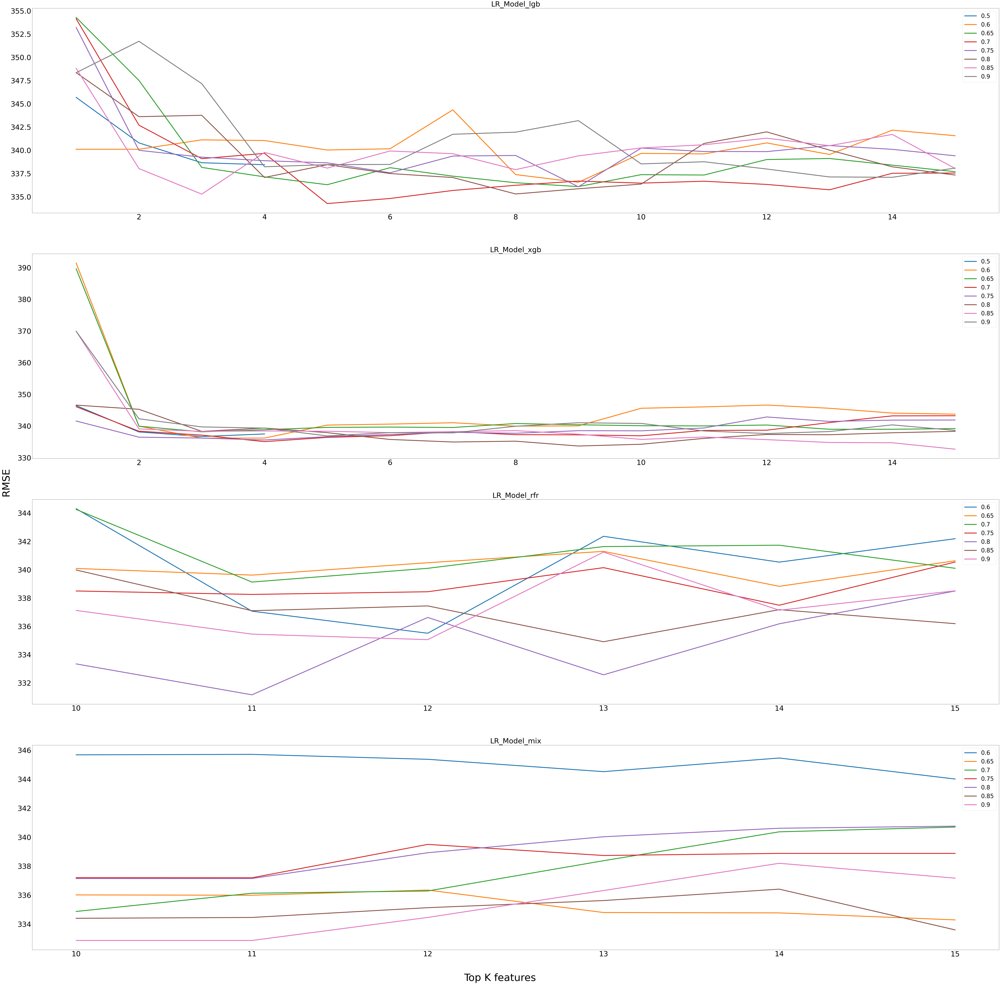

In [751]:
fig,ax = plt.subplots(len(linear_df),1,figsize=(120,120))
for order,k in zip(range(len(linear_df)),linear_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(linear_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(linear_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Electricity/Linear.png')

## ANN

In [752]:
ANN_df,ANN_min = loop_prediction(feature_under_methods,ANN_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
31/31 [==============================] - 1s 5ms/step - loss: 0.1145
ANN_mae:262.807394
 ANN_rmse:354.433329

2 5
31/31 [==============================] - 0s 5ms/step - loss: 0.1121
ANN_mae:264.870790
 ANN_rmse:350.028106

3 8
31/31 [==============================] - 1s 5ms/step - loss: 0.1121
ANN_mae:257.409095
 ANN_rmse:347.690192

4 10
31/31 [==============================] - 1s 5ms/step - loss: 0.1094
ANN_mae:258.332216
 ANN_rmse:346.902580

0.6
1 4
31/31 [==============================] - 2s 5ms/step - loss: 0.1137
ANN_mae:274.187077
 ANN_rmse:364.859424

2 4
31/31 [==============================] - 1s 5ms/step - loss: 0.1116
ANN_mae:285.482049
 ANN_rmse:378.438690

3 5
31/31 [==============================] - 0s 5ms/step - loss: 0.1108
ANN_mae:299.265855
 ANN_rmse:388.547186

4 8
31/31 [==============================] - 0s 5ms/step - loss: 0.1050
ANN_mae:257.519430
 ANN_rmse:346.296701

5 11
31/31 [==============================] - 0s 4ms/step - loss: 0.1045
ANN_mae:265.53

31/31 [==============================] - 1s 6ms/step - loss: 0.1091
ANN_mae:298.604694
 ANN_rmse:385.683191

0.7
1 3
31/31 [==============================] - 1s 7ms/step - loss: 0.1209
ANN_mae:264.092641
 ANN_rmse:356.526164

2 7
31/31 [==============================] - 1s 6ms/step - loss: 0.1101
ANN_mae:262.643703
 ANN_rmse:346.174348

3 10
31/31 [==============================] - 1s 7ms/step - loss: 0.1103
ANN_mae:261.437402
 ANN_rmse:347.821098

4 13
31/31 [==============================] - 0s 7ms/step - loss: 0.1108
ANN_mae:261.898841
 ANN_rmse:346.058159

5 15
31/31 [==============================] - 0s 6ms/step - loss: 0.1136
ANN_mae:261.390526
 ANN_rmse:347.006600

6 18
31/31 [==============================] - 0s 7ms/step - loss: 0.1068
ANN_mae:284.432819
 ANN_rmse:370.511168

7 21
31/31 [==============================] - 0s 7ms/step - loss: 0.1082
ANN_mae:260.452092
 ANN_rmse:350.789697

8 25
31/31 [==============================] - 0s 6ms/step - loss: 0.1048
ANN_mae:267.814226

31/31 [==============================] - 1s 8ms/step - loss: 0.1186
ANN_mae:283.598168
 ANN_rmse:369.274157

0.8
10 32
31/31 [==============================] - 1s 6ms/step - loss: 0.1225
ANN_mae:268.038684
 ANN_rmse:353.231975

11 33
31/31 [==============================] - 1s 6ms/step - loss: 0.1169
ANN_mae:264.156705
 ANN_rmse:353.049623

12 36
31/31 [==============================] - 1s 7ms/step - loss: 0.1150
ANN_mae:306.624488
 ANN_rmse:400.712080

13 39
31/31 [==============================] - 1s 6ms/step - loss: 0.1071
ANN_mae:308.656175
 ANN_rmse:399.908360

14 42
31/31 [==============================] - 1s 8ms/step - loss: 0.1094
ANN_mae:304.880808
 ANN_rmse:396.356794

15 46
31/31 [==============================] - 1s 7ms/step - loss: 0.1186
ANN_mae:271.002157
 ANN_rmse:362.262568

0.85
10 32
31/31 [==============================] - 1s 8ms/step - loss: 0.0990
ANN_mae:289.735025
 ANN_rmse:390.198219

11 34
31/31 [==============================] - 1s 7ms/step - loss: 0.1066
ANN

In [758]:
ANN_min = ANN_min.sort_values("Min_rmse",ascending=True)

## LGB

In [754]:
LGB_df,LGB_min = loop_prediction(feature_under_methods,LGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
LGB rmse:  353.0360138875894 LGB mae: 267.23836829463744
2 5
LGB rmse:  341.4214875062416 LGB mae: 255.93273597698186
3 8
LGB rmse:  339.4532496905441 LGB mae: 247.70850655335974
4 10
LGB rmse:  335.09344096500064 LGB mae: 248.23045413281162
0.6
1 4
LGB rmse:  336.77220426012644 LGB mae: 247.71126172891638
2 4
LGB rmse:  336.77220426012644 LGB mae: 247.71126172891638
3 5
LGB rmse:  336.44360258383927 LGB mae: 249.46073741234787
4 8
LGB rmse:  347.74912256664163 LGB mae: 259.06298879666673
5 11
LGB rmse:  349.3051238204196 LGB mae: 261.25616267668545
6 13
LGB rmse:  345.9741620994355 LGB mae: 257.20870913817726
7 17
LGB rmse:  348.85911242671716 LGB mae: 260.546869357474
8 20
LGB rmse:  342.7142548658329 LGB mae: 254.89180876514763
9 24
LGB rmse:  342.38506240435066 LGB mae: 254.4661768690187
10 29
LGB rmse:  338.3345676693041 LGB mae: 249.57127585371975
11 30
LGB rmse:  339.2346327050133 LGB mae: 249.17481121838824
12 31
LGB rmse:  337.53548390002476 LGB mae: 248.49524903159516

LGB rmse:  348.26902062076897 LGB mae: 257.4540129784197
7 21
LGB rmse:  346.0530154944567 LGB mae: 259.49458529835823
8 24
LGB rmse:  339.25157769305184 LGB mae: 248.49253971684058
9 27
LGB rmse:  342.80227488278234 LGB mae: 251.9423424837946
10 30
LGB rmse:  344.4124552664563 LGB mae: 253.79127265076838
11 34
LGB rmse:  337.3547991062561 LGB mae: 249.3731233643731
12 37
LGB rmse:  333.2873371724726 LGB mae: 245.57228970449125
13 39
LGB rmse:  336.18490442424456 LGB mae: 248.9256380362342
14 40
LGB rmse:  337.7701443431224 LGB mae: 250.39208307367363
15 43
LGB rmse:  327.8662518809005 LGB mae: 238.39422273806508
0.7
1 3
LGB rmse:  359.4820134087212 LGB mae: 273.96735981415395
2 7
LGB rmse:  333.2686341699478 LGB mae: 253.26671831669577
3 10
LGB rmse:  334.2132238529181 LGB mae: 253.01167338221595
4 13
LGB rmse:  339.8755873788556 LGB mae: 258.8165376230633
5 15
LGB rmse:  350.87281742626874 LGB mae: 267.56455456155203
6 18
LGB rmse:  337.0892509790728 LGB mae: 252.27908769983318
7 21


LGB rmse:  338.8071749097543 LGB mae: 254.64259458388915
14 33
LGB rmse:  343.4719899354507 LGB mae: 255.82916584315416
15 37
LGB rmse:  344.24055700570983 LGB mae: 252.36228145504776
0.65
10 32
LGB rmse:  338.71753396311806 LGB mae: 250.9372139805331
11 36
LGB rmse:  337.3043264687222 LGB mae: 250.18811410337872
12 37
LGB rmse:  331.16688028981014 LGB mae: 244.16709774702508
13 40
LGB rmse:  331.5630243308838 LGB mae: 244.7698499218029
14 42
LGB rmse:  331.2452962123821 LGB mae: 245.8455919380372
15 45
LGB rmse:  335.35260450737724 LGB mae: 250.94527632695855
0.7
10 33
LGB rmse:  329.2998500053387 LGB mae: 244.01284603657504
11 35
LGB rmse:  328.33230507190837 LGB mae: 244.78709077990084
12 37
LGB rmse:  329.56991568765403 LGB mae: 242.1415141544103
13 40
LGB rmse:  334.2930101550988 LGB mae: 247.2016314886221
14 42
LGB rmse:  329.06856300218016 LGB mae: 245.31057439149313
15 43
LGB rmse:  335.47721036884366 LGB mae: 247.41193952329496
0.75
10 35
LGB rmse:  335.44087039928434 LGB mae:

In [759]:
LGB_min = LGB_min.sort_values("Min_rmse",ascending=True)

### XGB

In [756]:
XGB_df,XGB_min = loop_prediction(feature_under_methods,XGB_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
XGB rmse:  355.0089451062061 XGB mae: 260.38983112765374
2 5
XGB rmse:  351.15463176366825 XGB mae: 257.3324944361189
3 8
XGB rmse:  338.72301225184395 XGB mae: 254.35592213598648
4 10
XGB rmse:  339.9718655287222 XGB mae: 255.79292734111712
0.6
1 4
XGB rmse:  333.33102681784203 XGB mae: 244.0195767967702
2 4
XGB rmse:  333.33102681784203 XGB mae: 244.0195767967702
3 5
XGB rmse:  339.97751248535894 XGB mae: 246.9094456563045
4 8
XGB rmse:  351.9031727899672 XGB mae: 261.204613076671
5 11
XGB rmse:  344.94183516002687 XGB mae: 255.83879050220375
6 13
XGB rmse:  345.7032836316099 XGB mae: 259.79810131478666
7 17
XGB rmse:  341.30372988824706 XGB mae: 258.070524174649
8 20
XGB rmse:  340.22177134932025 XGB mae: 257.6869139335104
9 24
XGB rmse:  339.44624277893996 XGB mae: 253.5848558369956
10 29
XGB rmse:  335.6000943300866 XGB mae: 254.23605821145728
11 30
XGB rmse:  333.2575746169427 XGB mae: 255.08035630284698
12 31
XGB rmse:  336.49684718212603 XGB mae: 256.35288237672074
13 3

XGB rmse:  358.4286831264858 XGB mae: 270.30968930753573
6 19
XGB rmse:  355.62349193604126 XGB mae: 270.4024668269882
7 21
XGB rmse:  356.65194633984964 XGB mae: 271.18872028665174
8 24
XGB rmse:  346.83584698165953 XGB mae: 260.837264768556
9 27
XGB rmse:  345.89490208963394 XGB mae: 260.1619612508606
10 30
XGB rmse:  344.524367554764 XGB mae: 258.84772268977287
11 34
XGB rmse:  342.56172482183126 XGB mae: 256.81827505524444
12 37
XGB rmse:  339.87028244781027 XGB mae: 254.68896697910708
13 39
XGB rmse:  339.9698634765539 XGB mae: 255.5978345806971
14 40
XGB rmse:  339.09249846799855 XGB mae: 255.65317309073188
15 43
XGB rmse:  335.6869282172398 XGB mae: 250.7227835989766
0.7
1 3
XGB rmse:  358.5484324270943 XGB mae: 268.04886197247635
2 7
XGB rmse:  340.76420061166687 XGB mae: 259.6803209792766
3 10
XGB rmse:  347.1657038850166 XGB mae: 264.0534133108726
4 13
XGB rmse:  346.6228261251458 XGB mae: 266.36871112117143
5 15
XGB rmse:  358.63714085158205 XGB mae: 272.85655731458905
6 18


XGB rmse:  340.09813393643356 XGB mae: 256.88190004834297
14 33
XGB rmse:  339.28489466039383 XGB mae: 257.4800858419467
15 37
XGB rmse:  345.75385956381206 XGB mae: 262.0764578432442
0.65
10 32
XGB rmse:  340.8997553513433 XGB mae: 256.4654516405193
11 36
XGB rmse:  342.56548582339025 XGB mae: 257.32905134824074
12 37
XGB rmse:  338.71353323951666 XGB mae: 254.5820450143875
13 40
XGB rmse:  335.86302657708296 XGB mae: 251.42432495827828
14 42
XGB rmse:  335.54561661949487 XGB mae: 251.75678290882644
15 45
XGB rmse:  335.66508658133364 XGB mae: 253.91061657778468
0.7
10 33
XGB rmse:  336.7946219735163 XGB mae: 255.15307200410857
11 35
XGB rmse:  334.7811073786484 XGB mae: 253.58407954511168
12 37
XGB rmse:  335.608542860581 XGB mae: 252.4820190126526
13 40
XGB rmse:  337.2567846813618 XGB mae: 254.23383063821427
14 42
XGB rmse:  335.3728811864954 XGB mae: 253.89441845119728
15 43
XGB rmse:  336.8536135624334 XGB mae: 254.11289651444696
0.75
10 35
XGB rmse:  341.9949458796978 XGB mae: 2

In [760]:
XGB_min=XGB_min.sort_values("Min_rmse",ascending=True)

### Random Forest

In [482]:
RF_df,RF_min = loop_prediction(feature_under_methods,RF_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
RandomForest_mae:262.356784
 RandomForest_rmse:351.946482

2 5
RandomForest_mae:257.142981
 RandomForest_rmse:351.442872

3 8
RandomForest_mae:254.420561
 RandomForest_rmse:338.682869

4 10
RandomForest_mae:252.930258
 RandomForest_rmse:337.754244

0.6
1 4
RandomForest_mae:245.685915
 RandomForest_rmse:337.182639

2 4
RandomForest_mae:245.400547
 RandomForest_rmse:338.062171

3 5
RandomForest_mae:248.349390
 RandomForest_rmse:337.121131

4 8
RandomForest_mae:253.352489
 RandomForest_rmse:338.940384

5 11
RandomForest_mae:248.243628
 RandomForest_rmse:327.862100

6 13
RandomForest_mae:252.493672
 RandomForest_rmse:336.050551

7 17
RandomForest_mae:253.298448
 RandomForest_rmse:335.583692

8 20
RandomForest_mae:263.920487
 RandomForest_rmse:346.276715

9 24
RandomForest_mae:254.589938
 RandomForest_rmse:337.608028

10 29
RandomForest_mae:256.044290
 RandomForest_rmse:337.811845

11 30
RandomForest_mae:248.162005
 RandomForest_rmse:330.614428

12 31
RandomForest_mae:250.818586
 Ra

RandomForest_mae:244.269189
 RandomForest_rmse:330.435294

0.65
1 5
RandomForest_mae:295.450966
 RandomForest_rmse:382.166223

2 8
RandomForest_mae:259.650169
 RandomForest_rmse:345.928115

3 11
RandomForest_mae:254.805495
 RandomForest_rmse:339.808180

4 14
RandomForest_mae:262.100266
 RandomForest_rmse:345.285029

5 17
RandomForest_mae:260.721787
 RandomForest_rmse:342.264116

6 19
RandomForest_mae:261.544544
 RandomForest_rmse:344.492444

7 21
RandomForest_mae:257.368192
 RandomForest_rmse:339.912200

8 24
RandomForest_mae:254.075639
 RandomForest_rmse:336.620773

9 27
RandomForest_mae:252.274842
 RandomForest_rmse:336.278900

10 30
RandomForest_mae:253.491655
 RandomForest_rmse:332.836049

11 34
RandomForest_mae:255.842723
 RandomForest_rmse:335.996263

12 37
RandomForest_mae:255.952028
 RandomForest_rmse:335.732167

13 39
RandomForest_mae:261.312890
 RandomForest_rmse:341.887812

14 40
RandomForest_mae:250.712193
 RandomForest_rmse:331.438364

15 43
RandomForest_mae:252.706564
 Ra

RandomForest_mae:249.920953
 RandomForest_rmse:330.453508

11 30
RandomForest_mae:247.025096
 RandomForest_rmse:328.478188

12 33
RandomForest_mae:247.387170
 RandomForest_rmse:327.661535

13 38
RandomForest_mae:247.397497
 RandomForest_rmse:328.033460

14 41
RandomForest_mae:246.994742
 RandomForest_rmse:330.611061

15 44
RandomForest_mae:250.399902
 RandomForest_rmse:332.228210

0.5
0.55
0.6
10 23
RandomForest_mae:252.594072
 RandomForest_rmse:334.878106

11 26
RandomForest_mae:256.040616
 RandomForest_rmse:334.283361

12 30
RandomForest_mae:253.469043
 RandomForest_rmse:335.191491

13 31
RandomForest_mae:256.904056
 RandomForest_rmse:337.502608

14 33
RandomForest_mae:252.363281
 RandomForest_rmse:332.585028

15 37
RandomForest_mae:245.985666
 RandomForest_rmse:328.663003

0.65
10 32
RandomForest_mae:249.284386
 RandomForest_rmse:331.975139

11 36
RandomForest_mae:255.440928
 RandomForest_rmse:335.920477

12 37
RandomForest_mae:254.381927
 RandomForest_rmse:337.857717

13 40
RandomF

In [761]:
RF_min = RF_min.sort_values("Min_rmse",ascending=True)

## SVR

In [484]:
SVR_df,SVR_min = loop_prediction(feature_under_methods,SVR_Model,X_train_lag,Y_train_lag,X_test_lag,Y_test_lag)

0.5
1 3
SVR rmse:  341.13087304034224 SVR mae: 253.92025181655518
2 5
SVR rmse:  337.24650915549665 SVR mae: 251.1188606409662
3 8
SVR rmse:  341.2705609218385 SVR mae: 254.6554397165792
4 10
SVR rmse:  346.0673570632997 SVR mae: 258.3499969791817
0.6
1 4
SVR rmse:  333.491555251255 SVR mae: 245.63202950002503
2 4
SVR rmse:  333.491555251255 SVR mae: 245.63202950002503
3 5
SVR rmse:  344.1497712965482 SVR mae: 251.65627936712005
4 8
SVR rmse:  347.5415747308762 SVR mae: 252.96007980715345
5 11
SVR rmse:  345.54625959454614 SVR mae: 250.56394645873493
6 13
SVR rmse:  344.5714375084448 SVR mae: 251.00950497855163
7 17
SVR rmse:  356.4855413740487 SVR mae: 259.64826235531706
8 20
SVR rmse:  349.71273318799905 SVR mae: 253.70152584583752
9 24
SVR rmse:  351.30112978980725 SVR mae: 255.33783180645165
10 29
SVR rmse:  354.8088233337212 SVR mae: 257.4549938223174
11 30
SVR rmse:  356.43749920503313 SVR mae: 257.8179916261538
12 31
SVR rmse:  354.6477188141416 SVR mae: 256.0807530267345
13 33


SVR rmse:  338.6473428611309 SVR mae: 251.83755787646913
6 19
SVR rmse:  337.70792696321246 SVR mae: 251.61767628149497
7 21
SVR rmse:  344.48960406795857 SVR mae: 252.4729629223724
8 24
SVR rmse:  355.48113891048285 SVR mae: 258.06473785435804
9 27
SVR rmse:  359.6149903993163 SVR mae: 264.4986165770578
10 30
SVR rmse:  367.9277200806965 SVR mae: 270.2681255387527
11 34
SVR rmse:  369.0992231418952 SVR mae: 270.2738732549439
12 37
SVR rmse:  372.5537983482835 SVR mae: 273.54726864664286
13 39
SVR rmse:  371.6112143864869 SVR mae: 272.7081705439467
14 40
SVR rmse:  367.9432155960996 SVR mae: 270.19816721549273
15 43
SVR rmse:  365.29813952879874 SVR mae: 265.6882749403207
0.7
1 3
SVR rmse:  341.1505243896553 SVR mae: 251.06982680226864
2 7
SVR rmse:  335.06129815150143 SVR mae: 253.2857830131539
3 10
SVR rmse:  336.4281209515095 SVR mae: 252.82653321985484
4 13
SVR rmse:  332.1399413545573 SVR mae: 248.70162364671077
5 15
SVR rmse:  338.25734449402773 SVR mae: 249.6336911442468
6 18
SV

SVR rmse:  354.4339795884123 SVR mae: 259.24952056467424
14 33
SVR rmse:  356.4323940126846 SVR mae: 260.0292787897581
15 37
SVR rmse:  365.55651708742965 SVR mae: 268.88982144596514
0.65
10 32
SVR rmse:  362.07552421863113 SVR mae: 264.0199582414267
11 36
SVR rmse:  363.4254684356029 SVR mae: 264.08483410194526
12 37
SVR rmse:  363.3809674273659 SVR mae: 263.4663142924917
13 40
SVR rmse:  356.726090999756 SVR mae: 259.0799069425858
14 42
SVR rmse:  356.7899730908898 SVR mae: 262.71732026600984
15 45
SVR rmse:  366.34638286644514 SVR mae: 271.9055819450944
0.7
10 33
SVR rmse:  350.52920077643176 SVR mae: 262.43676179360307
11 35
SVR rmse:  359.0185271204454 SVR mae: 269.5288385186648
12 37
SVR rmse:  358.30762470982376 SVR mae: 269.13367159401486
13 40
SVR rmse:  367.74116741454077 SVR mae: 275.9765549876537
14 42
SVR rmse:  367.11006258669056 SVR mae: 269.1253852855003
15 43
SVR rmse:  368.8952691725743 SVR mae: 268.9827994148477
0.75
10 35
SVR rmse:  360.4240933976332 SVR mae: 274.95

In [762]:
SVR_min = SVR_min.sort_values("Min_rmse")

In [763]:
all_min = pd.concat([linear_min,ANN_min,LGB_min,XGB_min,RF_min,SVR_min],axis=0)

The following 2 functions are all aimed at putting the results of benchmark to the feature selection method-based dataframe

In [614]:
def find_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return np.round((orginal_df[i] - x)/orginal_df[i],3)

In [624]:
def add_orginal_rmse(x,orginal_df):
    for i in orginal_df.index:
        if all_min[all_min['Min_rmse'].isin([x])].index[0][:-4]==i:
            return orginal_df[i]

In [764]:
all_df

,LR_Model,RF_Model,ANN_Model,XGB_Model,LGB_Model,SVR_Model
rmse,368.677651,330.215750,364.731415,337.895687,333.471159,370.983612
mae,275.112069,246.846927,275.270957,254.228316,249.102626,274.756199
mape,0.205333,0.183259,0.213852,0.187989,0.183341,0.200541


In [765]:
all_min['all'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['raw'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['pacf'] = all_min['Min_rmse'].apply(add_orginal_rmse,args=(pacf_df.loc['rmse'],))

In [766]:
all_min['Improving_all'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(all_df.loc['rmse'],))
all_min['Improving_raw'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(raw_df.loc['rmse'],))
all_min['Improving_pacf'] = all_min['Min_rmse'].apply(find_orginal_rmse,args=(pacf_df.loc['rmse'],))

The final result

In [767]:
all_min

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LR_Model_rfr,331.160980,0.80,11,33,368.677651,341.523376,351.104437,0.102,0.030,0.057
LR_Model_xgb,332.686878,0.85,15,49,368.677651,341.523376,351.104437,0.098,0.026,0.052
LR_Model_mix,332.867317,0.90,10,34,368.677651,341.523376,351.104437,0.097,0.025,0.052
LR_Model_lgb,334.270499,0.70,5,16,368.677651,341.523376,351.104437,0.093,0.021,0.048
ANN_Model_xgb,340.407085,0.60,3,7,364.731415,397.813376,488.080610,0.067,0.144,0.303
ANN_Model_lgb,340.620212,0.85,3,11,364.731415,397.813376,488.080610,0.066,0.144,0.302
ANN_Model_rfr,343.412686,0.80,14,40,364.731415,397.813376,488.080610,0.058,0.137,0.296
ANN_Model_mix,348.554318,0.70,12,37,364.731415,397.813376,488.080610,0.044,0.124,0.286
LGB_Model_rfr,324.404029,0.75,14,41,333.471159,359.757879,334.528820,0.027,0.098,0.030
LGB_Model_lgb,324.756256,0.75,15,46,333.471159,359.757879,334.528820,0.026,0.097,0.029


In [768]:
all_sort=all_min.sort_values("Min_rmse")

## Ranking all methods to get the best combination of model and feature selection

In [769]:
all_sort

,Min_rmse,Threshold,Top_k,Number_of_Feature,all,raw,pacf,Improving_all,Improving_raw,Improving_pacf
LGB_Model_rfr,324.404029,0.75,14,41,333.471159,359.757879,334.528820,0.027,0.098,0.030
LGB_Model_lgb,324.756256,0.75,15,46,333.471159,359.757879,334.528820,0.026,0.097,0.029
RF_Model_lgb,326.593816,0.85,13,38,330.215750,339.452630,339.152567,0.011,0.038,0.037
RF_Model_rfr,326.865763,0.60,10,22,330.215750,339.452630,339.152567,0.010,0.037,0.036
LGB_Model_xgb,327.538998,0.50,2,4,333.471159,359.757879,334.528820,0.018,0.090,0.021
LGB_Model_mix,327.807809,0.75,14,43,333.471159,359.757879,334.528820,0.017,0.089,0.020
RF_Model_mix,328.258534,0.80,10,32,330.215750,339.452630,339.152567,0.006,0.033,0.032
XGB_Model_rfr,328.657384,0.65,10,31,337.895687,366.546026,343.672749,0.027,0.103,0.044
RF_Model_xgb,330.435294,0.60,15,38,330.215750,339.452630,339.152567,-0.001,0.027,0.026
SVR_Model_lgb,330.802676,0.85,2,7,370.983612,332.364491,364.081402,0.108,0.005,0.091


In [651]:
print(all_sort.to_latex())

\begin{tabular}{lrrrrrrrrrr}
\toprule
{} &    Min\_rmse &  Threshold &  Top\_k &  Number\_of\_Feature &         all &         raw &        pacf &  Improving\_all &  Improving\_raw &  Improving\_pacf \\
\midrule
LGB\_Model\_rfr &  324.404029 &       0.75 &     14 &                 41 &  333.471159 &  359.757879 &  334.528820 &          0.027 &          0.098 &           0.030 \\
LGB\_Model\_lgb &  324.756256 &       0.75 &     15 &                 46 &  333.471159 &  359.757879 &  334.528820 &          0.026 &          0.097 &           0.029 \\
RF\_Model\_lgb  &  326.593816 &       0.85 &     13 &                 38 &  330.215750 &  339.452630 &  339.152567 &          0.011 &          0.038 &           0.037 \\
RF\_Model\_rfr  &  326.865763 &       0.60 &     10 &                 22 &  330.215750 &  339.452630 &  339.152567 &          0.010 &          0.037 &           0.036 \\
LGB\_Model\_xgb &  327.538998 &       0.50 &      2 &                  4 &  333.471159 &  359.757879 &  334.5

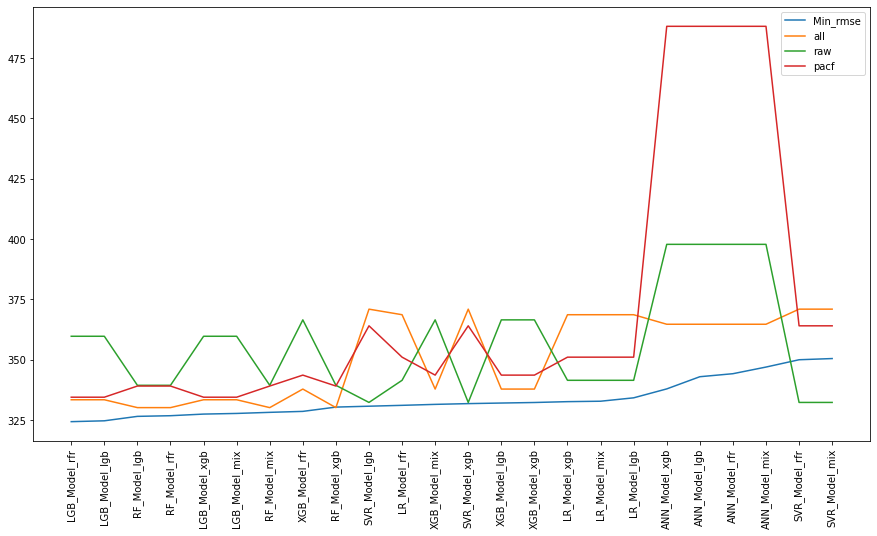

In [652]:
# plt.figure()
all_sort[['Min_rmse','all','raw','pacf']].plot(figsize=(15,8))
plt.xticks(range(0,len(all_sort.index),1),all_sort.index,rotation=90)
plt.savefig("./pic/RMSE/Electricity/Compare.png")
plt.show()

### Plotting the benchmark and feature selection method

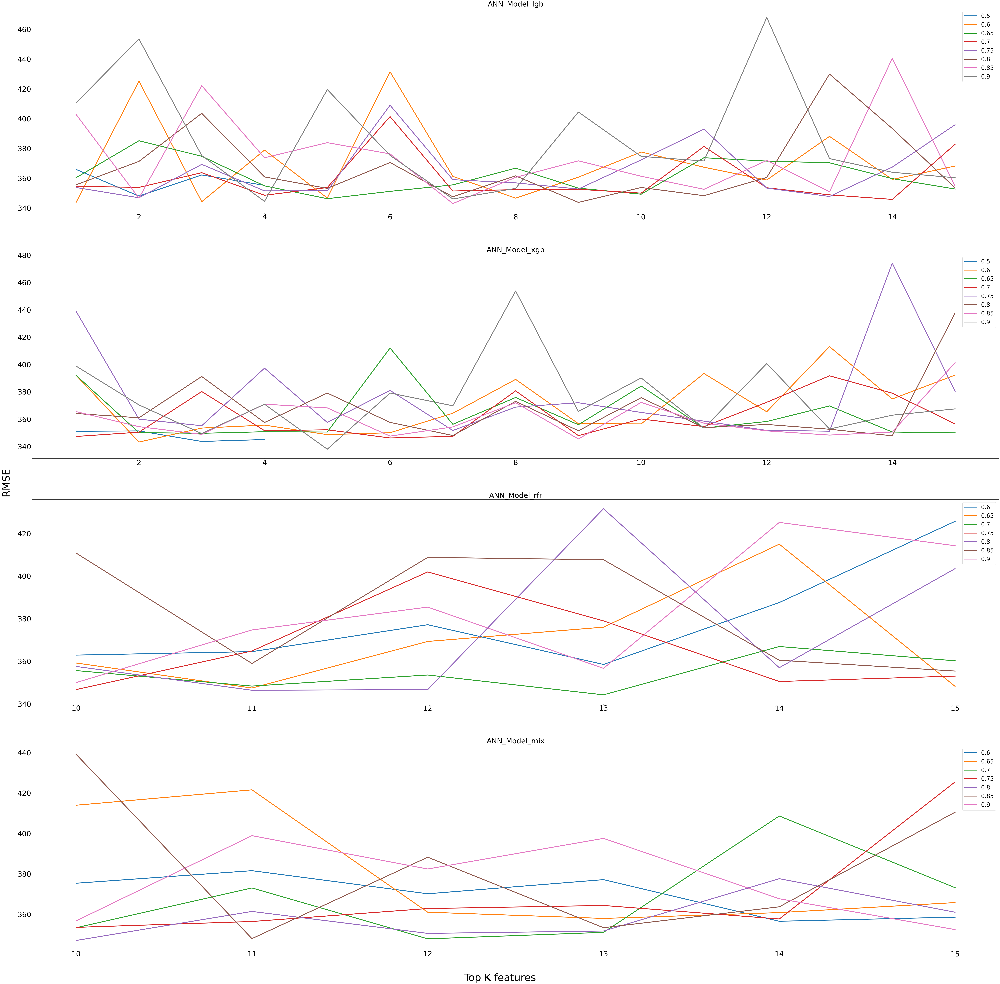

In [495]:
fig,ax = plt.subplots(len(ANN_df),1,figsize=(120,120))
for order,k in zip(range(len(ANN_df)),ANN_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(ANN_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(ANN_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Electricity/ANN.png')

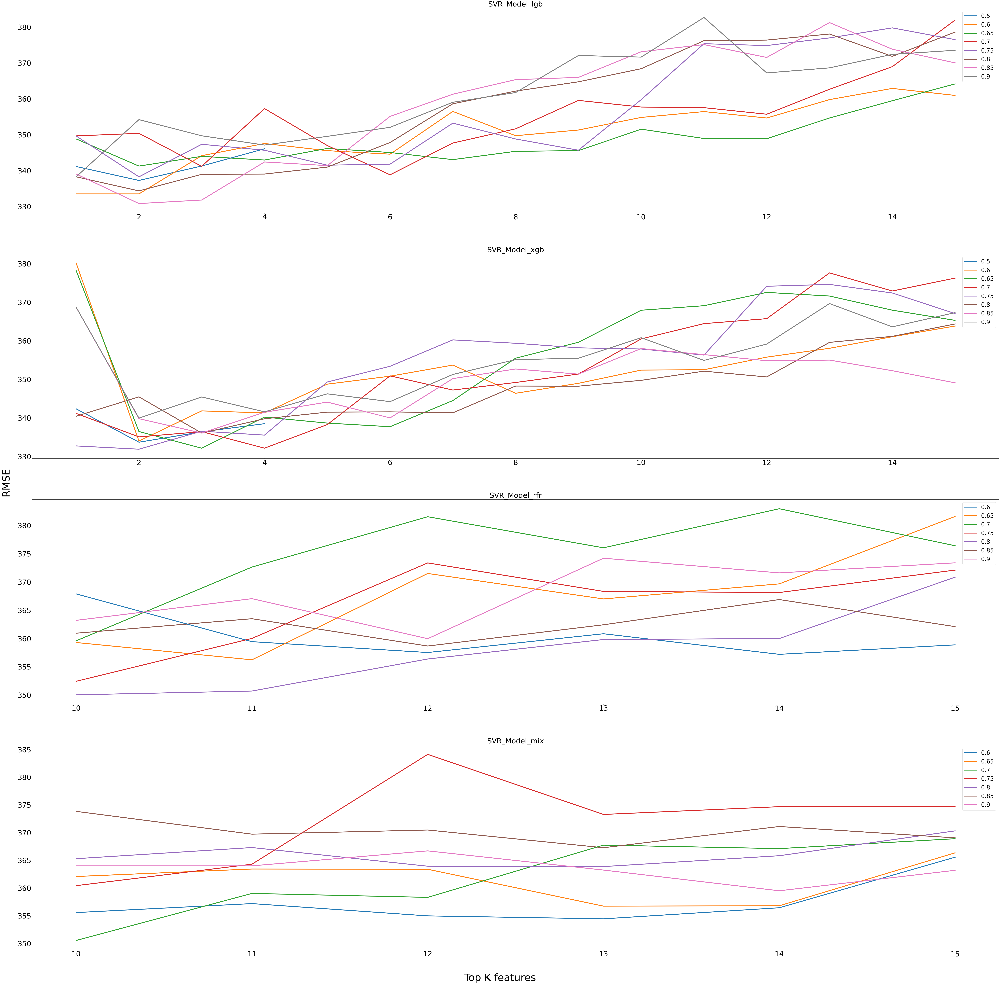

In [496]:
fig,ax = plt.subplots(len(SVR_df),1,figsize=(120,120))
for order,k in zip(range(len(SVR_df)),SVR_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(SVR_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(SVR_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Electricity/SVR.png')

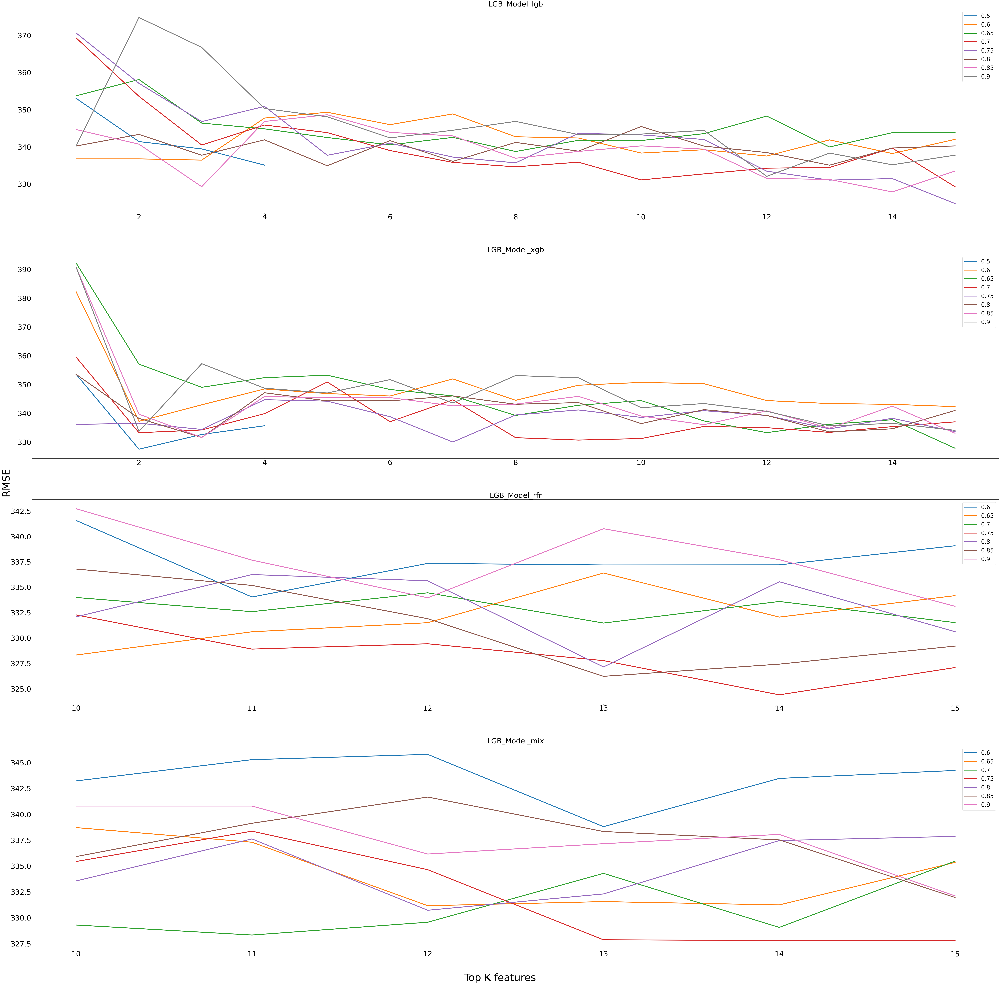

In [497]:
fig,ax = plt.subplots(len(LGB_df),1,figsize=(120,120))
for order,k in zip(range(len(LGB_df)),LGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(LGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(LGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Electricity/LGB.png')

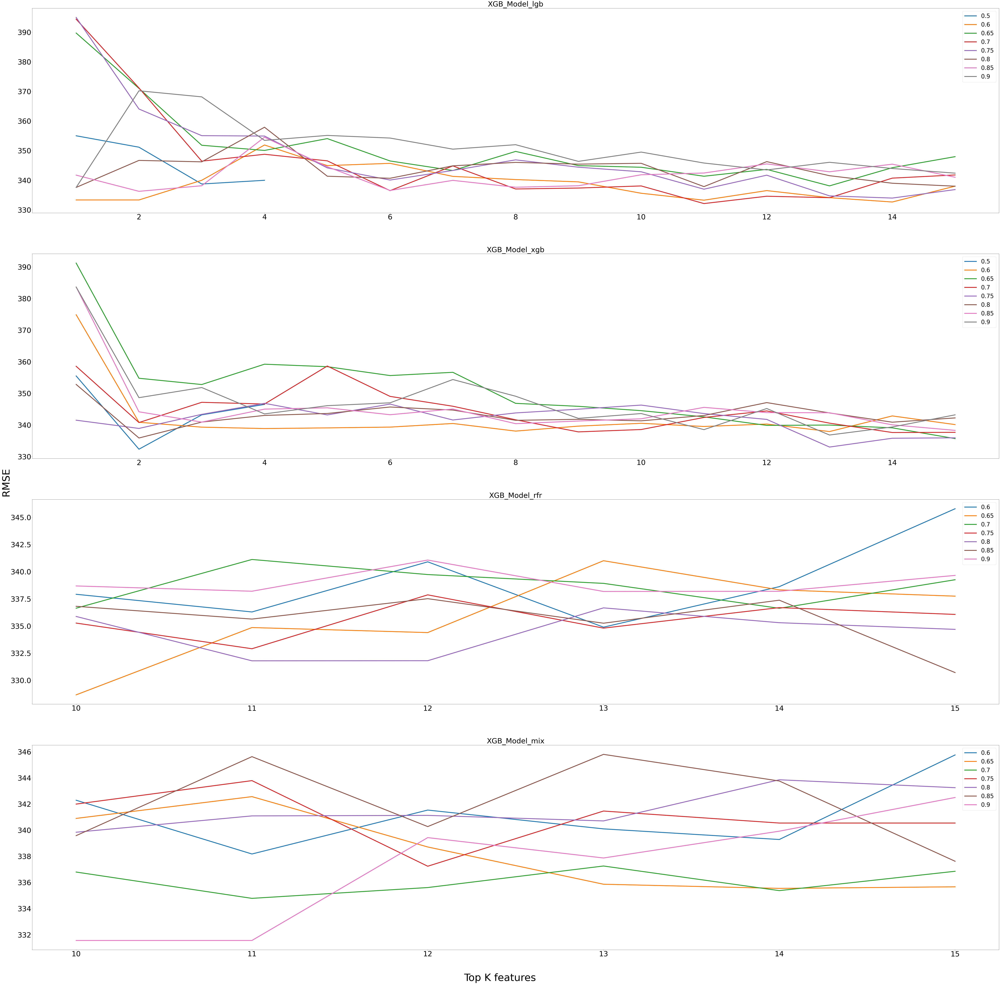

In [498]:
fig,ax = plt.subplots(len(XGB_df),1,figsize=(120,120))
for order,k in zip(range(len(XGB_df)),XGB_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(XGB_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(XGB_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Electricity/XGB.png')

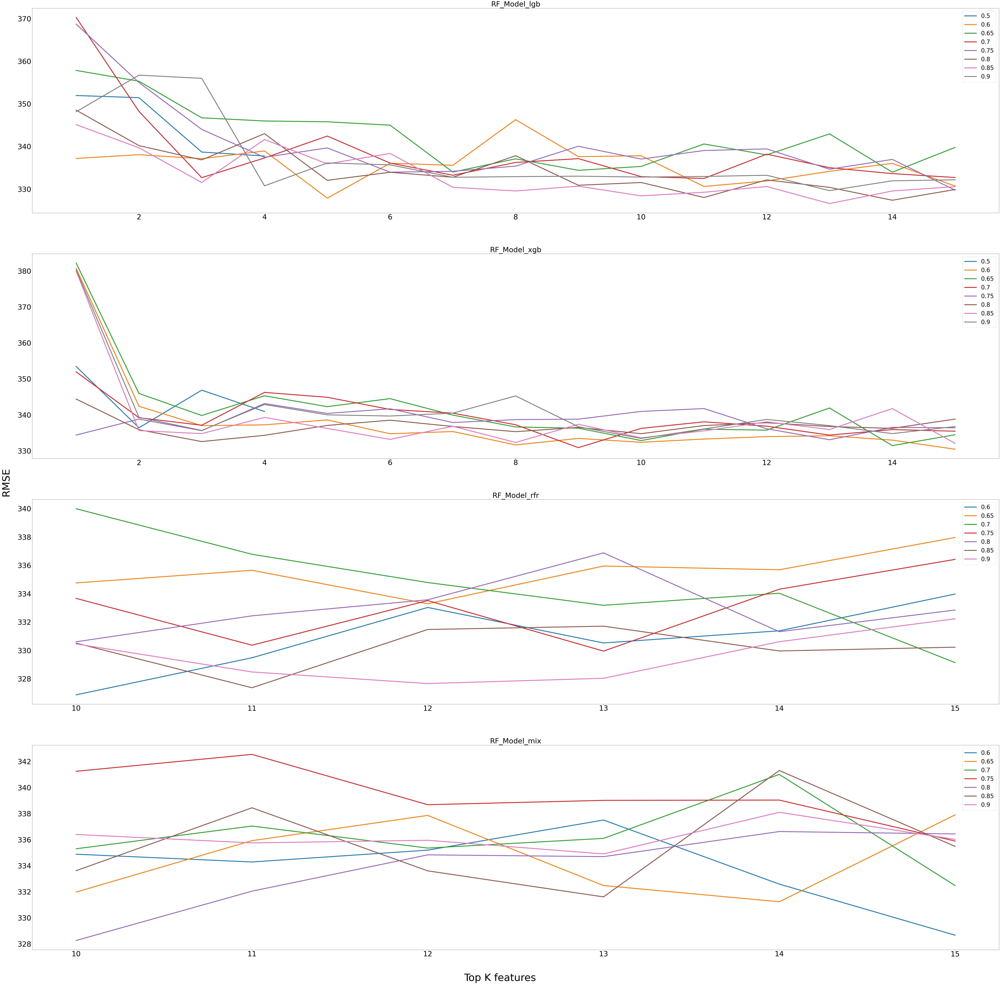

In [500]:
fig,ax = plt.subplots(len(RF_df),1,figsize=(120,120))
for order,k in zip(range(len(RF_df)),RF_df.keys()):
    ax[order].set_title(k,fontsize=50)
    ax[order].plot(RF_df[k].loc[:,pd.IndexSlice[:,'rmse']],linewidth=6)
    ax[order].legend(RF_df[k].columns.levels[0],fontsize=40)
    ax[order].tick_params(labelsize=50)

fig.text(0.5, 0.1, 'Top K features', ha='center',fontsize=70)
fig.text(0.1, 0.5, 'RMSE', va='center', rotation='vertical',fontsize=70)
plt.savefig('./pic/RMSE/Electricity/RF.png')

## Plot the prediction curve for data

In [743]:
def LGB_plot(X_train,Y_train,X_test,Y_test):
    minmax_x_train = MinMaxScaler(feature_range = (0,1))
    minmax_y_train = MinMaxScaler(feature_range = (0,1))
    minmax_x_test = MinMaxScaler(feature_range = (0,1))
    minmax_y_test = MinMaxScaler(feature_range = (0,1))

    x_train = minmax_x_train.fit_transform(X_train)
    y_train = minmax_y_train.fit_transform(Y_train.values.reshape(-1,1))
    x_test = minmax_x_test.fit_transform(X_test)
    y_test= minmax_y_test.fit_transform(Y_test.values.reshape((-1,1)))
    y_test_inverse = minmax_y_test.inverse_transform( y_test.reshape(-1,1) )
    
    gbm = lgb.LGBMRegressor(max_depth=12)
    gbm.fit(x_train, y_train)
    y_gbm = gbm.predict(x_test)
    y_gbm_inverse =minmax_y_test.inverse_transform(y_gbm.reshape((-1,1)))
    
    y_df = pd.DataFrame({
        'Actual':y_gbm_inverse.reshape(-1,),
        'Predicted':y_test_inverse.reshape(-1,)
    },index=Y_test.index)
    print(r2_score(y_gbm_inverse.reshape(-1,),y_test_inverse.reshape(-1,)))
    plt.figure(figsize=(15,8))
    plt.xticks(range(0,len(y_df.index),10),rotation=45)
    plt.plot(y_df['Actual'],label='Actual')
    plt.plot(y_df['Predicted'],linestyle='dashdot',label='Predicted')
    plt.legend()
    plt.savefig("./pic/RMSE/Electricity/Final_prediction.png")
    return y_df

In [736]:
Y_test_lag.index

Index(['2010-02-16', '2010-02-17', '2010-02-18', '2010-02-19', '2010-02-20',
       '2010-02-21', '2010-02-22', '2010-02-23', '2010-02-24', '2010-02-25',
       ...
       '2010-11-16', '2010-11-17', '2010-11-18', '2010-11-19', '2010-11-20',
       '2010-11-21', '2010-11-22', '2010-11-23', '2010-11-24', '2010-11-25'],
      dtype='object', name='date_time', length=283)

-0.36695731077585325


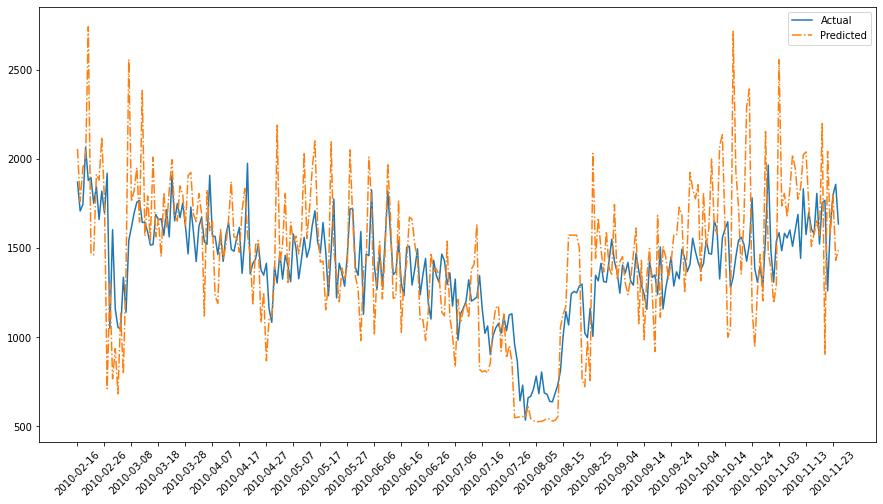

In [744]:
yy = LGB_plot(X_train_lag[real_rfr[0.75][14]],Y_train_lag,X_test_lag[real_rfr[0.75][14]],Y_test_lag)